# Instructions for using this notebook
To use this notebook, follow the instructions below to first install the required libraries. Once all the libraries are place, you can run the notebook by pressing the play button to run just one cell. To run the whole notebook use the double play button and click okay in the dialog that appears.
## Required libraries
1\. PYROSM <br>
2\. PANDAS <br>
3\. GEOPANDAS <br>
4\. GEOJSON <br>
5\. GEOJSONIO <br>
6\. JSON
### Install the libraries
if any library is missing, please use the intructions below to install them. If the instructions are note here then do a goole search with the reported error log for it. That should help.
#### Instructions for installing PYROSM
To perform the installation, please follow the instructions in the link:
__https://pyrosm.readthedocs.io/en/latest/installation.html__
#### Instructions for PANDAS
if Pandas is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pandas.pydata.org/docs/getting_started/install.html__ 
#### Instructions for GEOPANDAS
Usually the installation of PYROSM will install GEOPANDAS. if GEOPANDAS is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://geopandas.org/en/stable/getting_started/install.html__
#### Instructions for GEOJSON
if GEOJSON is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pypi.org/project/geojson/__
#### Instructions for GEOJSONIO
This libray is used to display data in geojson format in map through the link: __https://geojson.io/#map=2/20.0/0.0__ <br>
To install GEOJSONIO, follow the instruction in the link: __https://pypi.org/project/geojsonio/__
#### Instructions for JSON
if it is not already in your Python environment then use: pip install json 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# import the needed libraries. The import is global
from pyrosm import OSM
from pyrosm import get_data

import geopandas
import pandas as pd

import geojson

import geojsonio

import pika

from turfpy.measurement import rhumb_bearing

import sys
import os
import datetime
from datetime import datetime
from datetime import timedelta


In [4]:
# path for user defined modules
modules_path = os.path.abspath(os.path.join('../python-modules'))
sys.path.insert(0, modules_path)

In [5]:
# import user defined python modules
import shapely_json_lines as sjl
import constant_data as cData
import GeometryData as gdata
import FeatureCollectionData as fcData
import neighbour_search as nb_s
import RoadNetworkManager as nManager
import ConnectedLinesData
import CummulativeDistanceAndTime
import EnrichedCoordinates
import connectedsegments
import neighboursearch
import filterfunctions

In [6]:
# paths
data_path = "../../../data/"

In [7]:
# set the file containing the map data.
osm = OSM(data_path + "gothenburg.osm.pbf")

In [8]:
# Read road networks from the map
nodes, edges = osm.get_network(network_type="driving", nodes=True)

In [9]:
#edges.explore()

In [10]:
nodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 360767 entries, 0 to 360766
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   lon        360767 non-null  float64 
 1   lat        360767 non-null  float64 
 2   tags       12684 non-null   object  
 3   timestamp  360767 non-null  int8    
 4   version    360767 non-null  int8    
 5   changeset  360767 non-null  int8    
 6   id         360767 non-null  int64   
 7   geometry   360767 non-null  geometry
dtypes: float64(2), geometry(1), int64(1), int8(3), object(1)
memory usage: 14.8+ MB


In [11]:
def filternetwork():
    return(edges[(edges['name'].isin(cData.selected_road_names)) | \
                     (edges['ref'].isin(cData.road_ref_list)) | \
                     (edges['id'].isin(cData.road_id_list)) | \
                     (edges['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [12]:
filtered_network_graph = filternetwork()

In [13]:
#filtered_network_graph.explore()

In [14]:
filtered_network_graph.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 13945 entries, 42 to 370533
Data columns (total 38 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   access         141 non-null    object  
 1   area           0 non-null      object  
 2   bicycle        195 non-null    object  
 3   bridge         676 non-null    object  
 4   cycleway       12 non-null     object  
 5   foot           153 non-null    object  
 6   highway        13945 non-null  object  
 7   int_ref        2557 non-null   object  
 8   junction       672 non-null    object  
 9   lanes          10377 non-null  object  
 10  lit            2712 non-null   object  
 11  maxspeed       12547 non-null  object  
 12  motorcar       0 non-null      object  
 13  motorroad      25 non-null     object  
 14  motor_vehicle  2 non-null      object  
 15  name           6436 non-null   object  
 16  oneway         11822 non-null  object  
 17  overtaking     0 non-

In [15]:
gdf_E6 = filtered_network_graph[filtered_network_graph['ref'] == 'E 6']

In [16]:
def filternodes(rnetwork):
    return(nodes[(nodes['id'].isin(rnetwork.v)) | \
                (nodes['id'].isin(rnetwork.u))])

In [17]:
filtered_nodes = filternodes(filtered_network_graph)

(57.55, 57.875)

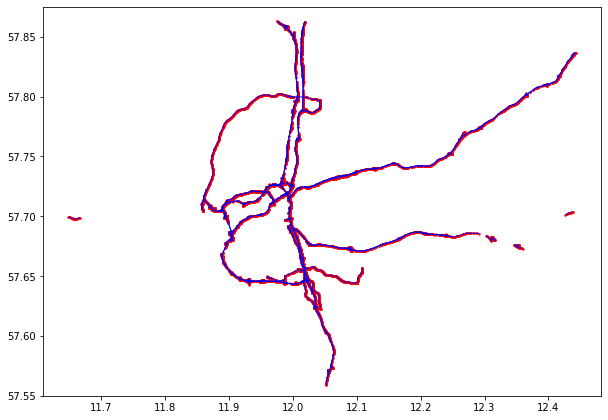

In [18]:
ax = filtered_network_graph.plot(figsize=(10,10), color="blue", lw=1.0)
ax = filtered_nodes.plot(ax=ax, color="red", markersize=2)
ax.set_ylim([57.55, 57.875])

<AxesSubplot:>

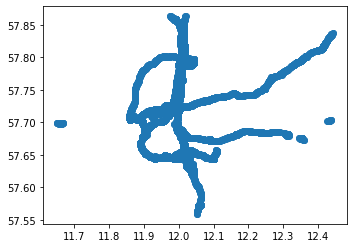

In [19]:
filtered_nodes.plot()

In [20]:
segments = [4040302, 284402021, 226048677]#, 13865743,13865744, 284402510]
gdf_test_segments = filtered_network_graph[filtered_network_graph['id'].isin(segments)]

In [21]:
filtered_nodes_test = filternodes(gdf_test_segments)

(57.855, 57.865)

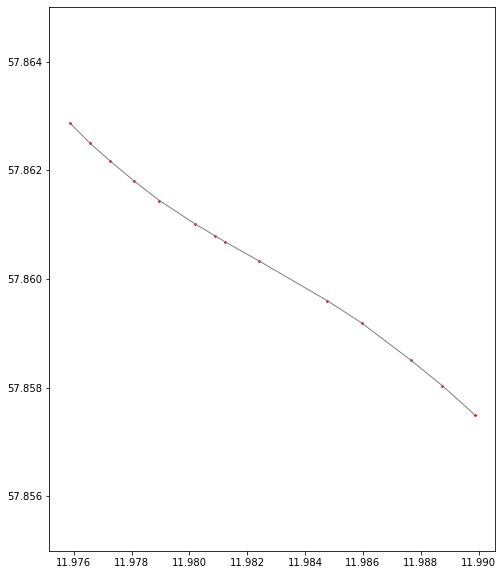

In [22]:
ax1 = gdf_test_segments.plot(figsize=(10,10), color="grey", lw=1.0)
ax1 = filtered_nodes_test.plot(ax=ax1, color="red", markersize=3)
ax1.set_ylim([57.855, 57.865])

In [23]:
filtered_network_graph = filtered_network_graph.loc[~filtered_network_graph["highway"].isin(['cycleway', 'footway', 'pedestrian', 'trail', 'crossing'])].copy()

In [24]:
filtered_nodes_test = filternodes(filtered_network_graph)

(57.55, 57.875)

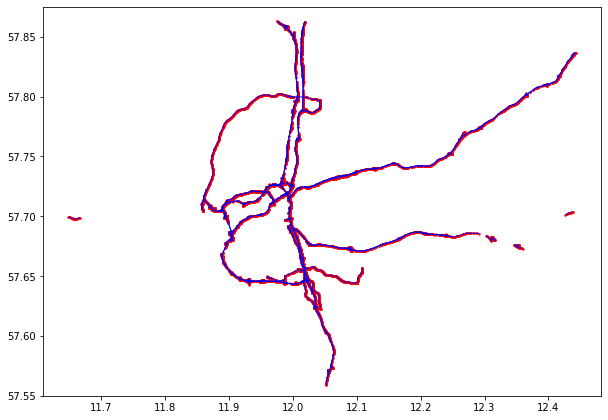

In [25]:
ax3 = filtered_network_graph.plot(figsize=(10,10), color="blue", lw=1.0)
ax3 = filtered_nodes_test.plot(ax=ax3, color="red", markersize=2)
ax3.set_ylim([57.55, 57.875])

In [26]:
filtered_network_graph = CummulativeDistanceAndTime.fixNAForMaxSpeed(filtered_network_graph)
filtered_network_graph["maxspeed"].unique()

<IntegerArray>
[100, 70, 60, 80, <NA>, 50, 90, 40, 30, 110]
Length: 10, dtype: Int64

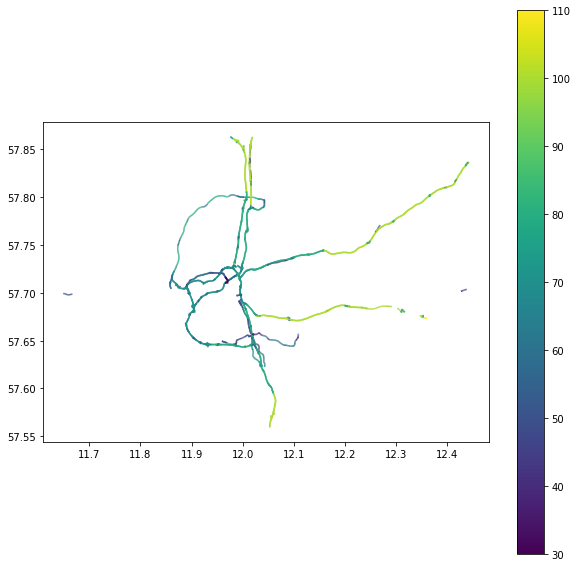

In [27]:
filtered_network_graph = CummulativeDistanceAndTime.replaceNAInMaxSpeed(filtered_network_graph)
ax = filtered_network_graph.plot(column="maxspeed", figsize=(10,10), legend=True)

In [28]:
print(nodes[nodes['id'].isin([2881481573])])

           lon        lat  tags  timestamp  version  changeset          id  \
202  11.980885  57.860795  None          0        0          0  2881481573   

                      geometry  
202  POINT (11.98088 57.86080)  


In [29]:
drive_net = osm.get_network(network_type="driving")

In [30]:
gdf_E6 = drive_net[drive_net['ref'] == 'E 6']

In [31]:
gdf_E6_graph = filtered_network_graph[filtered_network_graph['ref'] == 'E 6']

In [32]:
columns_to_drop = ['access', 'area', 'bicycle', 'cycleway', 'foot', 'lit', 'smoothness', \
                  'sidewalk', 'tags', 'version', 'timestamp', 'psv', 'int_ref']# not needed columns in the dataframe

## We want to enrich our data with openLR meta data, FCR and FOW. Some OpenLR definitions:
Each LPR consist of building blocks. See blog post for detail description __https://alexapta.medium.com/location-referencing-openlr-f4b774ffece__.

Also you can read the white paper for more information: __http://www.openlr.org/fileadmin/user_upload/openlr-whitepaper_v1.5.pdf__

1\. COORDS - coordinate pair <br>
2\. FRC - Functional Road Class <br>
3\. FOW - Form Of Way <br>
4\. BEAR - Bearing describes the angle between the trye North and a line. <br>
5\. DNP - Distance to Next Point <br>
6\. LFRCNP - Lowest FRC to the Next Point  <br>
7\. POFF - Positive Offset <br>
8\. NOFF - Negative Offset <br>

At least two out of three information of the map must be available among: geometry, FRC and FOW, with the geometry more important than the FRC which is more important of the FOW in granting a better decoding.

FRC: Functional Road Class of a line is based on the importance of the road it represent. See below OpenLR definition of following 8 values (important in the decoding application to properly map these values to those of your map)

| FRC | DESC.               |
| ----|:-------------------:|
| 0   | Main road           |
| 1   | First class road    |
| 2   | Second class road   |
| 3   | Third class road    |
| 4   | Fourth class road   |
| 5   | Fifth class road    |
| 6   | Sixth class road    |
| 7   | Seventh class road  |


FOW: the Form Of Way describes the physical road type of a line

| FOW | DESC.                                                                                                                                                   |
|:-------------------------|:-----------------------------------------------------------------------------------------------------------------------------------|
| Undefined             (0)|   The physical road type is unknown                                                                                                |
| Motorway              (1)|   A Motorway is defined as a road permitted for motorized vehicles only in combination with a predescribed minimum speed. It has two or more physically seperated carriageways and no single level-crossings.                                                                                                           |
| Multiple_Carriageway  (2)|   A multiple carriageway is defined as a road with physically seperated carriageways regardless of the number of lanes.            |
| Single_Carriageway    (3)|   All roads without seperate carriageways are considered as roads with a single carriageway.                                       |
| Roundabout            (4)|   A roundabout is a road which forms a ring on which traffic traveling in only ine direction is allowed.                           |
| Trafficsquare         (5)|   A traffic sqaure is an open area (partly) enclosed by roads which is used for non-traffic purposes and which is not a roundabout.|
| Sliproad              (6)|   A slip road is a road especially designed to enter or leave a line.                                                              |
| Other                 (0)|   The physical road type is known but does not fit into one of the other categories.                                               |

## Map OSM highway attr with FRC and FOW ids

Mapping has been done by Fraunhofers master thesis. For this testing purpose its enough to assume that the mappings are correct. Link to github resource sqlscript: __https://github.com/FraunhoferIVI/openlr/blob/master/src/main/resources/SQL/SQL_Script.sql__

| OSM_HIGHWAY    | FRC | FOW |
|:---------------|:---:|:---:|
| motorway       | 0   | 1   |
| motorway_link  | 0   | 6   |
| trunk          | 1   | 2   |
| trunk_link     | 1   | 6   |
| primary        | 2   | 3   |
| primary_link   | 2   | 6   |
| secondary      | 3   | 3   |
| secondary_link | 3   | 6   |
| tertiary       | 4   | 3   |
| tertiary_link  | 4   | 6   |
| road           | 5   | 3   |
| road_link      | 5   | 6   |
| unclassified   | 5   | 0   |
| residential    | 5   | 3   |
| living_street  | 6   | 3   |
| else           | 7   | 0   |


| OSM_HIGHWAY    | FRC | FOW |
|:---------------|:---:|:---:|
| motorway       | 0   | 1   |
| motorway_link  | 0   | 6   |
| trunk          | 1   | 2   |
| trunk_link     | 1   | 6   |
| primary        | 2   | 3   |
| primary_link   | 2   | 6   |
| secondary      | 3   | 3   |
| secondary_link | 3   | 6   |
| tertiary       | 4   | 3   |
| tertiary_link  | 4   | 6   |
| road           | 5   | 3   |
| road_link      | 5   | 6   |
| unclassified   | 5   | 0   |
| residential    | 5   | 3   |
| living_street  | 6   | 3   |
| else           | 7   | 0   |

In [33]:
def filternetworkExt(rNetwork):
    return(drive_net[(rNetwork['name'].isin(cData.selected_road_names)) | \
                     (rNetwork['ref'].isin(cData.road_ref_list)) | \
                     (rNetwork['id'].isin(cData.road_id_list)) | \
                     (rNetwork['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [34]:
gdf_E6 = drive_net[drive_net['ref'] == 'E 6']

In [35]:
def filterRoadNetwork(rNetwork):
    return(rNetwork[(rNetwork['name'].isin(cData.selected_road_names)) | \
                     (rNetwork['ref'].isin(cData.road_ref_list)) | \
                     (rNetwork['id'].isin(cData.road_id_list)) | \
                     (rNetwork['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [36]:
graphroadnetwork_E6 = filtered_network_graph[filtered_network_graph['ref'].isin(['E 6'])]

In [37]:
#graphroadnetwork_E6.explore()

In [38]:
targetNetwork = drive_net[drive_net['id'].isin([4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135,  941040138, 941040136, 941040139, 941040137, 183156782,  941040140, 1023025761, 1023025760])]

In [39]:
targetNetwork.explore()

In [41]:
ref_list = ['E 6', 'E 6.20', 'E 20', 'E 6;E 20', 'E 45']
nameslist = ['Oscarsleden']

In [42]:
large_graph = edges[(edges['name'].isin(nameslist)) | (edges['ref'].isin(ref_list))]

In [43]:
large_graph.explore()

In [44]:
filterfuncs = filterfunctions.filterfunctions()
filtered_network = filterfuncs.filterRoadNetwork(drive_net)

In [45]:
targetNetwork = drive_net[(drive_net['name'].isin(nameslist)) | (drive_net['ref'].isin(ref_list))]

In [46]:
roadNetworkManager_validator = nManager.RoadNetworkManager()

In [47]:
roadNetworkManager_validator.createlinesFromRoadGraphNetwork(targetNetwork, filtered_network, filtered_network_graph)

[]
[4040302]
[4040302, 284402021]
[4040302, 284402021, 13865740]
[4040302, 284402021, 13865740, 226048677]
[4040302, 284402021, 13865740, 226048677, 13865743]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130]
[4040302, 284402021, 13865740, 226048677

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748,

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139,

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746]
[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 21504

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919]
[4040302, 2844020

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

[4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 10229

200   199   38075804
201   200   38075804
202   201   38075804
203   202   38075804
38075804   4
204   203   290070332
205   204   290070332
206   205   290070332
207   206   290070332
290070332   4
208   207   940731576
940731576   1
209   208   14907926
210   209   14907926
211   210   14907926
212   211   14907926
213   212   14907926
214   213   14907926
215   214   14907926
216   215   14907926
217   216   14907926
218   217   14907926
219   218   14907926
220   219   14907926
221   220   14907926
14907926   13
222   221   940731595
940731595   1
223   222   940731577
940731577   1
224   223   940731594
940731594   1
225   224   213798704
226   225   213798704
227   226   213798704
228   227   213798704
229   228   213798704
230   229   213798704
231   230   213798704
232   231   213798704
233   232   213798704
234   233   213798704
213798704   10
235   234   940731593
236   235   940731593
940731593   2
237   236   1023025736
238   237   1023025736
239   238   1023025736
10230257

617   616   991569672
618   617   991569672
991569672   2
619   618   991569674
620   619   991569674
621   620   991569674
991569674   3
622   621   1022934168
1022934168   1
623   622   1022934169
1022934169   1
624   623   792723651
625   624   792723651
626   625   792723651
792723651   3
627   626   991784163
991784163   1
628   627   116352369
629   628   116352369
630   629   116352369
631   630   116352369
632   631   116352369
633   632   116352369
634   633   116352369
635   634   116352369
636   635   116352369
116352369   9
637   636   1021909388
638   637   1021909388
639   638   1021909388
640   639   1021909388
1021909388   4
641   640   116352373
642   641   116352373
643   642   116352373
644   643   116352373
645   644   116352373
646   645   116352373
647   646   116352373
648   647   116352373
649   648   116352373
650   649   116352373
651   650   116352373
652   651   116352373
116352373   12
653   652   28605558
28605558   0
654   652   28605557
655   653   28605

948   946   4772467
949   947   4772467
950   948   4772467
951   949   4772467
952   950   4772467
953   951   4772467
954   952   4772467
4772467   8
955   953   28901395
956   954   28901395
957   955   28901395
958   956   28901395
959   957   28901395
960   958   28901395
961   959   28901395
962   960   28901395
963   961   28901395
964   962   28901395
28901395   10
965   963   165831525
966   964   165831525
967   965   165831525
968   966   165831525
969   967   165831525
970   968   165831525
971   969   165831525
972   970   165831525
973   971   165831525
974   972   165831525
165831525   10
975   973   255755079
976   974   255755079
977   975   255755079
978   976   255755079
979   977   255755079
980   978   255755079
255755079   6
981   979   995019503
995019503   1
982   980   4772697
983   981   4772697
984   982   4772697
985   983   4772697
986   984   4772697
987   985   4772697
988   986   4772697
989   987   4772697
990   988   4772697
991   989   4772697
992   9

1354   1352   35267234
1355   1353   35267234
1356   1354   35267234
1357   1355   35267234
1358   1356   35267234
35267234   5
1359   1357   8060693
8060693   1
1360   1358   8060694
1361   1359   8060694
1362   1360   8060694
1363   1361   8060694
8060694   4
1364   1362   28614515
1365   1363   28614515
1366   1364   28614515
1367   1365   28614515
1368   1366   28614515
28614515   5
1369   1367   4272114
1370   1368   4272114
1371   1369   4272114
1372   1370   4272114
1373   1371   4272114
1374   1372   4272114
1375   1373   4272114
1376   1374   4272114
1377   1375   4272114
4272114   9
1378   1376   28614506
1379   1377   28614506
1380   1378   28614506
1381   1379   28614506
1382   1380   28614506
1383   1381   28614506
1384   1382   28614506
1385   1383   28614506
1386   1384   28614506
1387   1385   28614506
1388   1386   28614506
1389   1387   28614506
1390   1388   28614506
1391   1389   28614506
1392   1390   28614506
1393   1391   28614506
1394   1392   28614506
1395   13

1726   1723   246439417
1727   1724   246439417
1728   1725   246439417
1729   1726   246439417
1730   1727   246439417
246439417   5
1731   1728   118592010
1732   1729   118592010
1733   1730   118592010
118592010   3
1734   1731   118592003
1735   1732   118592003
1736   1733   118592003
1737   1734   118592003
118592003   4
1738   1735   41207579
1739   1736   41207579
1740   1737   41207579
41207579   3
1741   1738   1020713686
1020713686   1
1742   1739   166220943
1743   1740   166220943
1744   1741   166220943
166220943   3
1745   1742   41191178
1746   1743   41191178
41191178   2
1747   1744   41191179
41191179   1
1748   1745   1023578355
1023578355   1
1749   1746   1023578356
1023578356   1
1750   1747   296755299
296755299   1
1751   1748   296755297
296755297   1
1752   1749   222510784
1753   1750   222510784
1754   1751   222510784
1755   1752   222510784
1756   1753   222510784
1757   1754   222510784
1758   1755   222510784
1759   1756   222510784
222510784   8
1760 

2022   2016   1023578402
1023578402   1
2023   2017   296762121
296762121   1
2024   2018   28907469
2025   2019   28907469
2026   2020   28907469
2027   2021   28907469
2028   2022   28907469
2029   2023   28907469
2030   2024   28907469
2031   2025   28907469
28907469   8
2032   2026   28907468
2033   2027   28907468
2034   2028   28907468
2035   2029   28907468
2036   2030   28907468
2037   2031   28907468
2038   2032   28907468
28907468   7
2039   2033   620077872
620077872   1
2040   2034   642972761
2041   2035   642972761
2042   2036   642972761
642972761   3
2043   2037   296756782
2044   2038   296756782
2045   2039   296756782
2046   2040   296756782
2047   2041   296756782
2048   2042   296756782
296756782   6
2049   2043   1023578396
1023578396   1
2050   2044   1023578397
2051   2045   1023578397
1023578397   2
2052   2046   1019682210
2053   2047   1019682210
2054   2048   1019682210
1019682210   3
2055   2049   1023578389
1023578389   1
2056   2050   1023578390
102357839

2370   2364   221131576
2371   2365   221131576
2372   2366   221131576
2373   2367   221131576
2374   2368   221131576
2375   2369   221131576
221131576   19
2376   2370   221131584
2377   2371   221131584
2378   2372   221131584
2379   2373   221131584
2380   2374   221131584
2381   2375   221131584
221131584   6
2382   2376   322636838
2383   2377   322636838
2384   2378   322636838
322636838   3
2385   2379   221209833
2386   2380   221209833
2387   2381   221209833
2388   2382   221209833
2389   2383   221209833
221209833   5
2390   2384   520695399
2391   2385   520695399
520695399   2
2392   2386   386940538
386940538   1
2393   2387   1023361691
2394   2388   1023361691
2395   2389   1023361691
2396   2390   1023361691
1023361691   4
2397   2391   1023361692
1023361692   1
2398   2392   221131563
2399   2393   221131563
2400   2394   221131563
2401   2395   221131563
2402   2396   221131563
2403   2397   221131563
221131563   6
2404   2398   1023361688
1023361688   1
2405   239

2750   2744   1019645807
2751   2745   1019645807
2752   2746   1019645807
1019645807   3
2753   2747   4392842
2754   2748   4392842
4392842   2
2755   2749   48568067
2756   2750   48568067
2757   2751   48568067
2758   2752   48568067
48568067   4
2759   2753   1023361575
1023361575   1
2760   2754   1023361576
1023361576   1
2761   2755   1023361573
1023361573   1
2762   2756   1023361572
1023361572   1
2763   2757   1019645808
2764   2758   1019645808
1019645808   2
2765   2759   4392841
2766   2760   4392841
2767   2761   4392841
2768   2762   4392841
4392841   4
2769   2763   4392843
2770   2764   4392843
2771   2765   4392843
2772   2766   4392843
4392843   4
2773   2767   14923447
14923447   1
2774   2768   38605508
2775   2769   38605508
38605508   2
2776   2770   941040145
2777   2771   941040145
2778   2772   941040145
2779   2773   941040145
941040145   4
2780   2774   941040144
2781   2775   941040144
941040144   2
2782   2776   237772656
2783   2777   237772656
237772656

3189   3183   1022940082
3190   3184   1022940082
1022940082   3
3191   3185   115972114
3192   3186   115972114
3193   3187   115972114
3194   3188   115972114
3195   3189   115972114
3196   3190   115972114
3197   3191   115972114
3198   3192   115972114
3199   3193   115972114
3200   3194   115972114
3201   3195   115972114
3202   3196   115972114
115972114   12
3203   3197   115972122
3204   3198   115972122
115972122   2
3205   3199   115972123
3206   3200   115972123
3207   3201   115972123
115972123   3
3208   3202   115972111
3209   3203   115972111
3210   3204   115972111
115972111   3
3211   3205   231110544
3212   3206   231110544
3213   3207   231110544
3214   3208   231110544
3215   3209   231110544
3216   3210   231110544
3217   3211   231110544
3218   3212   231110544
3219   3213   231110544
3220   3214   231110544
3221   3215   231110544
231110544   11
3222   3216   231110546
231110546   1
3223   3217   198806770
3224   3218   198806770
3225   3219   198806770
3226   32

3622   3616   43048111
3623   3617   43048111
3624   3618   43048111
3625   3619   43048111
3626   3620   43048111
43048111   15
3627   3621   43048113
3628   3622   43048113
3629   3623   43048113
3630   3624   43048113
3631   3625   43048113
3632   3626   43048113
3633   3627   43048113
3634   3628   43048113
43048113   8
3635   3629   1023039442
1023039442   1
3636   3630   1023039443
1023039443   1
3637   3631   231110547
3638   3632   231110547
231110547   2
3639   3633   511683612
3640   3634   511683612
511683612   2
3641   3635   231110545
231110545   1
3642   3636   209835516
209835516   1
3643   3637   141227230
3644   3638   141227230
3645   3639   141227230
3646   3640   141227230
3647   3641   141227230
3648   3642   141227230
3649   3643   141227230
141227230   7
3650   3644   115972117
3651   3645   115972117
3652   3646   115972117
115972117   3
3653   3647   115972116
3654   3648   115972116
115972116   2
3655   3649   115972120
3656   3650   115972120
3657   3651   11

4005   3998   116807414
4006   3999   116807414
4007   4000   116807414
4008   4001   116807414
4009   4002   116807414
4010   4003   116807414
4011   4004   116807414
4012   4005   116807414
116807414   15
4013   4006   91598207
91598207   1
4014   4007   1022940020
1022940020   1
4015   4008   1022940019
1022940019   1
4016   4009   15801998
4017   4010   15801998
4018   4011   15801998
4019   4012   15801998
4020   4013   15801998
15801998   5
4021   4014   1022940022
1022940022   1
4022   4015   1022940021
1022940021   1
4023   4016   377534172
377534172   1
4024   4017   4303535
4025   4018   4303535
4303535   2
4026   4019   116807398
4027   4020   116807398
4028   4021   116807398
4029   4022   116807398
4030   4023   116807398
4031   4024   116807398
4032   4025   116807398
4033   4026   116807398
4034   4027   116807398
4035   4028   116807398
4036   4029   116807398
4037   4030   116807398
4038   4031   116807398
4039   4032   116807398
4040   4033   116807398
4041   4034   1

4364   4357   993287799
993287799   1
4365   4358   317627355
4366   4359   317627355
4367   4360   317627355
4368   4361   317627355
317627355   4
4369   4362   129413863
4370   4363   129413863
4371   4364   129413863
4372   4365   129413863
4373   4366   129413863
4374   4367   129413863
4375   4368   129413863
4376   4369   129413863
4377   4370   129413863
129413863   9
4378   4371   298748620
4379   4372   298748620
298748620   2
4380   4373   1023039468
1023039468   1
4381   4374   1023039467
4382   4375   1023039467
1023039467   2
4383   4376   298748596
4384   4377   298748596
4385   4378   298748596
4386   4379   298748596
4387   4380   298748596
4388   4381   298748596
4389   4382   298748596
4390   4383   298748596
4391   4384   298748596
4392   4385   298748596
4393   4386   298748596
4394   4387   298748596
4395   4388   298748596
4396   4389   298748596
4397   4390   298748596
4398   4391   298748596
4399   4392   298748596
4400   4393   298748596
4401   4394   298748596

4732   4725   290070333
4733   4726   290070333
290070333   6
4734   4727   284402512
4735   4728   284402512
4736   4729   284402512
4737   4730   284402512
284402512   4
4738   4731   995333709
4739   4732   995333709
995333709   2
{"coordinates": [[11.975858, 57.862876], [11.976574, 57.862493], [11.977244, 57.862179], [11.978085, 57.861805], [11.978966, 57.861442], [11.98018, 57.861019], [11.980885, 57.860795]], "type": "LineString"}
{"coordinates": [[11.980885, 57.860795], [11.981231, 57.860686], [11.982417, 57.86033], [11.98476, 57.859604]], "type": "LineString"}
{"coordinates": [[11.98476, 57.859604], [11.985248, 57.859355], [11.985826, 57.859094], [11.986142, 57.858906], [11.986326, 57.858767], [11.98654, 57.858566], [11.98668, 57.858349], [11.98684, 57.858073], [11.987014, 57.857772], [11.987156, 57.857569], [11.987303, 57.857415], [11.987436, 57.8573]], "type": "LineString"}
{"coordinates": [[11.98476, 57.859604], [11.985962, 57.85919], [11.987659, 57.858506], [11.988753, 57.8

{"coordinates": [[11.990488, 57.758132], [11.990627, 57.758052], [11.990681, 57.758029], [11.990838, 57.757962], [11.991002, 57.757875], [11.99111, 57.757779], [11.991138, 57.757711], [11.991174, 57.757519], [11.99119, 57.757374], [11.991205, 57.75698]], "type": "LineString"}
{"coordinates": [[11.991374, 57.755392], [11.991363, 57.754973]], "type": "LineString"}
{"coordinates": [[11.991363, 57.754973], [11.991383, 57.754163]], "type": "LineString"}
{"coordinates": [[11.991383, 57.754163], [11.991384, 57.754034]], "type": "LineString"}
{"coordinates": [[11.991384, 57.754034], [11.991385, 57.753998]], "type": "LineString"}
{"coordinates": [[11.991385, 57.753998], [11.991394, 57.752845], [11.991385, 57.752345], [11.991343, 57.75199]], "type": "LineString"}
{"coordinates": [[11.991343, 57.75199], [11.991313, 57.751732], [11.99123, 57.751301]], "type": "LineString"}
{"coordinates": [[11.99123, 57.751301], [11.991089, 57.751069], [11.99093, 57.75058]], "type": "LineString"}
{"coordinates": [

{"coordinates": [[11.967146, 57.725967], [11.967109, 57.725959]], "type": "LineString"}
{"coordinates": [[11.969577, 57.726477], [11.968591, 57.726272], [11.967238, 57.725987], [11.967146, 57.725967]], "type": "LineString"}
{"coordinates": [[11.964241, 57.725259], [11.963503, 57.725077]], "type": "LineString"}
{"coordinates": [[11.963503, 57.725077], [11.962891, 57.724916], [11.96245, 57.724792], [11.961893, 57.724634], [11.961427, 57.724482], [11.961021, 57.724337], [11.960713, 57.724211], [11.960291, 57.724021], [11.959886, 57.72381], [11.959252, 57.723442]], "type": "LineString"}
{"coordinates": [[11.963503, 57.725077], [11.962411, 57.724869], [11.961966, 57.724764], [11.961526, 57.724653], [11.961183, 57.724567]], "type": "LineString"}
{"coordinates": [[11.961183, 57.724567], [11.961094, 57.724544], [11.960896, 57.724491], [11.960702, 57.724432], [11.960468, 57.724358], [11.960295, 57.724297], [11.960206, 57.724272], [11.960122, 57.724252], [11.960036, 57.724238], [11.959942, 57.72

{"coordinates": [[11.955375, 57.720231], [11.955663, 57.720213], [11.955852, 57.7202]], "type": "LineString"}
{"coordinates": [[11.95555, 57.719924], [11.955676, 57.720028], [11.955786, 57.72012], [11.955819, 57.720151], [11.955843, 57.720178], [11.955852, 57.7202]], "type": "LineString"}
{"coordinates": [[11.954474, 57.720194], [11.95459, 57.720198]], "type": "LineString"}
{"coordinates": [[11.954062, 57.72018], [11.954474, 57.720194]], "type": "LineString"}
{"coordinates": [[11.95374, 57.719954], [11.953811, 57.720018], [11.953875, 57.720061], [11.95393, 57.720096], [11.954062, 57.72018]], "type": "LineString"}
{"coordinates": [[11.95378, 57.719759], [11.953753, 57.719803], [11.953741, 57.719852], [11.953737, 57.719894], [11.95374, 57.719954]], "type": "LineString"}
{"coordinates": [[11.953807, 57.719732], [11.95378, 57.719759]], "type": "LineString"}
{"coordinates": [[11.954318, 57.719624], [11.954234, 57.71962], [11.954135, 57.719622], [11.954018, 57.719637], [11.953907, 57.719672]

{"coordinates": [[11.904208, 57.685724], [11.904207, 57.685711]], "type": "LineString"}
{"coordinates": [[11.904207, 57.685711], [11.904198, 57.685632], [11.904125, 57.685247]], "type": "LineString"}
{"coordinates": [[11.904125, 57.685247], [11.904049, 57.684905]], "type": "LineString"}
{"coordinates": [[11.904049, 57.684905], [11.904004, 57.684722], [11.903967, 57.684472], [11.903954, 57.684191]], "type": "LineString"}
{"coordinates": [[11.903954, 57.684191], [11.903935, 57.684082]], "type": "LineString"}
{"coordinates": [[11.903935, 57.684082], [11.903932, 57.684064]], "type": "LineString"}
{"coordinates": [[11.903932, 57.684064], [11.90392, 57.683994], [11.903923, 57.683467], [11.90403, 57.683027], [11.904128, 57.68247], [11.904093, 57.682313]], "type": "LineString"}
{"coordinates": [[11.901061, 57.685114], [11.901128, 57.685051], [11.901287, 57.684973], [11.901495, 57.684902], [11.901686, 57.684842], [11.901969, 57.684778], [11.902325, 57.684717], [11.902624, 57.684648], [11.902821

{"coordinates": [[11.897657, 57.678633], [11.897303, 57.678402], [11.896739, 57.678003], [11.8966, 57.677867]], "type": "LineString"}
{"coordinates": [[11.897684, 57.67865], [11.897657, 57.678633]], "type": "LineString"}
{"coordinates": [[11.897929, 57.67881], [11.897684, 57.67865]], "type": "LineString"}
{"coordinates": [[11.898958, 57.679286], [11.898608, 57.679132], [11.897929, 57.67881]], "type": "LineString"}
{"coordinates": [[11.899938, 57.679617], [11.898958, 57.679286]], "type": "LineString"}
{"coordinates": [[11.899994, 57.679636], [11.899938, 57.679617]], "type": "LineString"}
{"coordinates": [[11.900097, 57.67967], [11.899994, 57.679636]], "type": "LineString"}
{"coordinates": [[11.902081, 57.680526], [11.901641, 57.680319], [11.901048, 57.68006], [11.900292, 57.679794], [11.900097, 57.67967]], "type": "LineString"}
{"coordinates": [[11.904084, 57.681479], [11.90386, 57.681207], [11.903676, 57.681071], [11.903497, 57.680943], [11.902999, 57.68068], [11.902487, 57.680455], [1

{"coordinates": [[11.913438, 57.691207], [11.913587, 57.691331], [11.913648, 57.691381], [11.913716, 57.691482], [11.913741, 57.691537], [11.913759, 57.691593], [11.913746, 57.691648]], "type": "LineString"}
{"coordinates": [[11.912842, 57.690886], [11.913438, 57.691207]], "type": "LineString"}
{"coordinates": [[11.913438, 57.691207], [11.913647, 57.691301], [11.913812, 57.691375], [11.913951, 57.691429], [11.914057, 57.691451], [11.914179, 57.691466]], "type": "LineString"}
{"coordinates": [[11.913986, 57.691668], [11.913806, 57.69169], [11.913738, 57.691696], [11.91363, 57.691698]], "type": "LineString"}
{"coordinates": [[11.91363, 57.691698], [11.913573, 57.691691], [11.913463, 57.691677], [11.913401, 57.691666], [11.91301, 57.691568]], "type": "LineString"}
{"coordinates": [[11.913265, 57.691883], [11.913254, 57.691799], [11.913208, 57.691727], [11.91301, 57.691568]], "type": "LineString"}
{"coordinates": [[11.91301, 57.691568], [11.912784, 57.691396]], "type": "LineString"}
{"coor

{"coordinates": [[11.98176, 57.716336], [11.979234, 57.715424]], "type": "LineString"}
{"coordinates": [[11.981896, 57.716375], [11.981818, 57.716352], [11.98176, 57.716336]], "type": "LineString"}
{"coordinates": [[11.982026, 57.716409], [11.981896, 57.716375]], "type": "LineString"}
{"coordinates": [[11.982026, 57.716409], [11.982241, 57.716481]], "type": "LineString"}
{"coordinates": [[11.982241, 57.716481], [11.982606, 57.716611], [11.982804, 57.716686]], "type": "LineString"}
{"coordinates": [[11.982804, 57.716686], [11.983597, 57.716968]], "type": "LineString"}
{"coordinates": [[11.983597, 57.716968], [11.984447, 57.717269], [11.984711, 57.717353]], "type": "LineString"}
{"coordinates": [[11.984711, 57.717353], [11.984906, 57.71741], [11.985354, 57.717541], [11.985525, 57.717586]], "type": "LineString"}
{"coordinates": [[11.985525, 57.717586], [11.985904, 57.717687], [11.986898, 57.717878]], "type": "LineString"}
{"coordinates": [[11.986201, 57.717723], [11.986898, 57.717878]], "

{"coordinates": [[11.99834, 57.725046], [11.998411, 57.725267], [11.998443, 57.725359], [11.998504, 57.725568], [11.998512, 57.725748], [11.998518, 57.725863]], "type": "LineString"}
{"coordinates": [[11.998518, 57.725863], [11.99856, 57.726346]], "type": "LineString"}
{"coordinates": [[11.99856, 57.726346], [11.998511, 57.726542], [11.998458, 57.726696]], "type": "LineString"}
{"coordinates": [[11.998646, 57.725906], [11.998589, 57.726225], [11.99856, 57.726346]], "type": "LineString"}
{"coordinates": [[11.998646, 57.725906], [11.998757, 57.726214], [11.998819, 57.726376], [11.998965, 57.726504], [11.999075, 57.726563], [11.999182, 57.726603], [11.999317, 57.726637], [11.999502, 57.72665], [11.999669, 57.726647], [11.999786, 57.726622], [11.999925, 57.72658], [12.000024, 57.726534], [12.000096, 57.726463], [12.000157, 57.726375], [12.00018, 57.726273], [12.000166, 57.726168], [12.000137, 57.72612], [12.000076, 57.726038], [12.000001, 57.725955], [11.999845, 57.725845]], "type": "LineS

{"coordinates": [[12.015848, 57.788053], [12.01611, 57.788099], [12.016395, 57.788131]], "type": "LineString"}
{"coordinates": [[12.015131, 57.787259], [12.01504, 57.787327], [12.014938, 57.787412], [12.014899, 57.787466], [12.014881, 57.78751], [12.014885, 57.787555], [12.014897, 57.7876], [12.014925, 57.787647], [12.014968, 57.787699], [12.015026, 57.787751], [12.015098, 57.787805], [12.01518, 57.787846], [12.015291, 57.787897], [12.015416, 57.787942], [12.015654, 57.78801], [12.015848, 57.788053]], "type": "LineString"}
{"coordinates": [[12.017817, 57.788225], [12.018341, 57.788215], [12.018744, 57.788193], [12.01913, 57.78817], [12.019523, 57.788138], [12.019996, 57.788093], [12.020444, 57.788041], [12.020861, 57.787986], [12.021462, 57.787897], [12.022017, 57.78779], [12.023252, 57.787529], [12.023914, 57.787378], [12.024662, 57.7872], [12.025811, 57.786931], [12.026513, 57.786784], [12.026885, 57.786709], [12.027411, 57.786616], [12.027832, 57.786559], [12.028442, 57.786491], [12

{"coordinates": [[11.891396, 57.774733], [11.891538, 57.774909], [11.891724, 57.775152], [11.891842, 57.775306]], "type": "LineString"}
{"coordinates": [[11.891376, 57.774708], [11.891396, 57.774733]], "type": "LineString"}
{"coordinates": [[11.890826, 57.774022], [11.891271, 57.774577], [11.891376, 57.774708]], "type": "LineString"}
{"coordinates": [[11.885852, 57.768202], [11.885958, 57.768403], [11.886133, 57.768698], [11.886339, 57.768995], [11.886484, 57.769186], [11.886805, 57.769579], [11.887051, 57.769853], [11.887288, 57.770131], [11.888511, 57.771423], [11.889128, 57.772091], [11.889653, 57.772681], [11.890307, 57.773419], [11.890826, 57.774022]], "type": "LineString"}
{"coordinates": [[11.885067, 57.765851], [11.885148, 57.766194], [11.885251, 57.766587], [11.885412, 57.767139], [11.885542, 57.767517], [11.885738, 57.76798], [11.885852, 57.768202]], "type": "LineString"}
{"coordinates": [[11.885061, 57.765826], [11.885067, 57.765851]], "type": "LineString"}
{"coordinates": [

{"coordinates": [[11.9229, 57.709148], [11.922713, 57.709145]], "type": "LineString"}
{"coordinates": [[11.922713, 57.709145], [11.922622, 57.709144], [11.922552, 57.709156], [11.9225, 57.709178], [11.922445, 57.709213], [11.922413, 57.709257]], "type": "LineString"}
{"coordinates": [[11.9229, 57.709148], [11.922759, 57.709119]], "type": "LineString"}
{"coordinates": [[11.922759, 57.709119], [11.92263, 57.709102], [11.922489, 57.709096], [11.922389, 57.709097], [11.922348, 57.709091], [11.922299, 57.709075]], "type": "LineString"}
{"coordinates": [[11.922299, 57.709075], [11.922317, 57.709052], [11.922354, 57.70903], [11.922416, 57.709012], [11.922489, 57.709004], [11.922579, 57.709003], [11.922679, 57.709005]], "type": "LineString"}
{"coordinates": [[11.922679, 57.709005], [11.922893, 57.709085], [11.923351, 57.709275], [11.923793, 57.709463], [11.924039, 57.709568], [11.9242, 57.709648], [11.924496, 57.709849], [11.924599, 57.709913], [11.924738, 57.709979], [11.924864, 57.710023], [

{"coordinates": [[11.872739, 57.706371], [11.872922, 57.706133], [11.873136, 57.705911], [11.873194, 57.705859], [11.873268, 57.705792]], "type": "LineString"}
{"coordinates": [[11.872568, 57.706697], [11.872645, 57.706536], [11.872739, 57.706371]], "type": "LineString"}
{"coordinates": [[11.872566, 57.706701], [11.872568, 57.706697]], "type": "LineString"}
{"coordinates": [[11.872564, 57.706706], [11.872566, 57.706701]], "type": "LineString"}
{"coordinates": [[11.872564, 57.706706], [11.872564, 57.706701]], "type": "LineString"}
{"coordinates": [[11.872118, 57.707649], [11.872201, 57.707524], [11.872312, 57.707318], [11.872407, 57.707109], [11.872564, 57.706706]], "type": "LineString"}
{"coordinates": [[11.871632, 57.70807], [11.871652, 57.708056], [11.872118, 57.707649]], "type": "LineString"}
{"coordinates": [[11.871603, 57.708088], [11.871632, 57.70807]], "type": "LineString"}
{"coordinates": [[11.869577, 57.708063], [11.869837, 57.708198], [11.869997, 57.708264], [11.870169, 57.70

{"coordinates": [[11.889673, 57.706592], [11.889657, 57.706539], [11.889627, 57.706476], [11.889594, 57.706422], [11.88948, 57.706275]], "type": "LineString"}
{"coordinates": [[11.889684, 57.706646], [11.889673, 57.706592]], "type": "LineString"}
{"coordinates": [[11.890236, 57.707743], [11.889972, 57.70759], [11.889773, 57.707472], [11.889719, 57.70743], [11.889669, 57.707386], [11.889631, 57.707337], [11.889603, 57.707292], [11.889584, 57.707234], [11.889577, 57.707183], [11.889582, 57.707122], [11.889594, 57.707067], [11.889625, 57.70698], [11.889647, 57.706915], [11.889664, 57.706864], [11.889679, 57.70681], [11.889687, 57.706757], [11.889691, 57.706702], [11.889684, 57.706646]], "type": "LineString"}
{"coordinates": [[11.889994, 57.707965], [11.890076, 57.70796], [11.890175, 57.707935], [11.890245, 57.707892], [11.89026, 57.707823], [11.890236, 57.707743]], "type": "LineString"}
{"coordinates": [[11.89042, 57.707839], [11.890236, 57.707743]], "type": "LineString"}
{"coordinates": 

{"coordinates": [[11.947109, 57.720498], [11.947572, 57.720548], [11.947938, 57.72058], [11.948265, 57.720597], [11.948834, 57.720614], [11.949183, 57.720615], [11.949518, 57.720609]], "type": "LineString"}
{"coordinates": [[11.949518, 57.720609], [11.949817, 57.720598], [11.950075, 57.720582], [11.950428, 57.720552], [11.950701, 57.720518], [11.951021, 57.720468], [11.951626, 57.720361], [11.952015, 57.720288], [11.952451, 57.720221]], "type": "LineString"}
{"coordinates": [[11.952451, 57.720221], [11.95267, 57.720197], [11.952886, 57.720178], [11.953064, 57.720167]], "type": "LineString"}
{"coordinates": [[11.953064, 57.720167], [11.953234, 57.720166]], "type": "LineString"}
{"coordinates": [[11.953234, 57.720166], [11.953271, 57.720166]], "type": "LineString"}
{"coordinates": [[11.953271, 57.720166], [11.953437, 57.720164], [11.953704, 57.720171]], "type": "LineString"}
{"coordinates": [[11.953704, 57.720171], [11.953687, 57.720194], [11.953662, 57.72022], [11.953632, 57.720242], [1

{"coordinates": [[12.010018, 57.785058], [12.010433, 57.785536], [12.010758, 57.785854]], "type": "LineString"}
{"coordinates": [[12.010653, 57.764858], [12.010544, 57.764899], [12.010378, 57.764984], [12.010281, 57.765057], [12.010166, 57.765163]], "type": "LineString"}
{"coordinates": [[12.005338, 57.762302], [12.005354, 57.762333]], "type": "LineString"}
{"coordinates": [[12.0001, 57.73108], [12.000217, 57.731294], [12.000353, 57.731562], [12.00041, 57.731679], [12.000514, 57.731884], [12.000585, 57.73203], [12.000691, 57.732245], [12.000757, 57.732371], [12.000785, 57.732445], [12.000801, 57.732606]], "type": "LineString"}
{"coordinates": [[11.998344, 57.728623], [11.99847, 57.728796], [11.998558, 57.728948], [11.998586, 57.728985]], "type": "LineString"}
{"coordinates": [[11.998228, 57.727625], [11.998254, 57.727793], [11.998282, 57.728334]], "type": "LineString"}
{"coordinates": [[11.998976, 57.72504], [11.999113, 57.724983], [11.999239, 57.724902], [11.999325, 57.724807], [11.99

printing node
13865744   34  [ 12.0000499 , 57.8507654 ]
printing node
180082648   35  [ 12.000436 , 57.8503712 ]
printing node
180082648   36  [ 11.9891203 , 57.8567434 ]
printing node
180082648   37  [ 11.9891892 , 57.856758 ]
printing node
180082648   38  [ 11.9892791 , 57.8567695 ]
printing node
180082648   39  [ 11.9893764 , 57.8567753 ]
printing node
180082648   40  [ 11.9894164 , 57.8567778 ]
printing node
180082648   41  [ 11.9896163 , 57.8567793 ]
printing node
180082648   42  [ 11.9898082 , 57.8567722 ]
printing node
180082648   43  [ 11.9899969 , 57.8567639 ]
printing node
180082648   44  [ 11.9902932 , 57.8567379 ]
printing node
180082648   45  [ 11.9905834 , 57.8567016 ]
printing node
180082648   46  [ 11.9908838 , 57.8566452 ]
printing node
180082648   47  [ 11.9912446 , 57.8565482 ]
printing node
180082648   48  [ 11.9916402 , 57.8564076 ]
printing node
180082648   49  [ 11.9920425 , 57.8562356 ]
printing node
180082648   50  [ 11.9923945 , 57.8560604 ]
printing node
180

printing node
42963596   534  [ 11.9813616 , 57.7256293 ]
printing node
42963596   535  [ 11.9810824 , 57.7256556 ]
printing node
42963596   536  [ 11.9808506 , 57.725673 ]
printing node
373896044   537  [ 11.9806237 , 57.7256837 ]
printing node
373896044   538  [ 11.9803735 , 57.7256917 ]
printing node
58702443   539  [ 11.9801254 , 57.7256926 ]
printing node
373896040   540  [ 11.9792385 , 57.7257773 ]
printing node
373896040   541  [ 11.978657 , 57.7258254 ]
printing node
991569678   542  [ 11.9772303 , 57.7259513 ]
printing node
991569678   543  [ 11.9767426 , 57.7259964 ]
printing node
4771200   544  [ 11.9763756 , 57.7260347 ]
printing node
4771200   545  [ 11.976088 , 57.7260687 ]
printing node
4771200   546  [ 11.9756575 , 57.7261242 ]
printing node
991569668   547  [ 11.9752444 , 57.7261884 ]
printing node
154037948   548  [ 11.9744798 , 57.7263115 ]
printing node
39971059   549  [ 11.9727207 , 57.7266113 ]
printing node
39971059   550  [ 11.9724014 , 57.7266558 ]
printing nod

165831525   966  [ 11.9263411 , 57.7104364 ]
printing node
165831525   967  [ 11.9261093 , 57.7103905 ]
printing node
165831525   968  [ 11.9258543 , 57.7103527 ]
printing node
165831525   969  [ 11.9255773 , 57.7103232 ]
printing node
165831525   970  [ 11.925422 , 57.7103112 ]
printing node
165831525   971  [ 11.9252971 , 57.7103016 ]
printing node
165831525   972  [ 11.9250294 , 57.7102944 ]
printing node
255755079   973  [ 11.9247411 , 57.7102938 ]
printing node
255755079   974  [ 11.9245388 , 57.7103006 ]
printing node
255755079   975  [ 11.9242527 , 57.7103192 ]
printing node
255755079   976  [ 11.9239504 , 57.7103472 ]
printing node
255755079   977  [ 11.923565 , 57.7104017 ]
printing node
255755079   978  [ 11.9232557 , 57.7104573 ]
printing node
995019503   979  [ 11.9228866 , 57.7105221 ]
printing node
4772697   980  [ 11.9224533 , 57.7106128 ]
printing node
4772697   981  [ 11.9206618 , 57.7110871 ]
printing node
4772697   982  [ 11.9178036 , 57.7121324 ]
printing node
47726

4272216   1404  [ 11.8944609 , 57.67366 ]
printing node
1022939952   1405  [ 11.8903419 , 57.6692733 ]
printing node
1022939952   1406  [ 11.8954156 , 57.6759964 ]
printing node
1022939950   1407  [ 11.895141 , 57.6750782 ]
printing node
1022939951   1408  [ 11.8954156 , 57.6759964 ]
printing node
28499075   1409  [ 11.8954999 , 57.6764021 ]
printing node
28499075   1410  [ 11.8945446 , 57.677214 ]
printing node
28499075   1411  [ 11.8946832 , 57.6771369 ]
printing node
28499075   1412  [ 11.8948247 , 57.677071 ]
printing node
28499075   1413  [ 11.8949452 , 57.6770356 ]
printing node
28499075   1414  [ 11.8950744 , 57.6770202 ]
printing node
28499075   1415  [ 11.8952193 , 57.677008 ]
printing node
28499075   1416  [ 11.8953302 , 57.6769926 ]
printing node
28499075   1417  [ 11.8954289 , 57.6769613 ]
printing node
28499075   1418  [ 11.8955118 , 57.6769114 ]
printing node
28499075   1419  [ 11.8955694 , 57.67686 ]
printing node
28499075   1420  [ 11.8955895 , 57.6767886 ]
printing nod

133668655   1887  [ 11.9504492 , 57.7015975 ]
printing node
133668655   1888  [ 11.9503594 , 57.7015776 ]
printing node
133668655   1889  [ 11.9501217 , 57.7015111 ]
printing node
133668655   1890  [ 11.9498547 , 57.7014568 ]
printing node
292683571   1891  [ 11.9492645 , 57.7013673 ]
printing node
292683571   1892  [ 11.9485391 , 57.7012799 ]
printing node
292683571   1893  [ 11.9481546 , 57.7012295 ]
printing node
292683571   1894  [ 11.9476739 , 57.7011582 ]
printing node
292683571   1895  [ 11.9471968 , 57.7010716 ]
printing node
125074857   1896  [ 11.9468472 , 57.7010036 ]
printing node
125074857   1897  [ 11.967216 , 57.7111193 ]
printing node
125074857   1898  [ 11.9667843 , 57.7109184 ]
printing node
754283078   1899  [ 11.9690559 , 57.7117431 ]
printing node
754283078   1900  [ 11.9688347 , 57.7116558 ]
printing node
539515642   1901  [ 11.9673212 , 57.7110837 ]
printing node
655070720   1902  [ 11.9699726 , 57.7120717 ]
printing node
539515644   1903  [ 11.9706705 , 57.71232

159588676   2570  [ 12.0078658 , 57.7799205 ]
printing node
159588676   2571  [ 12.0079728 , 57.7808128 ]
printing node
159588676   2572  [ 12.0081427 , 57.7814885 ]
printing node
159588676   2573  [ 12.0086636 , 57.7828161 ]
printing node
159588676   2574  [ 12.0095471 , 57.7842971 ]
printing node
1023361631   2575  [ 12.0100179 , 57.7850584 ]
printing node
1023361631   2576  [ 12.0104143 , 57.7856479 ]
printing node
1023361631   2577  [ 12.0105206 , 57.7857845 ]
printing node
1023361630   2578  [ 12.010616 , 57.785892 ]
printing node
15676994   2579  [ 12.010642 , 57.7859213 ]
printing node
15676994   2580  [ 12.010698 , 57.7859844 ]
printing node
15676994   2581  [ 12.0108411 , 57.7861142 ]
printing node
15676994   2582  [ 12.0110291 , 57.7862838 ]
printing node
15676994   2583  [ 12.0112645 , 57.7864603 ]
printing node
15676994   2584  [ 12.0115412 , 57.7866633 ]
printing node
15676994   2585  [ 12.0117942 , 57.7868398 ]
printing node
15676994   2586  [ 12.0119692 , 57.786952 ]
pri

183001811   3102  [ 11.8747549 , 57.7343819 ]
printing node
183001811   3103  [ 11.8749614 , 57.735072 ]
printing node
183001811   3104  [ 11.8750712 , 57.7355785 ]
printing node
183001811   3105  [ 11.8751518 , 57.7361221 ]
printing node
183001811   3106  [ 11.8751793 , 57.7364219 ]
printing node
183001811   3107  [ 11.8751938 , 57.7371498 ]
printing node
183001811   3108  [ 11.8751696 , 57.7376555 ]
printing node
183001811   3109  [ 11.875108 , 57.7381824 ]
printing node
183001811   3110  [ 11.8750594 , 57.7384918 ]
printing node
183001811   3111  [ 11.8749588 , 57.7389354 ]
printing node
183001811   3112  [ 11.8748953 , 57.7391518 ]
printing node
183001811   3113  [ 11.8747645 , 57.7395635 ]
printing node
183001811   3114  [ 11.8745757 , 57.7400855 ]
printing node
183001811   3115  [ 11.874345 , 57.7406269 ]
printing node
183001811   3116  [ 11.8742594 , 57.7408272 ]
printing node
183001811   3117  [ 11.8737479 , 57.7419306 ]
printing node
183001811   3118  [ 11.8734864 , 57.7425283

231110565   3688  [ 11.8699137 , 57.7088904 ]
printing node
231110565   3689  [ 11.8699361 , 57.7088274 ]
printing node
231110565   3690  [ 11.8699442 , 57.7087905 ]
printing node
231110565   3691  [ 11.8699498 , 57.7087516 ]
printing node
231110565   3692  [ 11.8699471 , 57.7086864 ]
printing node
231110565   3693  [ 11.8699485 , 57.7086513 ]
printing node
231110565   3694  [ 11.8699425 , 57.7086163 ]
printing node
231110565   3695  [ 11.8699295 , 57.7085481 ]
printing node
231110565   3696  [ 11.8698707 , 57.7084178 ]
printing node
231110565   3697  [ 11.8697824 , 57.7083015 ]
printing node
231110565   3698  [ 11.8696694 , 57.7081834 ]
printing node
940573289   3699  [ 11.8695771 , 57.7080627 ]
printing node
940573290   3700  [ 11.8688767 , 57.7074543 ]
printing node
940573290   3701  [ 11.8687337 , 57.7072249 ]
printing node
940573290   3702  [ 11.8687942 , 57.7073387 ]
printing node
940573291   3703  [ 11.8688767 , 57.7074543 ]
printing node
940573291   3704  [ 11.8685858 , 57.7072

48425037   4237  [ 11.9498166 , 57.720598 ]
printing node
48425037   4238  [ 11.9500746 , 57.7205821 ]
printing node
48425037   4239  [ 11.950428 , 57.7205518 ]
printing node
48425037   4240  [ 11.9507009 , 57.7205185 ]
printing node
48425037   4241  [ 11.9510215 , 57.7204678 ]
printing node
48425037   4242  [ 11.9516258 , 57.720361 ]
printing node
48425037   4243  [ 11.9520153 , 57.7202883 ]
printing node
991784185   4244  [ 11.9524507 , 57.720221 ]
printing node
991784185   4245  [ 11.9526701 , 57.7201971 ]
printing node
991784185   4246  [ 11.9528863 , 57.7201778 ]
printing node
1022919151   4247  [ 11.9530643 , 57.7201672 ]
printing node
1022919150   4248  [ 11.9532339 , 57.7201659 ]
printing node
298674287   4249  [ 11.9532706 , 57.7201656 ]
printing node
298674287   4250  [ 11.953437 , 57.7201643 ]
printing node
4771100   4251  [ 11.9537037 , 57.7201712 ]
printing node
4771100   4252  [ 11.9536869 , 57.720194 ]
printing node
4771100   4253  [ 11.9536623 , 57.7202201 ]
printing no

1022912225   4717  [ 11.9787009 , 57.7257189 ]
printing node
284408725   4718  [ 11.9823351 , 57.7292247 ]
printing node
284408725   4719  [ 11.9894825 , 57.7476662 ]
printing node
1023025703   4720  [ 11.9894821 , 57.7475558 ]
printing node
290070333   4721  [ 11.9909 , 57.7505054 ]
printing node
290070333   4722  [ 12.0002736 , 57.7886568 ]
printing node
290070333   4723  [ 12.0001577 , 57.7885918 ]
printing node
290070333   4724  [ 12.0000171 , 57.7885181 ]
printing node
290070333   4725  [ 11.9998738 , 57.7884486 ]
printing node
290070333   4726  [ 11.9997407 , 57.7883813 ]
printing node
284402512   4727  [ 11.9993225 , 57.7881992 ]
printing node
284402512   4728  [ 12.000639 , 57.849244 ]
printing node
284402512   4729  [ 12.0006889 , 57.8490185 ]
printing node
284402512   4730  [ 12.0008066 , 57.8487621 ]
printing node
995333709   4731  [ 12.0009505 , 57.8485706 ]
printing node
995333709   4732  [ 11.9875516 , 57.8572105 ]
printing node
995333709   4733  [ 11.9876821 , 57.8571304

173   172   22553516
174   173   22553516
175   174   22553516
176   175   22553516
177   176   22553516
178   177   22553516
179   178   22553516
180   179   22553516
181   180   22553516
182   181   22553516
183   182   22553516
184   183   22553516
185   184   22553516
186   185   22553516
187   186   22553516
188   187   22553516
22553516   16
189   188   940731570
940731570   1
190   189   940731567
940731567   1
191   190   1023025749
1023025749   1
192   191   1023025748
1023025748   1
193   192   4077750
194   193   4077750
195   194   4077750
196   195   4077750
4077750   4
197   196   940731571
940731571   1
198   197   1023025746
1023025746   1
199   198   1023025745
1023025745   1
200   199   38075804
201   200   38075804
202   201   38075804
203   202   38075804
38075804   4
204   203   290070332
205   204   290070332
206   205   290070332
207   206   290070332
290070332   4
208   207   940731576
940731576   1
209   208   14907926
210   209   14907926
211   210   14907926


551   550   39971059
552   551   39971059
553   552   39971059
554   553   39971059
555   554   39971059
556   555   39971059
557   556   39971059
558   557   39971059
39971059   9
559   558   154037953
560   559   154037953
561   560   154037953
562   561   154037953
154037953   4
563   562   154037951
564   563   154037951
565   564   154037951
566   565   154037951
567   566   154037951
154037951   5
568   567   34140650
569   568   34140650
570   569   34140650
571   570   34140650
572   571   34140650
573   572   34140650
574   573   34140650
575   574   34140650
576   575   34140650
577   576   34140650
34140650   10
578   577   991569677
579   578   991569677
580   579   991569677
991569677   3
581   580   991569667
991569667   1
582   581   154037947
583   582   154037947
584   583   154037947
585   584   154037947
586   585   154037947
154037947   5
587   586   1023920940
1023920940   1
588   587   1023920939
589   588   1023920939
590   589   1023920939
591   590   1023920939

887   885   25964966
888   886   25964966
25964966   2
889   887   28241730
890   888   28241730
891   889   28241730
892   890   28241730
893   891   28241730
894   892   28241730
895   893   28241730
896   894   28241730
897   895   28241730
898   896   28241730
28241730   10
899   897   991784165
991784165   1
900   898   991784164
991784164   1
901   899   176492607
176492607   1
902   900   305197015
903   901   305197015
305197015   2
904   902   995019510
905   903   995019510
906   904   995019510
995019510   3
907   905   995019509
995019509   1
908   906   4772562
909   907   4772562
910   908   4772562
911   909   4772562
4772562   4
912   910   176492608
913   911   176492608
914   912   176492608
915   913   176492608
916   914   176492608
176492608   5
917   915   264205981
264205981   1
918   916   165831514
919   917   165831514
920   918   165831514
921   919   165831514
922   920   165831514
923   921   165831514
924   922   165831514
925   923   165831514
926   924  

1287   1285   153841743
1288   1286   153841743
153841743   3
1289   1287   153841748
1290   1288   153841748
1291   1289   153841748
1292   1290   153841748
153841748   4
1293   1291   225279336
1294   1292   225279336
1295   1293   225279336
1296   1294   225279336
225279336   4
1297   1295   292189143
1298   1296   292189143
1299   1297   292189143
1300   1298   292189143
1301   1299   292189143
292189143   5
1302   1300   1022939942
1303   1301   1022939942
1304   1302   1022939942
1305   1303   1022939942
1022939942   4
1306   1304   1022939943
1022939943   1
1307   1305   4272214
1308   1306   4272214
1309   1307   4272214
1310   1308   4272214
4272214   4
1311   1309   1022939954
1022939954   1
1312   1310   1022939955
1313   1311   1022939955
1314   1312   1022939955
1022939955   3
1315   1313   1022939946
1022939946   1
1316   1314   1022939947
1317   1315   1022939947
1022939947   2
1318   1316   4272215
1319   1317   4272215
1320   1318   4272215
1321   1319   4272215
427221

1647   1645   440634775
1648   1646   440634775
1649   1647   440634775
1650   1648   440634775
1651   1649   440634775
1652   1650   440634775
1653   1651   440634775
1654   1652   440634775
1655   1653   440634775
1656   1654   440634775
440634775   10
1657   1655   43048091
1658   1656   43048091
1659   1657   43048091
1660   1658   43048091
1661   1659   43048091
1662   1660   43048091
1663   1661   43048091
1664   1662   43048091
1665   1663   43048091
1666   1664   43048091
1667   1665   43048091
1668   1666   43048091
1669   1667   43048091
1670   1668   43048091
1671   1669   43048091
1672   1670   43048091
1673   1671   43048091
1674   1672   43048091
1675   1673   43048091
1676   1674   43048091
1677   1675   43048091
1678   1676   43048091
1679   1677   43048091
1680   1678   43048091
1681   1679   43048091
1682   1680   43048091
1683   1681   43048091
1684   1682   43048091
1685   1683   43048091
1686   1684   43048091
1687   1685   43048091
1688   1686   43048091
43048091 

1977   1972   117090878
1978   1973   117090878
1979   1974   117090878
1980   1975   117090878
1981   1976   117090878
1982   1977   117090878
1983   1978   117090878
1984   1979   117090878
1985   1980   117090878
1986   1981   117090878
1987   1982   117090878
1988   1983   117090878
1989   1984   117090878
1990   1985   117090878
1991   1986   117090878
117090878   26
1992   1987   19203432
1993   1988   19203432
19203432   2
1994   1989   19203434
19203434   0
1995   1989   295995806
1996   1990   295995806
295995806   2
1997   1991   781622830
781622830   1
1998   1992   32022707
1999   1993   32022707
32022707   2
2000   1994   507850284
2001   1995   507850284
2002   1996   507850284
507850284   3
2003   1997   117090879
117090879   1
2004   1998   125433405
2005   1999   125433405
2006   2000   125433405
2007   2001   125433405
125433405   4
2008   2002   123569255
2009   2003   123569255
2010   2004   123569255
2011   2005   123569255
2012   2006   123569255
2013   2007   123

2307   2301   46828088
2308   2302   46828088
46828088   2
2309   2303   1023361865
1023361865   1
2310   2304   1023059924
1023059924   1
2311   2305   1023059925
1023059925   1
2312   2306   990532258
990532258   1
2313   2307   474185644
2314   2308   474185644
474185644   2
2315   2309   41453508
2316   2310   41453508
2317   2311   41453508
2318   2312   41453508
2319   2313   41453508
2320   2314   41453508
41453508   6
2321   2315   288428823
2322   2316   288428823
2323   2317   288428823
2324   2318   288428823
2325   2319   288428823
2326   2320   288428823
2327   2321   288428823
288428823   7
2328   2322   339554285
339554285   1
2329   2323   322636840
2330   2324   322636840
2331   2325   322636840
2332   2326   322636840
2333   2327   322636840
2334   2328   322636840
2335   2329   322636840
322636840   7
2336   2330   322636835
2337   2331   322636835
322636835   2
2338   2332   221131568
2339   2333   221131568
2340   2334   221131568
2341   2335   221131568
2342   233

2689   2683   1023361591
1023361591   1
2690   2684   1023361590
2691   2685   1023361590
2692   2686   1023361590
2693   2687   1023361590
2694   2688   1023361590
2695   2689   1023361590
1023361590   6
2696   2690   1023361588
1023361588   1
2697   2691   1023361587
2698   2692   1023361587
1023361587   2
2699   2693   47735301
47735301   1
2700   2694   1023361582
1023361582   1
2701   2695   1023361581
1023361581   1
2702   2696   168173444
2703   2697   168173444
168173444   2
2704   2698   47735297
2705   2699   47735297
47735297   2
2706   2700   4330991
2707   2701   4330991
4330991   2
2708   2702   183156783
2709   2703   183156783
2710   2704   183156783
2711   2705   183156783
2712   2706   183156783
2713   2707   183156783
2714   2708   183156783
2715   2709   183156783
2716   2710   183156783
2717   2711   183156783
2718   2712   183156783
2719   2713   183156783
2720   2714   183156783
2721   2715   183156783
2722   2716   183156783
2723   2717   183156783
2724   2718  

3140   3134   1022940099
1022940099   1
3141   3135   1022940100
1022940100   1
3142   3136   183001821
3143   3137   183001821
3144   3138   183001821
3145   3139   183001821
3146   3140   183001821
3147   3141   183001821
3148   3142   183001821
3149   3143   183001821
3150   3144   183001821
3151   3145   183001821
183001821   10
3152   3146   211902627
211902627   1
3153   3147   28055489
3154   3148   28055489
3155   3149   28055489
3156   3150   28055489
28055489   4
3157   3151   1022940089
1022940089   1
3158   3152   1022940090
3159   3153   1022940090
1022940090   2
3160   3154   1022940083
3161   3155   1022940083
3162   3156   1022940083
3163   3157   1022940083
1022940083   4
3164   3158   222854923
3165   3159   222854923
3166   3160   222854923
3167   3161   222854923
3168   3162   222854923
3169   3163   222854923
3170   3164   222854923
3171   3165   222854923
3172   3166   222854923
3173   3167   222854923
3174   3168   222854923
3175   3169   222854923
3176   3170   

3587   3581   511683608
3588   3582   511683608
3589   3583   511683608
3590   3584   511683608
3591   3585   511683608
511683608   5
3592   3586   1022940013
1022940013   1
3593   3587   1022940014
1022940014   1
3594   3588   1022939974
1022939974   1
3595   3589   1022939975
1022939975   1
3596   3590   196113656
3597   3591   196113656
196113656   2
3598   3592   141500876
3599   3593   141500876
3600   3594   141500876
3601   3595   141500876
3602   3596   141500876
141500876   5
3603   3597   1022939977
3604   3598   1022939977
1022939977   2
3605   3599   1022939976
1022939976   1
3606   3600   211144046
3607   3601   211144046
3608   3602   211144046
3609   3603   211144046
3610   3604   211144046
3611   3605   211144046
211144046   6
3612   3606   43048111
3613   3607   43048111
3614   3608   43048111
3615   3609   43048111
3616   3610   43048111
3617   3611   43048111
3618   3612   43048111
3619   3613   43048111
3620   3614   43048111
3621   3615   43048111
3622   3616   430

3933   3927   298755061
298755061   0
3934   3927   4332978
4332978   1
3935   3928   1045536760
1045536760   1
3936   3929   116807410
116807410   1
3937   3930   183001826
3938   3931   183001826
3939   3932   183001826
3940   3933   183001826
3941   3934   183001826
3942   3935   183001826
3943   3936   183001826
3944   3937   183001826
3945   3938   183001826
183001826   9
3946   3939   230601134
3947   3940   230601134
3948   3941   230601134
3949   3942   230601134
3950   3943   230601134
3951   3944   230601134
3952   3945   230601134
3953   3946   230601134
3954   3947   230601134
3955   3948   230601134
3956   3949   230601134
3957   3950   230601134
3958   3951   230601134
3959   3952   230601134
3960   3953   230601134
3961   3954   230601134
3962   3955   230601134
3963   3956   230601134
3964   3957   230601134
3965   3958   230601134
3966   3959   230601134
3967   3960   230601134
3968   3961   230601134
3969   3962   230601134
3970   3963   230601134
3971   3964   230601

4312   4305   1023039450
1023039450   1
4313   4306   204415938
4314   4307   204415938
4315   4308   204415938
204415938   3
4316   4309   563105004
563105004   1
4317   4310   993287808
4318   4311   993287808
4319   4312   993287808
4320   4313   993287808
993287808   4
4321   4314   993287807
993287807   1
4322   4315   28241770
4323   4316   28241770
4324   4317   28241770
28241770   3
4325   4318   165831499
4326   4319   165831499
4327   4320   165831499
165831499   3
4328   4321   993287803
993287803   1
4329   4322   988140523
4330   4323   988140523
4331   4324   988140523
988140523   3
4332   4325   857909619
4333   4326   857909619
4334   4327   857909619
4335   4328   857909619
4336   4329   857909619
4337   4330   857909619
4338   4331   857909619
4339   4332   857909619
857909619   8
4340   4333   988139944
4341   4334   988139944
4342   4335   988139944
4343   4336   988139944
4344   4337   988139944
4345   4338   988139944
988139944   6
4346   4339   993287800
4347   4

4703   4696   656350071
4704   4697   656350071
656350071   5
4705   4698   373896042
4706   4699   373896042
373896042   2
4707   4700   705749709
705749709   1
4708   4701   1022919222
1022919222   1
4709   4702   116614206
116614206   1
4710   4703   1023059919
1023059919   1
4711   4704   1023059904
1023059904   1
4712   4705   655070735
4713   4706   655070735
4714   4707   655070735
4715   4708   655070735
4716   4709   655070735
4717   4710   655070735
655070735   6
4718   4711   1023059903
1023059903   1
4719   4712   116614205
4720   4713   116614205
4721   4714   116614205
116614205   3
4722   4715   1022919226
1022919226   1
4723   4716   991569679
991569679   1
4724   4717   1022912225
1022912225   1
4725   4718   284408725
4726   4719   284408725
284408725   2
4727   4720   1023025703
1023025703   1
4728   4721   290070333
4729   4722   290070333
4730   4723   290070333
4731   4724   290070333
4732   4725   290070333
4733   4726   290070333
290070333   6
4734   4727   2844

{"coordinates": [[11.998286, 57.787685], [11.998434, 57.787539], [11.998501, 57.787474], [11.998635, 57.787389], [11.998972, 57.787246], [11.999252, 57.787124], [11.99942, 57.787031], [11.999559, 57.786925], [11.999664, 57.786815], [11.999741, 57.786693], [11.999799, 57.786528], [11.999814, 57.786342], [11.999805, 57.786092], [11.999803, 57.785562]], "type": "LineString"}
{"coordinates": [[11.999803, 57.785562], [11.9997, 57.78499]], "type": "LineString"}
{"coordinates": [[11.9997, 57.78499], [11.9995, 57.783978]], "type": "LineString"}
{"coordinates": [[11.9995, 57.783978], [11.999257, 57.782727]], "type": "LineString"}
{"coordinates": [[11.999257, 57.782727], [11.999102, 57.781961], [11.99838, 57.778369], [11.998272, 57.777909], [11.997999, 57.776916], [11.997559, 57.775586], [11.996529, 57.772751], [11.996268, 57.771983], [11.995555, 57.77003], [11.994461, 57.76697], [11.993019, 57.76299]], "type": "LineString"}
{"coordinates": [[11.993019, 57.76299], [11.99284, 57.762471], [11.9924

{"coordinates": [[11.978905, 57.725689], [11.979121, 57.725656], [11.979311, 57.725621], [11.979667, 57.72555], [11.979932, 57.725484], [11.980186, 57.725409], [11.980499, 57.725299], [11.98095, 57.725111], [11.981615, 57.724818], [11.981913, 57.724689], [11.982242, 57.724548]], "type": "LineString"}
{"coordinates": [[11.978701, 57.725719], [11.978905, 57.725689]], "type": "LineString"}
{"coordinates": [[11.978701, 57.725719], [11.978963, 57.725704]], "type": "LineString"}
{"coordinates": [[11.978963, 57.725704], [11.979751, 57.725642], [11.980121, 57.725606], [11.980438, 57.725561], [11.98065, 57.725523]], "type": "LineString"}
{"coordinates": [[11.98065, 57.725523], [11.980945, 57.725454], [11.981215, 57.725372], [11.981513, 57.725263]], "type": "LineString"}
{"coordinates": [[11.981513, 57.725263], [11.981726, 57.725161], [11.981932, 57.725053], [11.982145, 57.724925], [11.982339, 57.724808], [11.982496, 57.724707]], "type": "LineString"}
{"coordinates": [[11.982496, 57.724707], [11

{"coordinates": [[11.970873, 57.726754], [11.970579, 57.726696], [11.970246, 57.726624], [11.969878, 57.726542]], "type": "LineString"}
{"coordinates": [[11.97195, 57.726795], [11.971805, 57.726845]], "type": "LineString"}
{"coordinates": [[11.971805, 57.726845], [11.971728, 57.726877], [11.971608, 57.726935], [11.97154, 57.726973], [11.971457, 57.727027], [11.971438, 57.727041]], "type": "LineString"}
{"coordinates": [[11.971438, 57.727041], [11.971413, 57.727061]], "type": "LineString"}
{"coordinates": [[11.971413, 57.727061], [11.971382, 57.727084], [11.971337, 57.72714], [11.971315, 57.727196], [11.97131, 57.727243], [11.971308, 57.727284]], "type": "LineString"}
{"coordinates": [[11.969949, 57.726483], [11.969632, 57.726414]], "type": "LineString"}
{"coordinates": [[11.969632, 57.726414], [11.968055, 57.726083], [11.967195, 57.725899]], "type": "LineString"}
{"coordinates": [[11.967195, 57.725899], [11.967154, 57.725891]], "type": "LineString"}
{"coordinates": [[11.967154, 57.7258

{"coordinates": [[11.962278, 57.719952], [11.962017, 57.72007], [11.961724, 57.720185], [11.96134, 57.720304]], "type": "LineString"}
{"coordinates": [[11.962325, 57.719925], [11.962278, 57.719952]], "type": "LineString"}
{"coordinates": [[11.962831, 57.719634], [11.962325, 57.719925]], "type": "LineString"}
{"coordinates": [[11.964416, 57.717742], [11.964135, 57.717982], [11.96389, 57.718208], [11.963654, 57.718533], [11.963374, 57.71901], [11.963255, 57.719233], [11.963142, 57.719358], [11.963009, 57.719501], [11.962831, 57.719634]], "type": "LineString"}
{"coordinates": [[11.965748, 57.716706], [11.964416, 57.717742]], "type": "LineString"}
{"coordinates": [[11.969901, 57.713464], [11.969726, 57.713593], [11.968781, 57.714331], [11.968589, 57.714483], [11.967021, 57.715702], [11.966275, 57.716289], [11.965748, 57.716706]], "type": "LineString"}
{"coordinates": [[11.970584, 57.712925], [11.969901, 57.713464]], "type": "LineString"}
{"coordinates": [[11.970957, 57.712636], [11.970881,

{"coordinates": [[11.893507, 57.699685], [11.89343, 57.699524], [11.893402, 57.69944], [11.893376, 57.699366], [11.893335, 57.699195], [11.893322, 57.69914]], "type": "LineString"}
{"coordinates": [[11.893322, 57.69914], [11.893318, 57.699122]], "type": "LineString"}
{"coordinates": [[11.893318, 57.699122], [11.893303, 57.699058], [11.893287, 57.698943]], "type": "LineString"}
{"coordinates": [[11.893395, 57.69955], [11.893332, 57.699441], [11.893309, 57.699381], [11.893257, 57.699175], [11.893248, 57.699139]], "type": "LineString"}
{"coordinates": [[11.893248, 57.699139], [11.893244, 57.699128]], "type": "LineString"}
{"coordinates": [[11.893244, 57.699128], [11.893215, 57.699048], [11.893184, 57.698918]], "type": "LineString"}
{"coordinates": [[11.893439, 57.701983], [11.893458, 57.701953]], "type": "LineString"}
{"coordinates": [[11.893458, 57.701953], [11.893876, 57.701296], [11.894325, 57.700662]], "type": "LineString"}
{"coordinates": [[11.894325, 57.700662], [11.894541, 57.70034

{"coordinates": [[11.890488, 57.669224], [11.894633, 57.673629], [11.894936, 57.674077], [11.895141, 57.674507], [11.895307, 57.675077]], "type": "LineString"}
{"coordinates": [[11.889622, 57.667747], [11.889657, 57.667865], [11.889708, 57.668039], [11.889946, 57.668439], [11.890104, 57.668751], [11.89026, 57.668955], [11.890488, 57.669224]], "type": "LineString"}
{"coordinates": [[11.889475, 57.666934], [11.889534, 57.667399], [11.889622, 57.667747]], "type": "LineString"}
{"coordinates": [[11.890455, 57.666335], [11.890455, 57.666168], [11.890406, 57.666093], [11.890335, 57.666039], [11.890218, 57.666004], [11.890123, 57.665994], [11.889993, 57.666005], [11.889871, 57.666041], [11.889797, 57.666103], [11.889718, 57.666214], [11.889612, 57.666456], [11.889582, 57.666654], [11.889475, 57.666934]], "type": "LineString"}
{"coordinates": [[11.890241, 57.664474], [11.890183, 57.66473], [11.890087, 57.665004], [11.890066, 57.665061], [11.890017, 57.665301], [11.890035, 57.665438], [11.89010

{"coordinates": [[11.906112, 57.686185], [11.906868, 57.686819]], "type": "LineString"}
{"coordinates": [[11.906868, 57.686819], [11.907595, 57.687446], [11.907995, 57.687772]], "type": "LineString"}
{"coordinates": [[11.907995, 57.687772], [11.908415, 57.688101], [11.909149, 57.688656], [11.909484, 57.688879]], "type": "LineString"}
{"coordinates": [[11.907296, 57.687012], [11.90743, 57.68705], [11.907542, 57.687091], [11.907693, 57.687162], [11.907837, 57.687236], [11.908053, 57.687374], [11.908383, 57.687714], [11.90887, 57.688263], [11.909272, 57.688638], [11.909484, 57.688879]], "type": "LineString"}
{"coordinates": [[11.906349, 57.686928], [11.906488, 57.686926], [11.90666, 57.686928], [11.906762, 57.686933], [11.906864, 57.686942], [11.906977, 57.686954], [11.907097, 57.686972], [11.907201, 57.686991], [11.907296, 57.687012]], "type": "LineString"}
{"coordinates": [[11.90332, 57.687102], [11.90367, 57.687096], [11.904492, 57.687038], [11.905025, 57.686989], [11.905168, 57.686983

{"coordinates": [[11.951265, 57.701642], [11.9511, 57.701637], [11.950949, 57.701628], [11.950815, 57.701623]], "type": "LineString"}
{"coordinates": [[11.950815, 57.701623], [11.95053, 57.70161]], "type": "LineString"}
{"coordinates": [[11.95053, 57.70161], [11.950449, 57.701597], [11.950359, 57.701578], [11.950122, 57.701511], [11.949855, 57.701457], [11.949264, 57.701367]], "type": "LineString"}
{"coordinates": [[11.949264, 57.701367], [11.948539, 57.70128], [11.948155, 57.701229], [11.947674, 57.701158], [11.947197, 57.701072], [11.946847, 57.701004]], "type": "LineString"}
{"coordinates": [[11.967332, 57.711179], [11.967216, 57.711119], [11.966784, 57.710918]], "type": "LineString"}
{"coordinates": [[11.967321, 57.711084], [11.966784, 57.710918]], "type": "LineString"}
{"coordinates": [[11.969973, 57.712072], [11.969056, 57.711743], [11.968835, 57.711656], [11.967321, 57.711084]], "type": "LineString"}
{"coordinates": [[11.970671, 57.712328], [11.969973, 57.712072]], "type": "Line

{"coordinates": [[11.991873, 57.718927], [11.992224, 57.719012], [11.992497, 57.71909], [11.992751, 57.719178], [11.992981, 57.719273], [11.993145, 57.719352], [11.993258, 57.719427], [11.99332, 57.719479], [11.993358, 57.719526]], "type": "LineString"}
{"coordinates": [[11.993358, 57.719526], [11.993377, 57.71961], [11.993381, 57.719689], [11.993346, 57.719773], [11.993311, 57.719829], [11.993264, 57.71987]], "type": "LineString"}
{"coordinates": [[11.993264, 57.71987], [11.99314, 57.719951], [11.993027, 57.719994], [11.992892, 57.720027], [11.992743, 57.720042], [11.992536, 57.720053], [11.992309, 57.72005], [11.992045, 57.720037], [11.991738, 57.720012]], "type": "LineString"}
{"coordinates": [[11.994395, 57.720668], [11.994135, 57.720562], [11.993941, 57.720488], [11.993727, 57.720414], [11.993468, 57.720339], [11.993243, 57.720284], [11.993002, 57.720235], [11.992761, 57.720193], [11.992019, 57.720069], [11.991738, 57.720012]], "type": "LineString"}
{"coordinates": [[11.994631, 57

{"coordinates": [[12.004682, 57.760486], [12.004681, 57.760513]], "type": "LineString"}
{"coordinates": [[12.004681, 57.760513], [12.004677, 57.760568]], "type": "LineString"}
{"coordinates": [[12.004677, 57.760568], [12.004676, 57.760728], [12.004725, 57.760963], [12.004787, 57.761185], [12.004913, 57.761492], [12.004981, 57.761637]], "type": "LineString"}
{"coordinates": [[12.004981, 57.761637], [12.005165, 57.761923], [12.005266, 57.762161]], "type": "LineString"}
{"coordinates": [[12.005266, 57.762161], [12.005338, 57.762302]], "type": "LineString"}
{"coordinates": [[12.005266, 57.762161], [12.005414, 57.762289]], "type": "LineString"}
{"coordinates": [[12.005414, 57.762289], [12.005447, 57.762318]], "type": "LineString"}
{"coordinates": [[12.005447, 57.762318], [12.005768, 57.762597], [12.006292, 57.76285], [12.006912, 57.763], [12.007839, 57.763145], [12.008429, 57.763287], [12.008845, 57.763416], [12.00924, 57.763659], [12.009497, 57.764016], [12.009592, 57.764414]], "type": "Li

{"coordinates": [[11.995388, 57.799975], [11.996185, 57.799911]], "type": "LineString"}
{"coordinates": [[11.995307, 57.799982], [11.995388, 57.799975]], "type": "LineString"}
{"coordinates": [[11.992996, 57.800249], [11.994067, 57.800109], [11.995307, 57.799982]], "type": "LineString"}
{"coordinates": [[11.991598, 57.800432], [11.992552, 57.800303], [11.992996, 57.800249]], "type": "LineString"}
{"coordinates": [[11.99077, 57.800569], [11.991254, 57.800493], [11.991598, 57.800432]], "type": "LineString"}
{"coordinates": [[11.990688, 57.800582], [11.99077, 57.800569]], "type": "LineString"}
{"coordinates": [[11.988961, 57.800921], [11.989204, 57.800856], [11.989935, 57.800714], [11.990484, 57.800614], [11.990688, 57.800582]], "type": "LineString"}
{"coordinates": [[11.986038, 57.801425], [11.986668, 57.801305], [11.987317, 57.80119], [11.987646, 57.801133], [11.988028, 57.801072], [11.988255, 57.801035], [11.988961, 57.800921]], "type": "LineString"}
{"coordinates": [[11.985665, 57.801

{"coordinates": [[11.877788, 57.704888], [11.877131, 57.704878], [11.87664, 57.704875], [11.876351, 57.704889], [11.876017, 57.704911], [11.875706, 57.704949], [11.875393, 57.705002], [11.875023, 57.705084], [11.874647, 57.705193], [11.874381, 57.70529], [11.874163, 57.705384], [11.873938, 57.705493]], "type": "LineString"}
{"coordinates": [[11.878298, 57.70488], [11.877788, 57.704888]], "type": "LineString"}
{"coordinates": [[11.879943, 57.704705], [11.879723, 57.704709], [11.879581, 57.704731], [11.879186, 57.704791], [11.878984, 57.70482], [11.878763, 57.704845], [11.878298, 57.70488]], "type": "LineString"}
{"coordinates": [[11.879961, 57.704704], [11.879943, 57.704705]], "type": "LineString"}
{"coordinates": [[11.883007, 57.704311], [11.882885, 57.704318], [11.882166, 57.70437], [11.881661, 57.704423], [11.881093, 57.704503], [11.880704, 57.704571], [11.880183, 57.704666], [11.879961, 57.704704]], "type": "LineString"}
{"coordinates": [[11.883078, 57.704307], [11.883007, 57.704311

{"coordinates": [[11.889445, 57.70516], [11.889573, 57.705228], [11.889871, 57.705397]], "type": "LineString"}
{"coordinates": [[11.889417, 57.705146], [11.889445, 57.70516]], "type": "LineString"}
{"coordinates": [[11.886908, 57.704158], [11.887035, 57.704189], [11.887317, 57.704249], [11.887821, 57.704424], [11.888513, 57.704723], [11.889192, 57.705027], [11.889417, 57.705146]], "type": "LineString"}
{"coordinates": [[11.886842, 57.704143], [11.886908, 57.704158]], "type": "LineString"}
{"coordinates": [[11.885269, 57.704076], [11.885606, 57.704078], [11.88593, 57.704083], [11.886266, 57.704084], [11.886526, 57.704104], [11.886842, 57.704143]], "type": "LineString"}
{"coordinates": [[11.885226, 57.704076], [11.885269, 57.704076]], "type": "LineString"}
{"coordinates": [[11.88486, 57.704074], [11.885226, 57.704076]], "type": "LineString"}
{"coordinates": [[11.884069, 57.70407], [11.88486, 57.704074]], "type": "LineString"}
{"coordinates": [[11.883929, 57.704069], [11.884069, 57.70407]

{"coordinates": [[11.872564, 57.706701], [11.872564, 57.706697]], "type": "LineString"}
{"coordinates": [[11.872564, 57.706697], [11.872583, 57.706356]], "type": "LineString"}
{"coordinates": [[11.894543, 57.700603], [11.894469, 57.700727]], "type": "LineString"}
{"coordinates": [[11.894562, 57.700573], [11.894543, 57.700603]], "type": "LineString"}
{"coordinates": [[11.895736, 57.699114], [11.895359, 57.699547], [11.894989, 57.699978], [11.894678, 57.700379], [11.894562, 57.700573]], "type": "LineString"}
{"coordinates": [[11.896048, 57.698743], [11.895736, 57.699114]], "type": "LineString"}
{"coordinates": [[11.896048, 57.698743], [11.895898, 57.699017], [11.895843, 57.699148]], "type": "LineString"}
{"coordinates": [[11.895843, 57.699148], [11.895755, 57.699352], [11.895724, 57.699461], [11.895717, 57.699569], [11.895737, 57.699753], [11.89577, 57.699844], [11.89583, 57.69992], [11.895977, 57.700016], [11.896049, 57.700044], [11.896139, 57.700066], [11.896297, 57.70009], [11.896459,

{"coordinates": [[11.907983, 57.715741], [11.908141, 57.715805], [11.908334, 57.715878], [11.908482, 57.71593], [11.908591, 57.715959], [11.908725, 57.715999]], "type": "LineString"}
{"coordinates": [[11.908725, 57.715999], [11.908825, 57.71602]], "type": "LineString"}
{"coordinates": [[11.908825, 57.71602], [11.908874, 57.71603]], "type": "LineString"}
{"coordinates": [[11.908874, 57.71603], [11.909161, 57.716052], [11.909249, 57.716028], [11.909365, 57.715994], [11.90955, 57.715924]], "type": "LineString"}
{"coordinates": [[11.908874, 57.71603], [11.90924, 57.716124], [11.909343, 57.716151]], "type": "LineString"}
{"coordinates": [[11.909343, 57.716151], [11.909625, 57.71624]], "type": "LineString"}
{"coordinates": [[11.909625, 57.71624], [11.909765, 57.716283], [11.910006, 57.716377]], "type": "LineString"}
{"coordinates": [[11.910006, 57.716377], [11.91017, 57.716436], [11.910305, 57.716489], [11.910397, 57.716527]], "type": "LineString"}
{"coordinates": [[11.910397, 57.716527], [1

{"coordinates": [[11.936622, 57.720892], [11.935609, 57.720911], [11.935442, 57.720915]], "type": "LineString"}
{"coordinates": [[11.937473, 57.720885], [11.936622, 57.720892]], "type": "LineString"}
{"coordinates": [[11.935442, 57.720915], [11.935373, 57.720915]], "type": "LineString"}
{"coordinates": [[11.935373, 57.720915], [11.935257, 57.720915]], "type": "LineString"}
{"coordinates": [[11.935257, 57.720915], [11.935135, 57.720911], [11.935023, 57.720904]], "type": "LineString"}
{"coordinates": [[11.935023, 57.720904], [11.934908, 57.720913], [11.934815, 57.72092], [11.934756, 57.720929], [11.934712, 57.72094], [11.934687, 57.72095], [11.934589, 57.720987], [11.934513, 57.721024]], "type": "LineString"}
{"coordinates": [[11.935023, 57.720904], [11.934919, 57.720889], [11.934802, 57.720869]], "type": "LineString"}
{"coordinates": [[11.934802, 57.720869], [11.934662, 57.720835], [11.934532, 57.7208]], "type": "LineString"}
{"coordinates": [[11.934532, 57.7208], [11.934333, 57.720747]

{"coordinates": [[11.889544, 57.665574], [11.889817, 57.664888], [11.890716, 57.663076]], "type": "LineString"}
{"coordinates": [[11.8908, 57.663395], [11.890241, 57.664474]], "type": "LineString"}
{"coordinates": [[11.890241, 57.664474], [11.889987, 57.66499], [11.889964, 57.665036], [11.889626, 57.665891], [11.889557, 57.666155]], "type": "LineString"}
{"coordinates": [[11.889557, 57.666155], [11.889496, 57.666443], [11.889471, 57.666765], [11.889475, 57.666934]], "type": "LineString"}
{"coordinates": [[11.895425, 57.675409], [11.895676, 57.675754], [11.895743, 57.67587]], "type": "LineString"}
{"coordinates": [[11.900053, 57.679511], [11.900099, 57.679527]], "type": "LineString"}
{"coordinates": [[11.903954, 57.684191], [11.903985, 57.684084]], "type": "LineString"}
{"coordinates": [[11.893797, 57.699127], [11.893738, 57.699219], [11.893669, 57.699317], [11.893596, 57.699434], [11.893589, 57.699472], [11.893589, 57.69952], [11.893607, 57.699587], [11.893656, 57.69964], [11.893757, 5

1023025733   244  [ 11.9913724 , 57.7588507 ]
printing node
1023025733   245  [ 11.9913022 , 57.7587379 ]
printing node
1023025732   246  [ 11.9912553 , 57.7586776 ]
printing node
60712319   247  [ 11.9912137 , 57.7586242 ]
printing node
60712319   248  [ 11.9911104 , 57.7585533 ]
printing node
60712319   249  [ 11.9909702 , 57.7584994 ]
printing node
1023025738   250  [ 11.9907057 , 57.7584199 ]
printing node
1023025737   251  [ 11.9923224 , 57.7608395 ]
printing node
165275007   252  [ 11.992304 , 57.7607736 ]
printing node
165275007   253  [ 11.9922661 , 57.7606376 ]
printing node
165275007   254  [ 11.9920533 , 57.7599114 ]
printing node
165275007   255  [ 11.9919232 , 57.7593861 ]
printing node
165275007   256  [ 11.9918091 , 57.7588478 ]
printing node
165275007   257  [ 11.9916106 , 57.7578023 ]
printing node
165275007   258  [ 11.9915024 , 57.7569782 ]
printing node
165275007   259  [ 11.9914669 , 57.7565526 ]
printing node
165275007   260  [ 11.9914079 , 57.7559115 ]
printing n

176492608   911  [ 11.946172 , 57.714361 ]
printing node
176492608   912  [ 11.9456796 , 57.7141005 ]
printing node
176492608   913  [ 11.9451184 , 57.7138307 ]
printing node
176492608   914  [ 11.944641 , 57.7136113 ]
printing node
264205981   915  [ 11.9440837 , 57.7133783 ]
printing node
165831514   916  [ 11.9428234 , 57.7128774 ]
printing node
165831514   917  [ 11.9426017 , 57.7127939 ]
printing node
165831514   918  [ 11.942282 , 57.7126897 ]
printing node
165831514   919  [ 11.9419189 , 57.7125949 ]
printing node
165831514   920  [ 11.9417102 , 57.7125435 ]
printing node
165831514   921  [ 11.9414548 , 57.7124962 ]
printing node
165831514   922  [ 11.9410475 , 57.7124312 ]
printing node
165831514   923  [ 11.940583 , 57.7123857 ]
printing node
165831514   924  [ 11.940079 , 57.7123495 ]
printing node
165831514   925  [ 11.9395816 , 57.712321 ]
printing node
165831514   926  [ 11.9387324 , 57.7122746 ]
printing node
165831514   927  [ 11.9370762 , 57.7121836 ]
printing node
1658

printing node
116029039   1467  [ 11.9042619 , 57.684247 ]
printing node
116029039   1468  [ 11.9042618 , 57.6841185 ]
printing node
116029039   1469  [ 11.9042793 , 57.6838326 ]
printing node
116029039   1470  [ 11.9043115 , 57.6835874 ]
printing node
1028496674   1471  [ 11.904345 , 57.6833379 ]
printing node
1028496675   1472  [ 11.9057774 , 57.6861058 ]
printing node
1028496675   1473  [ 11.9089758 , 57.688681 ]
printing node
1028496675   1474  [ 11.9085789 , 57.6883914 ]
printing node
1028496675   1475  [ 11.9079888 , 57.6879369 ]
printing node
1028496675   1476  [ 11.9076589 , 57.6876767 ]
printing node
1028496675   1477  [ 11.907282 , 57.6873749 ]
printing node
1028496675   1478  [ 11.9062936 , 57.6865462 ]
printing node
4303420   1479  [ 11.9059585 , 57.6862585 ]
printing node
4303420   1480  [ 11.9087621 , 57.6886451 ]
printing node
4303420   1481  [ 11.9081583 , 57.6882172 ]
printing node
4303420   1482  [ 11.9075905 , 57.6878114 ]
printing node
4303420   1483  [ 11.9073343 ,

655070744   1935  [ 11.9847109 , 57.717353 ]
printing node
655070744   1936  [ 11.9849065 , 57.7174101 ]
printing node
655070744   1937  [ 11.9853535 , 57.7175408 ]
printing node
844533529   1938  [ 11.9855248 , 57.7175864 ]
printing node
844533529   1939  [ 11.9859043 , 57.7176873 ]
printing node
844533529   1940  [ 11.986898 , 57.7178776 ]
printing node
756571033   1941  [ 11.9872716 , 57.7178634 ]
printing node
539515646   1942  [ 11.9862006 , 57.7177233 ]
printing node
539515646   1943  [ 11.9819413 , 57.7162741 ]
printing node
539515646   1944  [ 11.9823128 , 57.7164059 ]
printing node
539515646   1945  [ 11.9842522 , 57.7170963 ]
printing node
539515646   1946  [ 11.9852093 , 57.7174334 ]
printing node
655070716   1947  [ 11.9858873 , 57.7176559 ]
printing node
655070717   1948  [ 11.981599 , 57.7161257 ]
printing node
655070718   1949  [ 11.9811465 , 57.7159643 ]
printing node
655070719   1950  [ 11.9795233 , 57.7153852 ]
printing node
655070719   1951  [ 11.9776873 , 57.7147476

1023059930   2405  [ 11.9976927 , 57.7231019 ]
printing node
288451590   2406  [ 11.997293 , 57.722647 ]
printing node
288451590   2407  [ 11.9962924 , 57.7217615 ]
printing node
288451590   2408  [ 11.996447 , 57.7218709 ]
printing node
288451590   2409  [ 11.9967608 , 57.7221346 ]
printing node
288451590   2410  [ 11.9971281 , 57.7224726 ]
printing node
138072811   2411  [ 11.9972671 , 57.7226197 ]
printing node
138072811   2412  [ 11.9961958 , 57.7217861 ]
printing node
138072811   2413  [ 11.9964335 , 57.7220206 ]
printing node
138072811   2414  [ 11.9966175 , 57.7222218 ]
printing node
1023059926   2415  [ 11.9968006 , 57.7224337 ]
printing node
1023059927   2416  [ 11.9960397 , 57.7216169 ]
printing node
50113223   2417  [ 11.995663 , 57.7213317 ]
printing node
1023361866   2418  [ 11.9956143 , 57.7212948 ]
printing node
1023361867   2419  [ 11.9954208 , 57.7211484 ]
printing node
46828069   2420  [ 11.9953457 , 57.7210929 ]
printing node
1023059921   2421  [ 11.995307 , 57.72106

183156791   2855  [ 11.9482254 , 57.8002642 ]
printing node
183156791   2856  [ 11.9490604 , 57.8004419 ]
printing node
183156791   2857  [ 11.9497274 , 57.8005649 ]
printing node
183156791   2858  [ 11.9508996 , 57.8007369 ]
printing node
183156791   2859  [ 11.9513745 , 57.800807 ]
printing node
183156791   2860  [ 11.951824 , 57.8008605 ]
printing node
183156791   2861  [ 11.9524656 , 57.8009326 ]
printing node
183156791   2862  [ 11.953645 , 57.8010318 ]
printing node
183156791   2863  [ 11.9548051 , 57.8011123 ]
printing node
183156791   2864  [ 11.955715 , 57.8011586 ]
printing node
183156791   2865  [ 11.9565802 , 57.8011953 ]
printing node
183156791   2866  [ 11.9577379 , 57.8012269 ]
printing node
183156791   2867  [ 11.9588448 , 57.8012327 ]
printing node
183156791   2868  [ 11.959559 , 57.8012262 ]
printing node
183156791   2869  [ 11.9604471 , 57.8012108 ]
printing node
183156791   2870  [ 11.9610562 , 57.8011863 ]
printing node
183156791   2871  [ 11.9617558 , 57.8011464 ]

43048110   3326  [ 11.8901384 , 57.7052476 ]
printing node
43048110   3327  [ 11.8900765 , 57.7053457 ]
printing node
43048110   3328  [ 11.8900303 , 57.7054578 ]
printing node
43048110   3329  [ 11.8900029 , 57.7055585 ]
printing node
43048121   3330  [ 11.8899841 , 57.7057221 ]
printing node
43048121   3331  [ 11.8899912 , 57.7058177 ]
printing node
43048121   3332  [ 11.8900248 , 57.705933 ]
printing node
43048121   3333  [ 11.8900633 , 57.7060275 ]
printing node
43048121   3334  [ 11.8901276 , 57.706158 ]
printing node
43048121   3335  [ 11.8902314 , 57.7062969 ]
printing node
43048121   3336  [ 11.8904756 , 57.7065924 ]
printing node
43048121   3337  [ 11.8910553 , 57.7072665 ]
printing node
43048121   3338  [ 11.8912477 , 57.7074905 ]
printing node
43048121   3339  [ 11.8913899 , 57.7076395 ]
printing node
43048121   3340  [ 11.8915173 , 57.7077764 ]
printing node
43048121   3341  [ 11.8916742 , 57.707934 ]
printing node
4350180   3342  [ 11.8918017 , 57.7080091 ]
printing node
4

1054061054   3766  [ 11.8602093 , 57.7135592 ]
printing node
1054061054   3767  [ 11.8598834 , 57.7131459 ]
printing node
1054061054   3768  [ 11.8595937 , 57.7127418 ]
printing node
1054061054   3769  [ 11.8593429 , 57.7123643 ]
printing node
1054061054   3770  [ 11.8590733 , 57.7119388 ]
printing node
1054061054   3771  [ 11.8588373 , 57.7115383 ]
printing node
1054061054   3772  [ 11.8586388 , 57.7112023 ]
printing node
1054061054   3773  [ 11.8583947 , 57.7107589 ]
printing node
1054061053   3774  [ 11.8582472 , 57.7104938 ]
printing node
1019604708   3775  [ 11.8580005 , 57.7100052 ]
printing node
1019604708   3776  [ 11.8579294 , 57.7098705 ]
printing node
1019604708   3777  [ 11.8577684 , 57.7095259 ]
printing node
1019604708   3778  [ 11.8576209 , 57.7090917 ]
printing node
1019604708   3779  [ 11.8575512 , 57.7088009 ]
printing node
1019604708   3780  [ 11.857519 , 57.708601 ]
printing node
1019604708   3781  [ 11.8574814 , 57.7081926 ]
printing node
1019604708   3782  [ 11.85

129413864   4188  [ 11.9322753 , 57.7200595 ]
printing node
129413864   4189  [ 11.9326255 , 57.7200982 ]
printing node
129413864   4190  [ 11.9329745 , 57.7201278 ]
printing node
298748610   4191  [ 11.9330869 , 57.7201378 ]
printing node
298748614   4192  [ 11.9333062 , 57.7201531 ]
printing node
298748614   4193  [ 11.9339921 , 57.7202012 ]
printing node
298748614   4194  [ 11.9341109 , 57.7202092 ]
printing node
4771102   4195  [ 11.9342582 , 57.7202209 ]
printing node
298748590   4196  [ 11.9345152 , 57.7202394 ]
printing node
298748590   4197  [ 11.9346293 , 57.7202444 ]
printing node
298748590   4198  [ 11.9347794 , 57.7202562 ]
printing node
298748590   4199  [ 11.9350088 , 57.7202744 ]
printing node
317628512   4200  [ 11.9352018 , 57.7202927 ]
printing node
317628512   4201  [ 11.935387 , 57.7203167 ]
printing node
317628512   4202  [ 11.935613 , 57.7203557 ]
printing node
317628512   4203  [ 11.9362228 , 57.7204866 ]
printing node
317628512   4204  [ 11.9364823 , 57.7205402 

223241561   4643  [ 11.8899643 , 57.665036 ]
printing node
223241561   4644  [ 11.8896264 , 57.665891 ]
printing node
292106224   4645  [ 11.8895566 , 57.6661553 ]
printing node
292106224   4646  [ 11.8894963 , 57.6664433 ]
printing node
292106224   4647  [ 11.8894708 , 57.666765 ]
printing node
1022939949   4648  [ 11.8894755 , 57.6669336 ]
printing node
1022939949   4649  [ 11.8956761 , 57.675754 ]
printing node
1022939927   4650  [ 11.8957426 , 57.6758697 ]
printing node
1022939983   4651  [ 11.9000993 , 57.6795275 ]
printing node
223636244   4652  [ 11.9039855 , 57.6840845 ]
printing node
223636244   4653  [ 11.8937382 , 57.6992193 ]
printing node
223636244   4654  [ 11.8936685 , 57.6993174 ]
printing node
223636244   4655  [ 11.8935961 , 57.6994342 ]
printing node
223636244   4656  [ 11.8935893 , 57.6994715 ]
printing node
223636244   4657  [ 11.8935893 , 57.6995195 ]
printing node
223636244   4658  [ 11.8936068 , 57.6995869 ]
printing node
223636244   4659  [ 11.8936564 , 57.6996

124   123   42963604
125   124   42963604
126   125   42963604
127   126   42963604
128   127   42963604
129   128   42963604
130   129   42963604
42963604   7
131   130   941040139
132   131   941040139
133   132   941040139
941040139   3
134   133   941040137
941040137   1
135   134   183156782
136   135   183156782
137   136   183156782
138   137   183156782
139   138   183156782
140   139   183156782
183156782   6
141   140   941040140
142   141   941040140
941040140   2
143   142   1023025761
1023025761   1
144   143   1023025760
1023025760   1
145   144   4040436
146   145   4040436
147   146   4040436
148   147   4040436
149   148   4040436
150   149   4040436
151   150   4040436
152   151   4040436
153   152   4040436
154   153   4040436
155   154   4040436
156   155   4040436
157   156   4040436
158   157   4040436
159   158   4040436
160   159   4040436
161   160   4040436
162   161   4040436
163   162   4040436
164   163   4040436
165   164   4040436
166   165   4040436
167 

570   569   34140650
571   570   34140650
572   571   34140650
573   572   34140650
574   573   34140650
575   574   34140650
576   575   34140650
577   576   34140650
34140650   10
578   577   991569677
579   578   991569677
580   579   991569677
991569677   3
581   580   991569667
991569667   1
582   581   154037947
583   582   154037947
584   583   154037947
585   584   154037947
586   585   154037947
154037947   5
587   586   1023920940
1023920940   1
588   587   1023920939
589   588   1023920939
590   589   1023920939
591   590   1023920939
592   591   1023920939
1023920939   5
593   592   792723654
792723654   1
594   593   506295660
595   594   506295660
506295660   2
596   595   1022934171
1022934171   1
597   596   1022934170
598   597   1022934170
1022934170   2
599   598   506295658
506295658   1
600   599   506295661
601   600   506295661
602   601   506295661
506295661   3
603   602   154037952
604   603   154037952
605   604   154037952
606   605   154037952
607   606   1

895   893   28241730
896   894   28241730
897   895   28241730
898   896   28241730
28241730   10
899   897   991784165
991784165   1
900   898   991784164
991784164   1
901   899   176492607
176492607   1
902   900   305197015
903   901   305197015
305197015   2
904   902   995019510
905   903   995019510
906   904   995019510
995019510   3
907   905   995019509
995019509   1
908   906   4772562
909   907   4772562
910   908   4772562
911   909   4772562
4772562   4
912   910   176492608
913   911   176492608
914   912   176492608
915   913   176492608
916   914   176492608
176492608   5
917   915   264205981
264205981   1
918   916   165831514
919   917   165831514
920   918   165831514
921   919   165831514
922   920   165831514
923   921   165831514
924   922   165831514
925   923   165831514
926   924   165831514
927   925   165831514
928   926   165831514
929   927   165831514
930   928   165831514
165831514   13
931   929   995019505
995019505   1
932   930   370773796
933   931

1289   1287   153841748
1290   1288   153841748
1291   1289   153841748
1292   1290   153841748
153841748   4
1293   1291   225279336
1294   1292   225279336
1295   1293   225279336
1296   1294   225279336
225279336   4
1297   1295   292189143
1298   1296   292189143
1299   1297   292189143
1300   1298   292189143
1301   1299   292189143
292189143   5
1302   1300   1022939942
1303   1301   1022939942
1304   1302   1022939942
1305   1303   1022939942
1022939942   4
1306   1304   1022939943
1022939943   1
1307   1305   4272214
1308   1306   4272214
1309   1307   4272214
1310   1308   4272214
4272214   4
1311   1309   1022939954
1022939954   1
1312   1310   1022939955
1313   1311   1022939955
1314   1312   1022939955
1022939955   3
1315   1313   1022939946
1022939946   1
1316   1314   1022939947
1317   1315   1022939947
1022939947   2
1318   1316   4272215
1319   1317   4272215
1320   1318   4272215
1321   1319   4272215
4272215   4
1322   1320   292106226
1323   1321   292106226
1324   1

1698   1696   41191174
41191174   1
1699   1697   41191175
41191175   1
1700   1698   246440637
1701   1699   246440637
1702   1700   246440637
246440637   3
1703   1701   101394572
1704   1702   101394572
1705   1703   101394572
1706   1704   101394572
1707   1705   101394572
1708   1706   101394572
101394572   6
1709   1707   118591858
1710   1708   118591858
1711   1709   118591858
1712   1710   118591858
118591858   4
1713   1711   118591859
1714   1712   118591859
118591859   2
1715   1713   118591863
1716   1714   118591863
118591863   2
1717   1715   118591864
118591864   0
1718   1715   118591868
118591868   1
1719   1716   118591865
1720   1717   118591865
1721   1718   118591865
1722   1719   118591865
1723   1720   118591865
1724   1721   118591865
118591865   6
1725   1722   246439416
246439416   1
1726   1723   246439417
1727   1724   246439417
1728   1725   246439417
1729   1726   246439417
1730   1727   246439417
246439417   5
1731   1728   118592010
1732   1729   118592

2114   2108   988231652
2115   2109   988231652
988231652   3
2116   2110   1054484013
2117   2111   1054484013
1054484013   2
2118   2112   1023578403
1023578403   1
2119   2113   630771371
2120   2114   630771371
2121   2115   630771371
630771371   3
2122   2116   292692742
2123   2117   292692742
2124   2118   292692742
2125   2119   292692742
2126   2120   292692742
292692742   5
2127   2121   125074853
2128   2122   125074853
2129   2123   125074853
125074853   3
2130   2124   655070782
2131   2125   655070782
2132   2126   655070782
2133   2127   655070782
2134   2128   655070782
2135   2129   655070782
2136   2130   655070782
655070782   7
2137   2131   655070780
2138   2132   655070780
655070780   2
2139   2133   655070778
655070778   1
2140   2134   655070774
2141   2135   655070774
2142   2136   655070774
655070774   3
2143   2137   655070786
2144   2138   655070786
2145   2139   655070786
2146   2140   655070786
2147   2141   655070786
655070786   5
2148   2142   655070783
2

2429   2423   990532259
2430   2424   990532259
990532259   2
2431   2425   1023361685
1023361685   1
2432   2426   322636839
2433   2427   322636839
2434   2428   322636839
2435   2429   322636839
2436   2430   322636839
2437   2431   322636839
2438   2432   322636839
322636839   7
2439   2433   1023361686
1023361686   1
2440   2434   322636829
2441   2435   322636829
322636829   2
2442   2436   378419819
2443   2437   378419819
2444   2438   378419819
2445   2439   378419819
2446   2440   378419819
378419819   5
2447   2441   322636825
322636825   1
2448   2442   322636828
2449   2443   322636828
2450   2444   322636828
322636828   3
2451   2445   1023361664
1023361664   1
2452   2446   1023361663
2453   2447   1023361663
1023361663   2
2454   2448   50898241
50898241   1
2455   2449   330628389
2456   2450   330628389
2457   2451   330628389
330628389   3
2458   2452   8108305
2459   2453   8108305
8108305   2
2460   2454   8108302
8108302   1
2461   2455   166757950
2462   2456   1

2767   2761   4392841
2768   2762   4392841
4392841   4
2769   2763   4392843
2770   2764   4392843
2771   2765   4392843
2772   2766   4392843
4392843   4
2773   2767   14923447
14923447   1
2774   2768   38605508
2775   2769   38605508
38605508   2
2776   2770   941040145
2777   2771   941040145
2778   2772   941040145
2779   2773   941040145
941040145   4
2780   2774   941040144
2781   2775   941040144
941040144   2
2782   2776   237772656
2783   2777   237772656
237772656   2
2784   2778   1023025781
1023025781   1
2785   2779   941040142
941040142   1
2786   2780   54719554
2787   2781   54719554
54719554   2
2788   2782   49855612
2789   2783   49855612
49855612   2
2790   2784   1023025788
2791   2785   1023025788
1023025788   2
2792   2786   1023025789
1023025789   1
2793   2787   38605509
2794   2788   38605509
2795   2789   38605509
2796   2790   38605509
38605509   4
2797   2791   44128853
2798   2792   44128853
2799   2793   44128853
2800   2794   44128853
2801   2795   441

3187   3181   1022940081
1022940081   1
3188   3182   1022940082
3189   3183   1022940082
3190   3184   1022940082
1022940082   3
3191   3185   115972114
3192   3186   115972114
3193   3187   115972114
3194   3188   115972114
3195   3189   115972114
3196   3190   115972114
3197   3191   115972114
3198   3192   115972114
3199   3193   115972114
3200   3194   115972114
3201   3195   115972114
3202   3196   115972114
115972114   12
3203   3197   115972122
3204   3198   115972122
115972122   2
3205   3199   115972123
3206   3200   115972123
3207   3201   115972123
115972123   3
3208   3202   115972111
3209   3203   115972111
3210   3204   115972111
115972111   3
3211   3205   231110544
3212   3206   231110544
3213   3207   231110544
3214   3208   231110544
3215   3209   231110544
3216   3210   231110544
3217   3211   231110544
3218   3212   231110544
3219   3213   231110544
3220   3214   231110544
3221   3215   231110544
231110544   11
3222   3216   231110546
231110546   1
3223   3217   19

3562   3556   155516477
3563   3557   155516477
3564   3558   155516477
3565   3559   155516477
3566   3560   155516477
3567   3561   155516477
3568   3562   155516477
155516477   15
3569   3563   1022940005
1022940005   1
3570   3564   1022940006
1022940006   1
3571   3565   512336348
3572   3566   512336348
3573   3567   512336348
3574   3568   512336348
3575   3569   512336348
3576   3570   512336348
512336348   6
3577   3571   1022940017
3578   3572   1022940017
1022940017   2
3579   3573   1022940018
1022940018   1
3580   3574   1022940015
3581   3575   1022940015
3582   3576   1022940015
3583   3577   1022940015
3584   3578   1022940015
3585   3579   1022940015
1022940015   6
3586   3580   1022940016
1022940016   1
3587   3581   511683608
3588   3582   511683608
3589   3583   511683608
3590   3584   511683608
3591   3585   511683608
511683608   5
3592   3586   1022940013
1022940013   1
3593   3587   1022940014
1022940014   1
3594   3588   1022939974
1022939974   1
3595   3589   1

3911   3905   116807426
3912   3906   116807426
3913   3907   116807426
3914   3908   116807426
3915   3909   116807426
3916   3910   116807426
3917   3911   116807426
3918   3912   116807426
3919   3913   116807426
3920   3914   116807426
3921   3915   116807426
3922   3916   116807426
3923   3917   116807426
3924   3918   116807426
3925   3919   116807426
3926   3920   116807426
3927   3921   116807426
116807426   17
3928   3922   28603529
3929   3923   28603529
3930   3924   28603529
3931   3925   28603529
3932   3926   28603529
28603529   5
3933   3927   298755061
298755061   0
3934   3927   4332978
4332978   1
3935   3928   1045536760
1045536760   1
3936   3929   116807410
116807410   1
3937   3930   183001826
3938   3931   183001826
3939   3932   183001826
3940   3933   183001826
3941   3934   183001826
3942   3935   183001826
3943   3936   183001826
3944   3937   183001826
3945   3938   183001826
183001826   9
3946   3939   230601134
3947   3940   230601134
3948   3941   2306011

4312   4305   1023039450
1023039450   1
4313   4306   204415938
4314   4307   204415938
4315   4308   204415938
204415938   3
4316   4309   563105004
563105004   1
4317   4310   993287808
4318   4311   993287808
4319   4312   993287808
4320   4313   993287808
993287808   4
4321   4314   993287807
993287807   1
4322   4315   28241770
4323   4316   28241770
4324   4317   28241770
28241770   3
4325   4318   165831499
4326   4319   165831499
4327   4320   165831499
165831499   3
4328   4321   993287803
993287803   1
4329   4322   988140523
4330   4323   988140523
4331   4324   988140523
988140523   3
4332   4325   857909619
4333   4326   857909619
4334   4327   857909619
4335   4328   857909619
4336   4329   857909619
4337   4330   857909619
4338   4331   857909619
4339   4332   857909619
857909619   8
4340   4333   988139944
4341   4334   988139944
4342   4335   988139944
4343   4336   988139944
4344   4337   988139944
4345   4338   988139944
988139944   6
4346   4339   993287800
4347   4

4700   4693   656350071
4701   4694   656350071
4702   4695   656350071
4703   4696   656350071
4704   4697   656350071
656350071   5
4705   4698   373896042
4706   4699   373896042
373896042   2
4707   4700   705749709
705749709   1
4708   4701   1022919222
1022919222   1
4709   4702   116614206
116614206   1
4710   4703   1023059919
1023059919   1
4711   4704   1023059904
1023059904   1
4712   4705   655070735
4713   4706   655070735
4714   4707   655070735
4715   4708   655070735
4716   4709   655070735
4717   4710   655070735
655070735   6
4718   4711   1023059903
1023059903   1
4719   4712   116614205
4720   4713   116614205
4721   4714   116614205
116614205   3
4722   4715   1022919226
1022919226   1
4723   4716   991569679
991569679   1
4724   4717   1022912225
1022912225   1
4725   4718   284408725
4726   4719   284408725
284408725   2
4727   4720   1023025703
1023025703   1
4728   4721   290070333
4729   4722   290070333
4730   4723   290070333
4731   4724   290070333
4732   4

{"coordinates": [[11.998286, 57.787685], [11.998434, 57.787539], [11.998501, 57.787474], [11.998635, 57.787389], [11.998972, 57.787246], [11.999252, 57.787124], [11.99942, 57.787031], [11.999559, 57.786925], [11.999664, 57.786815], [11.999741, 57.786693], [11.999799, 57.786528], [11.999814, 57.786342], [11.999805, 57.786092], [11.999803, 57.785562]], "type": "LineString"}
{"coordinates": [[11.999803, 57.785562], [11.9997, 57.78499]], "type": "LineString"}
{"coordinates": [[11.9997, 57.78499], [11.9995, 57.783978]], "type": "LineString"}
{"coordinates": [[11.9995, 57.783978], [11.999257, 57.782727]], "type": "LineString"}
{"coordinates": [[11.999257, 57.782727], [11.999102, 57.781961], [11.99838, 57.778369], [11.998272, 57.777909], [11.997999, 57.776916], [11.997559, 57.775586], [11.996529, 57.772751], [11.996268, 57.771983], [11.995555, 57.77003], [11.994461, 57.76697], [11.993019, 57.76299]], "type": "LineString"}
{"coordinates": [[11.993019, 57.76299], [11.99284, 57.762471], [11.9924

{"coordinates": [[11.983033, 57.724903], [11.982953, 57.724998], [11.982811, 57.725121], [11.982697, 57.725205], [11.982308, 57.725393]], "type": "LineString"}
{"coordinates": [[11.982308, 57.725393], [11.98213, 57.725459], [11.981944, 57.725517], [11.98173, 57.725568], [11.981539, 57.725605], [11.981362, 57.725629], [11.981082, 57.725656], [11.980851, 57.725673], [11.980624, 57.725684]], "type": "LineString"}
{"coordinates": [[11.980624, 57.725684], [11.980374, 57.725692], [11.980125, 57.725693]], "type": "LineString"}
{"coordinates": [[11.980125, 57.725693], [11.979238, 57.725777]], "type": "LineString"}
{"coordinates": [[11.979238, 57.725777], [11.978657, 57.725825], [11.97723, 57.725951]], "type": "LineString"}
{"coordinates": [[11.97723, 57.725951], [11.976743, 57.725996], [11.976376, 57.726035]], "type": "LineString"}
{"coordinates": [[11.976376, 57.726035], [11.976088, 57.726069], [11.975658, 57.726124], [11.975244, 57.726188]], "type": "LineString"}
{"coordinates": [[11.975244,

{"coordinates": [[11.955827, 57.720278], [11.95578, 57.720321], [11.955719, 57.720352], [11.955581, 57.720413]], "type": "LineString"}
{"coordinates": [[11.955856, 57.720455], [11.955719, 57.720431], [11.955581, 57.720413]], "type": "LineString"}
{"coordinates": [[11.957668, 57.720528], [11.956678, 57.720562], [11.956551, 57.720561], [11.95643, 57.720556], [11.956302, 57.720542], [11.956182, 57.720525], [11.956076, 57.720505], [11.955963, 57.720478], [11.955856, 57.720455]], "type": "LineString"}
{"coordinates": [[11.95667, 57.720341], [11.956795, 57.720351], [11.956966, 57.720356], [11.957229, 57.720355], [11.957335, 57.720361], [11.957434, 57.720376], [11.957514, 57.720402], [11.957542, 57.720419], [11.957576, 57.720442], [11.957623, 57.720479], [11.957668, 57.720528]], "type": "LineString"}
{"coordinates": [[11.957668, 57.720528], [11.957679, 57.720554], [11.957689, 57.720585]], "type": "LineString"}
{"coordinates": [[11.9583, 57.720514], [11.958281, 57.720514], [11.958243, 57.72051

{"coordinates": [[11.891549, 57.708105], [11.891317, 57.707848], [11.891143, 57.707634]], "type": "LineString"}
{"coordinates": [[11.891143, 57.707634], [11.891114, 57.707599]], "type": "LineString"}
{"coordinates": [[11.891114, 57.707599], [11.891039, 57.707507]], "type": "LineString"}
{"coordinates": [[11.891039, 57.707507], [11.890907, 57.707292], [11.890738, 57.707088], [11.890402, 57.706663], [11.89012, 57.70631], [11.890028, 57.70618], [11.889953, 57.706046], [11.889907, 57.705931], [11.889874, 57.705813], [11.889865, 57.705716]], "type": "LineString"}
{"coordinates": [[11.889865, 57.705716], [11.889881, 57.705586], [11.889909, 57.705454], [11.889964, 57.705326], [11.890026, 57.705227]], "type": "LineString"}
{"coordinates": [[11.890026, 57.705227], [11.890123, 57.705113], [11.890252, 57.704989], [11.890378, 57.704895], [11.890576, 57.704762], [11.890736, 57.704678], [11.890841, 57.704628], [11.890963, 57.704588], [11.891102, 57.704542], [11.891269, 57.704498], [11.891404, 57.704

{"coordinates": [[11.895214, 57.677506], [11.895337, 57.677539], [11.895549, 57.677589], [11.895674, 57.677611], [11.895833, 57.677624], [11.895898, 57.677626]], "type": "LineString"}
{"coordinates": [[11.894748, 57.677351], [11.894871, 57.677369], [11.895163, 57.677464], [11.895214, 57.677506]], "type": "LineString"}
{"coordinates": [[11.895214, 57.677506], [11.895129, 57.677501], [11.894945, 57.677462], [11.894858, 57.677454], [11.894733, 57.677447]], "type": "LineString"}
{"coordinates": [[11.897358, 57.677098], [11.897394, 57.676955], [11.897409, 57.676848], [11.897391, 57.676763], [11.897362, 57.67672]], "type": "LineString"}
{"coordinates": [[11.897625, 57.676676], [11.897576, 57.676731], [11.897515, 57.676826], [11.897443, 57.676993], [11.897417, 57.677061], [11.897358, 57.677098]], "type": "LineString"}
{"coordinates": [[11.896346, 57.677436], [11.896411, 57.677514], [11.896708, 57.677824], [11.897038, 57.678102], [11.897369, 57.678322]], "type": "LineString"}
{"coordinates": [

{"coordinates": [[11.904619, 57.681412], [11.904814, 57.681796], [11.904792, 57.681941]], "type": "LineString"}
{"coordinates": [[11.904613, 57.681401], [11.904619, 57.681412]], "type": "LineString"}
{"coordinates": [[11.901805, 57.680108], [11.902244, 57.680182], [11.902529, 57.680262], [11.90287, 57.680367], [11.903113, 57.680449], [11.903226, 57.680489], [11.903631, 57.680664], [11.903908, 57.680801], [11.90416, 57.680952], [11.904283, 57.681053], [11.904613, 57.681401]], "type": "LineString"}
{"coordinates": [[11.901049, 57.679854], [11.901805, 57.680108], [11.902405, 57.680296]], "type": "LineString"}
{"coordinates": [[11.902405, 57.680296], [11.903036, 57.680522], [11.903631, 57.68075], [11.903877, 57.680879]], "type": "LineString"}
{"coordinates": [[11.903877, 57.680879], [11.90409, 57.681017], [11.904244, 57.681159]], "type": "LineString"}
{"coordinates": [[11.904244, 57.681159], [11.904493, 57.681426]], "type": "LineString"}
{"coordinates": [[11.904493, 57.681426], [11.904504,

{"coordinates": [[11.929327, 57.699267], [11.929349, 57.699217], [11.929366, 57.699176], [11.92937, 57.699136], [11.92937, 57.699085]], "type": "LineString"}
{"coordinates": [[11.928813, 57.698689], [11.928262, 57.698385], [11.927566, 57.698067], [11.926663, 57.697673]], "type": "LineString"}
{"coordinates": [[11.935817, 57.700054], [11.933692, 57.699932]], "type": "LineString"}
{"coordinates": [[11.935891, 57.700058], [11.935856, 57.700056], [11.935817, 57.700054]], "type": "LineString"}
{"coordinates": [[11.937381, 57.700215], [11.936844, 57.70015], [11.936483, 57.700108], [11.93616, 57.700077], [11.935891, 57.700058]], "type": "LineString"}
{"coordinates": [[11.938251, 57.700315], [11.937909, 57.700283], [11.937381, 57.700215]], "type": "LineString"}
{"coordinates": [[11.93834, 57.700324], [11.938251, 57.700315]], "type": "LineString"}
{"coordinates": [[11.946847, 57.701004], [11.945803, 57.700866], [11.944948, 57.700771], [11.942792, 57.700556], [11.941531, 57.700436], [11.940539, 

{"coordinates": [[11.949455, 57.701034], [11.949874, 57.701061]], "type": "LineString"}
{"coordinates": [[11.949038, 57.701006], [11.949455, 57.701034]], "type": "LineString"}
{"coordinates": [[11.947761, 57.70091], [11.948174, 57.700938], [11.949038, 57.701006]], "type": "LineString"}
{"coordinates": [[11.947233, 57.700916], [11.947381, 57.700902], [11.947761, 57.70091]], "type": "LineString"}
{"coordinates": [[11.94714, 57.700924], [11.947233, 57.700916]], "type": "LineString"}
{"coordinates": [[11.944784, 57.700683], [11.94714, 57.700924]], "type": "LineString"}
{"coordinates": [[11.944706, 57.700676], [11.944784, 57.700683]], "type": "LineString"}
{"coordinates": [[11.943588, 57.700561], [11.944706, 57.700676]], "type": "LineString"}
{"coordinates": [[11.943115, 57.700294], [11.943135, 57.700347], [11.943146, 57.7004], [11.943177, 57.700436], [11.94322, 57.700459], [11.943296, 57.700476], [11.943411, 57.700489], [11.943474, 57.70051], [11.943588, 57.700561]], "type": "LineString"}


{"coordinates": [[11.988507, 57.718231], [11.988825, 57.718297]], "type": "LineString"}
{"coordinates": [[11.988825, 57.718297], [11.989584, 57.718441], [11.989673, 57.71846]], "type": "LineString"}
{"coordinates": [[11.989673, 57.71846], [11.989738, 57.718473]], "type": "LineString"}
{"coordinates": [[11.989738, 57.718473], [11.989797, 57.718486], [11.989881, 57.7185]], "type": "LineString"}
{"coordinates": [[11.989881, 57.7185], [11.990472, 57.71862], [11.99076, 57.718682]], "type": "LineString"}
{"coordinates": [[11.99076, 57.718682], [11.990823, 57.718695]], "type": "LineString"}
{"coordinates": [[11.990823, 57.718695], [11.990914, 57.718715]], "type": "LineString"}
{"coordinates": [[11.990914, 57.718715], [11.991873, 57.718927]], "type": "LineString"}
{"coordinates": [[11.991873, 57.718927], [11.992224, 57.719012], [11.992497, 57.71909], [11.992751, 57.719178], [11.992981, 57.719273], [11.993145, 57.719352], [11.993258, 57.719427], [11.99332, 57.719479], [11.993358, 57.719526]], "

{"coordinates": [[11.998322, 57.727302], [11.998314, 57.727444], [11.998284, 57.727651], [11.99829, 57.728003], [11.998309, 57.728261], [11.998282, 57.728334]], "type": "LineString"}
{"coordinates": [[11.998282, 57.728334], [11.998344, 57.728623]], "type": "LineString"}
{"coordinates": [[11.998344, 57.728623], [11.998373, 57.728744], [11.998443, 57.728937], [11.998473, 57.729003]], "type": "LineString"}
{"coordinates": [[11.998473, 57.729003], [11.998491, 57.729042]], "type": "LineString"}
{"coordinates": [[11.998491, 57.729042], [11.998587, 57.729249], [11.998755, 57.729543]], "type": "LineString"}
{"coordinates": [[11.998755, 57.729543], [11.998816, 57.72964]], "type": "LineString"}
{"coordinates": [[11.998816, 57.72964], [11.999009, 57.729942], [11.999343, 57.730442], [11.999467, 57.730628]], "type": "LineString"}
{"coordinates": [[11.999467, 57.730628], [11.999549, 57.730752], [11.99964, 57.730889]], "type": "LineString"}
{"coordinates": [[11.99964, 57.730889], [12.000801, 57.73260

{"coordinates": [[12.029552, 57.798011], [12.028826, 57.798174], [12.028138, 57.798329]], "type": "LineString"}
{"coordinates": [[12.021486, 57.799519], [12.022651, 57.799393], [12.024149, 57.79916], [12.026311, 57.798726], [12.028138, 57.798329]], "type": "LineString"}
{"coordinates": [[12.017843, 57.79962], [12.019052, 57.799612], [12.020131, 57.799592], [12.020831, 57.799561], [12.021486, 57.799519]], "type": "LineString"}
{"coordinates": [[12.002666, 57.799703], [12.017843, 57.79962]], "type": "LineString"}
{"coordinates": [[12.002666, 57.799703], [12.000818, 57.79977], [11.999476, 57.799819]], "type": "LineString"}
{"coordinates": [[11.998027, 57.799789], [11.999724, 57.799719], [12.000317, 57.799706], [12.000853, 57.799698], [12.002666, 57.799703]], "type": "LineString"}
{"coordinates": [[11.997286, 57.799831], [11.997624, 57.799809], [11.998027, 57.799789]], "type": "LineString"}
{"coordinates": [[11.996185, 57.799911], [11.996762, 57.799868], [11.997286, 57.799831]], "type": "L

{"coordinates": [[11.867914, 57.710257], [11.867268, 57.710581], [11.866138, 57.711136], [11.865159, 57.711634], [11.864172, 57.712129], [11.863601, 57.712448], [11.863295, 57.712649], [11.862909, 57.712937], [11.8627, 57.71312], [11.862421, 57.713404], [11.862236, 57.713623], [11.862067, 57.713885], [11.861882, 57.714275], [11.861743, 57.714729], [11.861697, 57.715028], [11.861715, 57.71526], [11.861731, 57.71553], [11.861755, 57.715729], [11.861801, 57.716034], [11.861847, 57.716425], [11.86196, 57.717053], [11.862056, 57.717358], [11.862557, 57.718262], [11.862629, 57.718395]], "type": "LineString"}
{"coordinates": [[11.86794, 57.710244], [11.867914, 57.710257]], "type": "LineString"}
{"coordinates": [[11.870077, 57.709214], [11.869495, 57.709508], [11.868011, 57.710209], [11.86794, 57.710244]], "type": "LineString"}
{"coordinates": [[11.872716, 57.706717], [11.872558, 57.707123], [11.872464, 57.707331], [11.872342, 57.707544], [11.872229, 57.707707], [11.872078, 57.707893], [11.871

{"coordinates": [[11.890999, 57.706311], [11.890913, 57.706338], [11.890837, 57.706389], [11.890809, 57.706444], [11.890804, 57.70652], [11.890817, 57.706623], [11.890872, 57.706747], [11.891, 57.70695], [11.89107, 57.707136]], "type": "LineString"}
{"coordinates": [[11.89153, 57.706632], [11.891479, 57.706559], [11.891394, 57.706407], [11.891341, 57.706353], [11.891248, 57.706314], [11.891146, 57.706298], [11.891068, 57.706296], [11.890999, 57.706311]], "type": "LineString"}
{"coordinates": [[11.891519, 57.706309], [11.891429, 57.706317], [11.891334, 57.706321], [11.891248, 57.706314]], "type": "LineString"}
{"coordinates": [[11.890808, 57.705951], [11.89113, 57.706081], [11.891409, 57.706229], [11.891519, 57.706309]], "type": "LineString"}
{"coordinates": [[11.889871, 57.705397], [11.890111, 57.705557], [11.890505, 57.705818], [11.89067, 57.705906], [11.890808, 57.705951]], "type": "LineString"}
{"coordinates": [[11.892269, 57.704285], [11.892249, 57.704298], [11.892057, 57.704387], 

{"coordinates": [[11.865184, 57.721925], [11.86498, 57.721737]], "type": "LineString"}
{"coordinates": [[11.866154, 57.722793], [11.865184, 57.721925]], "type": "LineString"}
{"coordinates": [[11.862315, 57.718307], [11.861755, 57.717269], [11.861601, 57.716851], [11.86138, 57.715687], [11.861265, 57.715226], [11.860929, 57.714503], [11.860734, 57.714243], [11.860494, 57.713922], [11.860209, 57.713559], [11.859883, 57.713146], [11.859594, 57.712742], [11.859343, 57.712364], [11.859073, 57.711939], [11.858837, 57.711538], [11.858639, 57.711202], [11.858395, 57.710759], [11.858247, 57.710494]], "type": "LineString"}
{"coordinates": [[11.858247, 57.710494], [11.858, 57.710005]], "type": "LineString"}
{"coordinates": [[11.858, 57.710005], [11.857929, 57.709871], [11.857768, 57.709526], [11.857621, 57.709092], [11.857551, 57.708801], [11.857519, 57.708601], [11.857481, 57.708193], [11.857514, 57.707897], [11.857567, 57.707605], [11.85763, 57.707389], [11.857722, 57.70714], [11.85786, 57.706

{"coordinates": [[11.897238, 57.713076], [11.897453, 57.713105], [11.897704, 57.71314]], "type": "LineString"}
{"coordinates": [[11.897704, 57.71314], [11.898123, 57.7132], [11.898604, 57.713273], [11.899076, 57.713351], [11.899451, 57.713409]], "type": "LineString"}
{"coordinates": [[11.899451, 57.713409], [11.900447, 57.71355], [11.901456, 57.71369], [11.902466, 57.713828], [11.90306, 57.713909], [11.903422, 57.713957], [11.903624, 57.713987], [11.903856, 57.714025], [11.904018, 57.714057], [11.904234, 57.714103], [11.904393, 57.714137], [11.904593, 57.714185], [11.9048, 57.71424], [11.904973, 57.714289], [11.905133, 57.714339], [11.905296, 57.714394], [11.905469, 57.714455], [11.905658, 57.714528], [11.905801, 57.714585], [11.905963, 57.714654], [11.906117, 57.714725], [11.906406, 57.714874], [11.906551, 57.714956], [11.906686, 57.715038], [11.906973, 57.71521], [11.907122, 57.7153], [11.907233, 57.715364], [11.907383, 57.715452], [11.907524, 57.715526], [11.907675, 57.715601], [11.

{"coordinates": [[11.937473, 57.720885], [11.937355, 57.720917], [11.937292, 57.720942], [11.937244, 57.720967]], "type": "LineString"}
{"coordinates": [[11.937846, 57.720959], [11.9377, 57.720962], [11.937244, 57.720967], [11.937162, 57.72097], [11.937065, 57.72097], [11.936919, 57.720961], [11.936785, 57.72094], [11.936713, 57.72092], [11.936622, 57.720892]], "type": "LineString"}
{"coordinates": [[11.936919, 57.720961], [11.936688, 57.720965], [11.935686, 57.720997], [11.935627, 57.720996], [11.935571, 57.720989], [11.935511, 57.720972], [11.935442, 57.720915]], "type": "LineString"}
{"coordinates": [[11.936622, 57.720892], [11.935609, 57.720911], [11.935442, 57.720915]], "type": "LineString"}
{"coordinates": [[11.937473, 57.720885], [11.936622, 57.720892]], "type": "LineString"}
{"coordinates": [[11.935442, 57.720915], [11.935373, 57.720915]], "type": "LineString"}
{"coordinates": [[11.935373, 57.720915], [11.935257, 57.720915]], "type": "LineString"}
{"coordinates": [[11.935257, 5

{"coordinates": [[11.8908, 57.663395], [11.890241, 57.664474]], "type": "LineString"}
{"coordinates": [[11.890241, 57.664474], [11.889987, 57.66499], [11.889964, 57.665036], [11.889626, 57.665891], [11.889557, 57.666155]], "type": "LineString"}
{"coordinates": [[11.889557, 57.666155], [11.889496, 57.666443], [11.889471, 57.666765], [11.889475, 57.666934]], "type": "LineString"}
{"coordinates": [[11.895425, 57.675409], [11.895676, 57.675754], [11.895743, 57.67587]], "type": "LineString"}
{"coordinates": [[11.900053, 57.679511], [11.900099, 57.679527]], "type": "LineString"}
{"coordinates": [[11.903954, 57.684191], [11.903985, 57.684084]], "type": "LineString"}
{"coordinates": [[11.893797, 57.699127], [11.893738, 57.699219], [11.893669, 57.699317], [11.893596, 57.699434], [11.893589, 57.699472], [11.893589, 57.69952], [11.893607, 57.699587], [11.893656, 57.69964], [11.893757, 57.699721], [11.893851, 57.699758], [11.893929, 57.699776], [11.894053, 57.699798], [11.894173, 57.699806], [11.8

16573650   300  [ 11.9890725 , 57.7452949 ]
printing node
16573650   301  [ 11.9888865 , 57.7446456 ]
printing node
214290381   302  [ 11.9887511 , 57.7440178 ]
printing node
214290381   303  [ 11.9884358 , 57.7431028 ]
printing node
214290381   304  [ 11.9883184 , 57.7427623 ]
printing node
1023025694   305  [ 11.9873639 , 57.740061 ]
printing node
1023025693   306  [ 11.9873406 , 57.7399949 ]
printing node
1023025693   307  [ 11.985735 , 57.7354507 ]
printing node
284409596   308  [ 11.9854276 , 57.7347489 ]
printing node
183028746   309  [ 11.9853704 , 57.734612 ]
printing node
1023025689   310  [ 11.984947 , 57.733664 ]
printing node
1023025688   311  [ 11.9848129 , 57.7334664 ]
printing node
26784898   312  [ 11.9847724 , 57.7334067 ]
printing node
26784898   313  [ 11.9845325 , 57.7330604 ]
printing node
165275053   314  [ 11.9844552 , 57.7329333 ]
printing node
165275053   315  [ 11.9840598 , 57.7323957 ]
printing node
165275053   316  [ 11.9839228 , 57.7322663 ]
printing node
1

1022919189   706  [ 11.9598414 , 57.7232657 ]
printing node
1022919188   707  [ 11.9599645 , 57.7233569 ]
printing node
1022919184   708  [ 11.9600041 , 57.7233863 ]
printing node
1022919185   709  [ 11.9576539 , 57.7219517 ]
printing node
1022919185   710  [ 11.9567931 , 57.7213641 ]
printing node
1022919185   711  [ 11.9569922 , 57.7215126 ]
printing node
1022919185   712  [ 11.9573532 , 57.7217511 ]
printing node
25964971   713  [ 11.9575738 , 57.7218983 ]
printing node
25964971   714  [ 11.95614 , 57.7208306 ]
printing node
1022919156   715  [ 11.9567022 , 57.7212954 ]
printing node
1022919157   716  [ 11.9555998 , 57.7203207 ]
printing node
305197013   717  [ 11.9555501 , 57.7202738 ]
printing node
305197013   718  [ 11.9539236 , 57.7187283 ]
printing node
305197013   719  [ 11.9544907 , 57.7192627 ]
printing node
116352346   720  [ 11.9551594 , 57.719905 ]
printing node
116352346   721  [ 11.9535971 , 57.7184752 ]
printing node
116352352   722  [ 11.9536565 , 57.7185207 ]
printin

34427334   1190  [ 11.9023113 , 57.6798417 ]
printing node
34427334   1191  [ 11.9023247 , 57.6798811 ]
printing node
34427334   1192  [ 11.9023515 , 57.6799155 ]
printing node
34427334   1193  [ 11.9023904 , 57.6799449 ]
printing node
34427334   1194  [ 11.9024494 , 57.6799765 ]
printing node
34427334   1195  [ 11.9025487 , 57.6800088 ]
printing node
34427334   1196  [ 11.9026593 , 57.6800315 ]
printing node
34427334   1197  [ 11.902863 , 57.6800605 ]
printing node
34427334   1198  [ 11.9033225 , 57.6800911 ]
printing node
34427334   1199  [ 11.9038335 , 57.6800862 ]
printing node
512367176   1200  [ 11.9046219 , 57.6800712 ]
printing node
512367176   1201  [ 11.9026169 , 57.6796017 ]
printing node
512367176   1202  [ 11.902661 , 57.6796115 ]
printing node
34427333   1203  [ 11.90274 , 57.6796433 ]
printing node
34427333   1204  [ 11.9004638 , 57.6795838 ]
printing node
34427333   1205  [ 11.9009034 , 57.6797156 ]
printing node
34427333   1206  [ 11.9010841 , 57.6797668 ]
printing nod

103704887   1605  [ 11.9046661 , 57.6821907 ]
printing node
103704881   1606  [ 11.9046589 , 57.6824103 ]
printing node
103704881   1607  [ 11.9044931 , 57.6834714 ]
printing node
103704881   1608  [ 11.904451 , 57.6842271 ]
printing node
103704881   1609  [ 11.90454 , 57.6845791 ]
printing node
103704881   1610  [ 11.9048969 , 57.6850695 ]
printing node
19202372   1611  [ 11.9056921 , 57.6858323 ]
printing node
1028496677   1612  [ 11.9059392 , 57.6860396 ]
printing node
1028496676   1613  [ 11.906112 , 57.6861846 ]
printing node
440634771   1614  [ 11.9068684 , 57.6868193 ]
printing node
440634771   1615  [ 11.9075946 , 57.6874464 ]
printing node
222535987   1616  [ 11.9079954 , 57.6877718 ]
printing node
222535987   1617  [ 11.9084153 , 57.6881006 ]
printing node
222535987   1618  [ 11.9091493 , 57.6886561 ]
printing node
4303440   1619  [ 11.9094844 , 57.6888794 ]
printing node
4303440   1620  [ 11.90743 , 57.6870495 ]
printing node
4303440   1621  [ 11.9075421 , 57.6870909 ]
print

printing node
1023578366   2078  [ 11.9297521 , 57.6984919 ]
printing node
1023578366   2079  [ 11.9301706 , 57.6986509 ]
printing node
620077873   2080  [ 11.9303147 , 57.6987056 ]
printing node
620077873   2081  [ 11.9235298 , 57.6967821 ]
printing node
620077873   2082  [ 11.9246344 , 57.6970185 ]
printing node
620077873   2083  [ 11.9259504 , 57.6973625 ]
printing node
222484833   2084  [ 11.9263362 , 57.6974739 ]
printing node
222484833   2085  [ 11.9218767 , 57.6964299 ]
printing node
222484833   2086  [ 11.922274 , 57.6965447 ]
printing node
222484833   2087  [ 11.9226726 , 57.6966303 ]
printing node
1023578361   2088  [ 11.9230985 , 57.6967104 ]
printing node
1023578362   2089  [ 11.9212463 , 57.6962049 ]
printing node
296755303   2090  [ 11.9211746 , 57.6961793 ]
printing node
296755303   2091  [ 11.917855 , 57.6944124 ]
printing node
296755303   2092  [ 11.9180025 , 57.6945077 ]
printing node
296755303   2093  [ 11.9187319 , 57.6949872 ]
printing node
296755303   2094  [ 11.9

166757950   2504  [ 12.005188 , 57.7537673 ]
printing node
166757950   2505  [ 12.0050941 , 57.7540249 ]
printing node
159588667   2506  [ 12.0050056 , 57.7542446 ]
printing node
159588667   2507  [ 12.0049144 , 57.7544449 ]
printing node
159588667   2508  [ 12.0048434 , 57.7545845 ]
printing node
159588667   2509  [ 12.0045322 , 57.7552034 ]
printing node
159588667   2510  [ 12.0043981 , 57.7555161 ]
printing node
159588667   2511  [ 12.0043324 , 57.7557322 ]
printing node
159588667   2512  [ 12.0042707 , 57.756047 ]
printing node
159588667   2513  [ 12.0042492 , 57.7562788 ]
printing node
159588667   2514  [ 12.0042559 , 57.7564885 ]
printing node
159588667   2515  [ 12.0042761 , 57.7567045 ]
printing node
159588667   2516  [ 12.0043351 , 57.7569442 ]
printing node
159588667   2517  [ 12.0044008 , 57.7571303 ]
printing node
159588667   2518  [ 12.0046489 , 57.7577771 ]
printing node
159588667   2519  [ 12.0047173 , 57.7579595 ]
printing node
159588667   2520  [ 12.0047978 , 57.758177

1023025814   3034  [ 11.8785535 , 57.7574007 ]
printing node
225658923   3035  [ 11.8781067 , 57.7568231 ]
printing node
225658923   3036  [ 11.877768 , 57.7563698 ]
printing node
225658923   3037  [ 11.8779677 , 57.7566435 ]
printing node
1022940109   3038  [ 11.8780934 , 57.756806 ]
printing node
1022940109   3039  [ 11.8773603 , 57.755781 ]
printing node
1022940109   3040  [ 11.87755 , 57.7560475 ]
printing node
1022940109   3041  [ 11.8776413 , 57.7561759 ]
printing node
1022940110   3042  [ 11.8776688 , 57.7562135 ]
printing node
183001818   3043  [ 11.8772305 , 57.7555991 ]
printing node
183001818   3044  [ 11.8744743 , 57.7512896 ]
printing node
183001818   3045  [ 11.8746784 , 57.7516613 ]
printing node
183001818   3046  [ 11.8748139 , 57.7519147 ]
printing node
183001818   3047  [ 11.8752015 , 57.7525716 ]
printing node
183001818   3048  [ 11.8755662 , 57.7531605 ]
printing node
183001818   3049  [ 11.8759029 , 57.7536886 ]
printing node
183001818   3050  [ 11.8761818 , 57.754

370773795   3473  [ 11.9355492 , 57.7120307 ]
printing node
370773795   3474  [ 11.9371016 , 57.7121138 ]
printing node
370773795   3475  [ 11.9387356 , 57.7122059 ]
printing node
370773795   3476  [ 11.9395799 , 57.7122508 ]
printing node
370773795   3477  [ 11.9401284 , 57.7122804 ]
printing node
370773795   3478  [ 11.940634 , 57.7123178 ]
printing node
370773795   3479  [ 11.9410829 , 57.7123633 ]
printing node
370773795   3480  [ 11.9413078 , 57.712398 ]
printing node
370773795   3481  [ 11.9415138 , 57.7124313 ]
printing node
370773795   3482  [ 11.9418579 , 57.7124986 ]
printing node
370773795   3483  [ 11.9420815 , 57.7125507 ]
printing node
370773795   3484  [ 11.942318 , 57.712618 ]
printing node
370773795   3485  [ 11.9426301 , 57.7127161 ]
printing node
28569209   3486  [ 11.9429058 , 57.7128175 ]
printing node
176492606   3487  [ 11.9441672 , 57.7133203 ]
printing node
176492606   3488  [ 11.9446788 , 57.7135343 ]
printing node
176492606   3489  [ 11.9451458 , 57.7137444 ]

230601134   3952  [ 11.8938967 , 57.7102017 ]
printing node
230601134   3953  [ 11.893735 , 57.7101137 ]
printing node
230601134   3954  [ 11.8936285 , 57.7100536 ]
printing node
230601134   3955  [ 11.8934863 , 57.7099823 ]
printing node
230601134   3956  [ 11.8931905 , 57.7098407 ]
printing node
230601134   3957  [ 11.8927363 , 57.7096392 ]
printing node
230601134   3958  [ 11.8925762 , 57.709568 ]
printing node
230601134   3959  [ 11.8924285 , 57.709501 ]
printing node
230601134   3960  [ 11.8922484 , 57.7094134 ]
printing node
230601134   3961  [ 11.891992 , 57.7092876 ]
printing node
230601134   3962  [ 11.8917134 , 57.7091373 ]
printing node
230601134   3963  [ 11.8915821 , 57.7090594 ]
printing node
230601134   3964  [ 11.8914191 , 57.7089569 ]
printing node
230601134   3965  [ 11.8912965 , 57.7088708 ]
printing node
230601134   3966  [ 11.8912047 , 57.7087988 ]
printing node
183001824   3967  [ 11.8911053 , 57.7087034 ]
printing node
183001824   3968  [ 11.8964668 , 57.7128301 

311088511   4529  [ 11.9971846 , 57.725469 ]
printing node
311088511   4530  [ 11.9969721 , 57.7254199 ]
printing node
311088511   4531  [ 11.9968939 , 57.7253874 ]
printing node
311088511   4532  [ 11.996757 , 57.7253305 ]
printing node
311088511   4533  [ 11.996665 , 57.7252745 ]
printing node
311088511   4534  [ 11.9965347 , 57.725189 ]
printing node
311088511   4535  [ 11.9964444 , 57.7251029 ]
printing node
311088511   4536  [ 11.9963983 , 57.7250398 ]
printing node
311088511   4537  [ 11.9963614 , 57.724992 ]
printing node
311088511   4538  [ 11.9963261 , 57.7249205 ]
printing node
311088511   4539  [ 11.9963024 , 57.7248259 ]
printing node
311088511   4540  [ 11.9963075 , 57.7247288 ]
printing node
311088511   4541  [ 11.996323 , 57.7246434 ]
printing node
311088511   4542  [ 11.9963818 , 57.7245309 ]
printing node
311088511   4543  [ 11.9964693 , 57.7244059 ]
printing node
311088511   4544  [ 11.9965664 , 57.7242992 ]
printing node
311088511   4545  [ 11.9967109 , 57.7241491 ]


995019502   4676  [ 11.9240508 , 57.7106893 ]
printing node
995019502   4677  [ 11.9239115 , 57.7106611 ]
printing node
995019502   4678  [ 11.9237679 , 57.7106247 ]
printing node
264205993   4679  [ 11.9236497 , 57.710585 ]
printing node
264205993   4680  [ 11.9452906 , 57.7140725 ]
printing node
264205993   4681  [ 11.9451715 , 57.7140572 ]
printing node
264205993   4682  [ 11.9450673 , 57.7140525 ]
printing node
264205993   4683  [ 11.9449336 , 57.7140569 ]
printing node
1022919154   4684  [ 11.9448374 , 57.7140655 ]
printing node
790308914   4685  [ 11.9550188 , 57.7199473 ]
printing node
790308914   4686  [ 11.9570249 , 57.7202019 ]
printing node
991569662   4687  [ 11.9572966 , 57.7202015 ]
printing node
991784218   4688  [ 11.9670152 , 57.7257573 ]
printing node
991784218   4689  [ 11.9603773 , 57.7237513 ]
printing node
1022919195   4690  [ 11.9604275 , 57.7237508 ]
printing node
1022919191   4691  [ 11.9593147 , 57.7243924 ]
printing node
1022919193   4692  [ 11.959124 , 57.72

149   148   4040436
150   149   4040436
151   150   4040436
152   151   4040436
153   152   4040436
154   153   4040436
155   154   4040436
156   155   4040436
157   156   4040436
158   157   4040436
159   158   4040436
160   159   4040436
161   160   4040436
162   161   4040436
163   162   4040436
164   163   4040436
165   164   4040436
166   165   4040436
167   166   4040436
4040436   23
168   167   236557699
169   168   236557699
170   169   236557699
171   170   236557699
236557699   4
172   171   940731566
940731566   1
173   172   22553516
174   173   22553516
175   174   22553516
176   175   22553516
177   176   22553516
178   177   22553516
179   178   22553516
180   179   22553516
181   180   22553516
182   181   22553516
183   182   22553516
184   183   22553516
185   184   22553516
186   185   22553516
187   186   22553516
188   187   22553516
22553516   16
189   188   940731570
940731570   1
190   189   940731567
940731567   1
191   190   1023025749
1023025749   1
192   191

525   524   1022919211
1022919211   1
526   525   38811918
527   526   38811918
528   527   38811918
529   528   38811918
38811918   4
530   529   42963596
531   530   42963596
532   531   42963596
533   532   42963596
534   533   42963596
535   534   42963596
536   535   42963596
537   536   42963596
42963596   8
538   537   373896044
539   538   373896044
373896044   2
540   539   58702443
58702443   1
541   540   373896040
542   541   373896040
373896040   2
543   542   991569678
544   543   991569678
991569678   2
545   544   4771200
546   545   4771200
547   546   4771200
4771200   3
548   547   991569668
991569668   1
549   548   154037948
154037948   1
550   549   39971059
551   550   39971059
552   551   39971059
553   552   39971059
554   553   39971059
555   554   39971059
556   555   39971059
557   556   39971059
558   557   39971059
39971059   9
559   558   154037953
560   559   154037953
561   560   154037953
562   561   154037953
154037953   4
563   562   154037951
564   

842   840   1022919187
843   841   1022919187
844   842   1022919187
845   843   1022919187
846   844   1022919187
1022919187   5
847   845   1022919186
1022919186   1
848   846   1022919158
1022919158   1
849   847   1022919159
850   848   1022919159
851   849   1022919159
1022919159   3
852   850   991784177
853   851   991784177
991784177   2
854   852   28571593
855   853   28571593
28571593   2
856   854   991784175
857   855   991784175
991784175   2
858   856   991784176
859   857   991784176
860   858   991784176
861   859   991784176
862   860   991784176
991784176   5
863   861   1022919162
1022919162   1
864   862   1022919163
1022919163   1
865   863   176492612
866   864   176492612
867   865   176492612
868   866   176492612
176492612   4
869   867   4771122
870   868   4771122
871   869   4771122
872   870   4771122
4771122   4
873   871   991784180
991784180   1
874   872   176492600
875   873   176492600
876   874   176492600
877   875   176492600
878   876   176492600

1185   1183   28490354
28490354   6
1186   1184   34427334
1187   1185   34427334
1188   1186   34427334
1189   1187   34427334
1190   1188   34427334
1191   1189   34427334
1192   1190   34427334
1193   1191   34427334
1194   1192   34427334
1195   1193   34427334
1196   1194   34427334
1197   1195   34427334
1198   1196   34427334
1199   1197   34427334
1200   1198   34427334
1201   1199   34427334
34427334   16
1202   1200   512367176
1203   1201   512367176
1204   1202   512367176
512367176   3
1205   1203   34427333
1206   1204   34427333
1207   1205   34427333
1208   1206   34427333
1209   1207   34427333
1210   1208   34427333
1211   1209   34427333
1212   1210   34427333
1213   1211   34427333
1214   1212   34427333
1215   1213   34427333
1216   1214   34427333
1217   1215   34427333
1218   1216   34427333
1219   1217   34427333
1220   1218   34427333
1221   1219   34427333
1222   1220   34427333
34427333   18
1223   1221   1022939928
1022939928   1
1224   1222   1022939929
122

1583   1581   440630609
1584   1582   440630609
1585   1583   440630609
1586   1584   440630609
1587   1585   440630609
1588   1586   440630609
1589   1587   440630609
1590   1588   440630609
1591   1589   440630609
1592   1590   440630609
440630609   10
1593   1591   440630607
1594   1592   440630607
440630607   2
1595   1593   26103385
1596   1594   26103385
1597   1595   26103385
26103385   3
1598   1596   440630608
1599   1597   440630608
440630608   2
1600   1598   1022939933
1022939933   1
1601   1599   1022939932
1022939932   1
1602   1600   1022939935
1022939935   1
1603   1601   1022939934
1022939934   1
1604   1602   39408741
1605   1603   39408741
39408741   2
1606   1604   103704887
1607   1605   103704887
103704887   2
1608   1606   103704881
1609   1607   103704881
1610   1608   103704881
1611   1609   103704881
1612   1610   103704881
103704881   5
1613   1611   19202372
19202372   1
1614   1612   1028496677
1028496677   1
1615   1613   1028496676
1028496676   1
1616   1

1912   1908   655070722
655070722   1
1913   1909   655070724
1914   1910   655070724
1915   1911   655070724
655070724   3
1916   1912   655070723
1917   1913   655070723
1918   1914   655070723
655070723   3
1919   1915   655070768
655070768   1
1920   1916   754283077
1921   1917   754283077
754283077   2
1922   1918   682004733
682004733   1
1923   1919   655070756
655070756   1
1924   1920   682004732
1925   1921   682004732
682004732   2
1926   1922   655070747
1927   1923   655070747
655070747   2
1928   1924   707343185
707343185   1
1929   1925   655070742
655070742   1
1930   1926   655070743
1931   1927   655070743
655070743   2
1932   1928   655070746
655070746   1
1933   1929   655070745
655070745   1
1934   1930   655070748
1935   1931   655070748
655070748   2
1936   1932   835893010
835893010   1
1937   1933   707343186
1938   1934   707343186
707343186   2
1939   1935   655070744
1940   1936   655070744
1941   1937   655070744
655070744   3
1942   1938   844533529
1943

2347   2341   221131580
2348   2342   221131580
2349   2343   221131580
2350   2344   221131580
2351   2345   221131580
221131580   5
2352   2346   221131574
221131574   1
2353   2347   322636826
2354   2348   322636826
322636826   2
2355   2349   322636827
2356   2350   322636827
322636827   2
2357   2351   221131576
2358   2352   221131576
2359   2353   221131576
2360   2354   221131576
2361   2355   221131576
2362   2356   221131576
2363   2357   221131576
2364   2358   221131576
2365   2359   221131576
2366   2360   221131576
2367   2361   221131576
2368   2362   221131576
2369   2363   221131576
2370   2364   221131576
2371   2365   221131576
2372   2366   221131576
2373   2367   221131576
2374   2368   221131576
2375   2369   221131576
221131576   19
2376   2370   221131584
2377   2371   221131584
2378   2372   221131584
2379   2373   221131584
2380   2374   221131584
2381   2375   221131584
221131584   6
2382   2376   322636838
2383   2377   322636838
2384   2378   322636838
322

2729   2723   1019645809
2730   2724   1019645809
2731   2725   1019645809
1019645809   3
2732   2726   166735703
2733   2727   166735703
2734   2728   166735703
2735   2729   166735703
2736   2730   166735703
2737   2731   166735703
166735703   6
2738   2732   1019645810
2739   2733   1019645810
2740   2734   1019645810
2741   2735   1019645810
2742   2736   1019645810
2743   2737   1019645810
2744   2738   1019645810
1019645810   7
2745   2739   1023361578
2746   2740   1023361578
1023361578   2
2747   2741   1023361579
1023361579   1
2748   2742   1019645805
2749   2743   1019645805
1019645805   2
2750   2744   1019645807
2751   2745   1019645807
2752   2746   1019645807
1019645807   3
2753   2747   4392842
2754   2748   4392842
4392842   2
2755   2749   48568067
2756   2750   48568067
2757   2751   48568067
2758   2752   48568067
48568067   4
2759   2753   1023361575
1023361575   1
2760   2754   1023361576
1023361576   1
2761   2755   1023361573
1023361573   1
2762   2756   1023361

3173   3167   222854923
3174   3168   222854923
3175   3169   222854923
3176   3170   222854923
3177   3171   222854923
3178   3172   222854923
3179   3173   222854923
3180   3174   222854923
3181   3175   222854923
3182   3176   222854923
3183   3177   222854923
3184   3178   222854923
3185   3179   222854923
3186   3180   222854923
222854923   23
3187   3181   1022940081
1022940081   1
3188   3182   1022940082
3189   3183   1022940082
3190   3184   1022940082
1022940082   3
3191   3185   115972114
3192   3186   115972114
3193   3187   115972114
3194   3188   115972114
3195   3189   115972114
3196   3190   115972114
3197   3191   115972114
3198   3192   115972114
3199   3193   115972114
3200   3194   115972114
3201   3195   115972114
3202   3196   115972114
115972114   12
3203   3197   115972122
3204   3198   115972122
115972122   2
3205   3199   115972123
3206   3200   115972123
3207   3201   115972123
115972123   3
3208   3202   115972111
3209   3203   115972111
3210   3204   115972

3593   3587   1022940014
1022940014   1
3594   3588   1022939974
1022939974   1
3595   3589   1022939975
1022939975   1
3596   3590   196113656
3597   3591   196113656
196113656   2
3598   3592   141500876
3599   3593   141500876
3600   3594   141500876
3601   3595   141500876
3602   3596   141500876
141500876   5
3603   3597   1022939977
3604   3598   1022939977
1022939977   2
3605   3599   1022939976
1022939976   1
3606   3600   211144046
3607   3601   211144046
3608   3602   211144046
3609   3603   211144046
3610   3604   211144046
3611   3605   211144046
211144046   6
3612   3606   43048111
3613   3607   43048111
3614   3608   43048111
3615   3609   43048111
3616   3610   43048111
3617   3611   43048111
3618   3612   43048111
3619   3613   43048111
3620   3614   43048111
3621   3615   43048111
3622   3616   43048111
3623   3617   43048111
3624   3618   43048111
3625   3619   43048111
3626   3620   43048111
43048111   15
3627   3621   43048113
3628   3622   43048113
3629   3623   43

3933   3927   298755061
298755061   0
3934   3927   4332978
4332978   1
3935   3928   1045536760
1045536760   1
3936   3929   116807410
116807410   1
3937   3930   183001826
3938   3931   183001826
3939   3932   183001826
3940   3933   183001826
3941   3934   183001826
3942   3935   183001826
3943   3936   183001826
3944   3937   183001826
3945   3938   183001826
183001826   9
3946   3939   230601134
3947   3940   230601134
3948   3941   230601134
3949   3942   230601134
3950   3943   230601134
3951   3944   230601134
3952   3945   230601134
3953   3946   230601134
3954   3947   230601134
3955   3948   230601134
3956   3949   230601134
3957   3950   230601134
3958   3951   230601134
3959   3952   230601134
3960   3953   230601134
3961   3954   230601134
3962   3955   230601134
3963   3956   230601134
3964   3957   230601134
3965   3958   230601134
3966   3959   230601134
3967   3960   230601134
3968   3961   230601134
3969   3962   230601134
3970   3963   230601134
3971   3964   230601

4283   4276   4771120
4284   4277   4771120
4285   4278   4771120
4286   4279   4771120
4771120   4
4287   4280   790302904
790302904   1
4288   4281   1022919152
1022919152   1
4289   4282   1022919153
1022919153   1
4290   4283   991784183
4291   4284   991784183
4292   4285   991784183
4293   4286   991784183
991784183   4
4294   4287   991784184
991784184   1
4295   4288   993287820
993287820   1
4296   4289   993287821
4297   4290   993287821
4298   4291   993287821
993287821   3
4299   4292   993287826
4300   4293   993287826
4301   4294   993287826
4302   4295   993287826
993287826   4
4303   4296   48425041
4304   4297   48425041
4305   4298   48425041
4306   4299   48425041
4307   4300   48425041
4308   4301   48425041
48425041   6
4309   4302   300994856
4310   4303   300994856
300994856   2
4311   4304   1023039451
1023039451   1
4312   4305   1023039450
1023039450   1
4313   4306   204415938
4314   4307   204415938
4315   4308   204415938
204415938   3
4316   4309   5631050

4665   4658   223636244
4666   4659   223636244
4667   4660   223636244
4668   4661   223636244
4669   4662   223636244
4670   4663   223636244
4671   4664   223636244
4672   4665   223636244
4673   4666   223636244
4674   4667   223636244
4675   4668   223636244
4676   4669   223636244
223636244   18
4677   4670   995019502
4678   4671   995019502
4679   4672   995019502
4680   4673   995019502
4681   4674   995019502
4682   4675   995019502
4683   4676   995019502
4684   4677   995019502
4685   4678   995019502
995019502   9
4686   4679   264205993
4687   4680   264205993
4688   4681   264205993
4689   4682   264205993
4690   4683   264205993
264205993   5
4691   4684   1022919154
1022919154   1
4692   4685   790308914
4693   4686   790308914
790308914   2
4694   4687   991569662
991569662   1
4695   4688   991784218
4696   4689   991784218
991784218   2
4697   4690   1022919195
1022919195   1
4698   4691   1022919191
1022919191   1
4699   4692   1022919193
1022919193   1
4700   4693

{"coordinates": [[11.984858, 57.73346], [11.984831, 57.733397]], "type": "LineString"}
{"coordinates": [[11.984831, 57.733397], [11.984749, 57.733209], [11.9846, 57.732944], [11.984174, 57.732259], [11.983906, 57.731771]], "type": "LineString"}
{"coordinates": [[11.983906, 57.731771], [11.983869, 57.731703]], "type": "LineString"}
{"coordinates": [[11.983869, 57.731703], [11.983845, 57.731659], [11.983597, 57.731315], [11.983275, 57.730828]], "type": "LineString"}
{"coordinates": [[11.982333, 57.73195], [11.982924, 57.731865], [11.98314, 57.731826], [11.983293, 57.731783], [11.983431, 57.731721], [11.983514, 57.731657], [11.983553, 57.731595], [11.983574, 57.731502], [11.983597, 57.731315]], "type": "LineString"}
{"coordinates": [[11.983275, 57.730828], [11.983242, 57.730778]], "type": "LineString"}
{"coordinates": [[11.983242, 57.730778], [11.983095, 57.730555]], "type": "LineString"}
{"coordinates": [[11.983095, 57.730555], [11.982911, 57.730266], [11.982735, 57.729951]], "type": "Li

{"coordinates": [[11.957654, 57.721952], [11.957973, 57.722165], [11.958318, 57.722401], [11.958714, 57.722676], [11.959485, 57.723321]], "type": "LineString"}
{"coordinates": [[11.957973, 57.722165], [11.958716, 57.722493], [11.958908, 57.722601], [11.959108, 57.722727], [11.959244, 57.722823], [11.959434, 57.722961]], "type": "LineString"}
{"coordinates": [[11.959434, 57.722961], [11.959653, 57.723126], [11.95975, 57.723199], [11.959841, 57.723266], [11.959964, 57.723357]], "type": "LineString"}
{"coordinates": [[11.959964, 57.723357], [11.960004, 57.723386]], "type": "LineString"}
{"coordinates": [[11.957574, 57.721898], [11.957654, 57.721952]], "type": "LineString"}
{"coordinates": [[11.956702, 57.721295], [11.956793, 57.721364], [11.956992, 57.721513], [11.957353, 57.721751], [11.957574, 57.721898]], "type": "LineString"}
{"coordinates": [[11.9556, 57.720321], [11.95614, 57.720831], [11.956702, 57.721295]], "type": "LineString"}
{"coordinates": [[11.95555, 57.720274], [11.9556, 57

{"coordinates": [[11.954878, 57.719865], [11.95462, 57.719705], [11.954539, 57.719668], [11.954446, 57.719643]], "type": "LineString"}
{"coordinates": [[11.955019, 57.719947], [11.954878, 57.719865]], "type": "LineString"}
{"coordinates": [[11.955019, 57.719947], [11.954921, 57.719851]], "type": "LineString"}
{"coordinates": [[11.954921, 57.719851], [11.954376, 57.719323], [11.954159, 57.719119]], "type": "LineString"}
{"coordinates": [[11.953534, 57.719647], [11.953774, 57.719555], [11.954012, 57.719485], [11.954087, 57.719453], [11.954146, 57.719422], [11.954177, 57.719392], [11.954204, 57.719352], [11.95421, 57.719322], [11.954211, 57.719283], [11.954199, 57.719248], [11.954159, 57.719119]], "type": "LineString"}
{"coordinates": [[11.954159, 57.719119], [11.953781, 57.718765]], "type": "LineString"}
{"coordinates": [[11.953781, 57.718765], [11.953537, 57.71858]], "type": "LineString"}
{"coordinates": [[11.953537, 57.71858], [11.953236, 57.718353]], "type": "LineString"}
{"coordinate

{"coordinates": [[11.904049, 57.684905], [11.904004, 57.684722], [11.903967, 57.684472], [11.903954, 57.684191]], "type": "LineString"}
{"coordinates": [[11.903954, 57.684191], [11.903935, 57.684082]], "type": "LineString"}
{"coordinates": [[11.903935, 57.684082], [11.903932, 57.684064]], "type": "LineString"}
{"coordinates": [[11.903932, 57.684064], [11.90392, 57.683994], [11.903923, 57.683467], [11.90403, 57.683027], [11.904128, 57.68247], [11.904093, 57.682313]], "type": "LineString"}
{"coordinates": [[11.901061, 57.685114], [11.901128, 57.685051], [11.901287, 57.684973], [11.901495, 57.684902], [11.901686, 57.684842], [11.901969, 57.684778], [11.902325, 57.684717], [11.902624, 57.684648], [11.902821, 57.684596], [11.90297, 57.684542], [11.90309, 57.684491], [11.903192, 57.684434], [11.903273, 57.68438], [11.903341, 57.684323], [11.903421, 57.684238], [11.903476, 57.684169], [11.903515, 57.684093], [11.903543, 57.684016], [11.903708, 57.683547], [11.903762, 57.683412], [11.903876, 5

{"coordinates": [[11.896583, 57.677851], [11.896265, 57.677539], [11.896021, 57.677249], [11.895815, 57.676932], [11.895649, 57.676618], [11.895573, 57.676416]], "type": "LineString"}
{"coordinates": [[11.8966, 57.677867], [11.896583, 57.677851]], "type": "LineString"}
{"coordinates": [[11.897657, 57.678633], [11.897303, 57.678402], [11.896739, 57.678003], [11.8966, 57.677867]], "type": "LineString"}
{"coordinates": [[11.897684, 57.67865], [11.897657, 57.678633]], "type": "LineString"}
{"coordinates": [[11.897929, 57.67881], [11.897684, 57.67865]], "type": "LineString"}
{"coordinates": [[11.898958, 57.679286], [11.898608, 57.679132], [11.897929, 57.67881]], "type": "LineString"}
{"coordinates": [[11.899938, 57.679617], [11.898958, 57.679286]], "type": "LineString"}
{"coordinates": [[11.899994, 57.679636], [11.899938, 57.679617]], "type": "LineString"}
{"coordinates": [[11.900097, 57.67967], [11.899994, 57.679636]], "type": "LineString"}
{"coordinates": [[11.902081, 57.680526], [11.9016

{"coordinates": [[11.914062, 57.691854], [11.916209, 57.693278]], "type": "LineString"}
{"coordinates": [[11.914568, 57.691922], [11.914977, 57.692253], [11.916011, 57.693064], [11.916209, 57.693278]], "type": "LineString"}
{"coordinates": [[11.914331, 57.691511], [11.914293, 57.691589], [11.914301, 57.691669], [11.914322, 57.69171], [11.914374, 57.691769], [11.914446, 57.691829], [11.914568, 57.691922]], "type": "LineString"}
{"coordinates": [[11.913846, 57.691738], [11.914064, 57.691756], [11.914281, 57.691813], [11.914475, 57.691882], [11.914568, 57.691922]], "type": "LineString"}
{"coordinates": [[11.913724, 57.69174], [11.913789, 57.691738], [11.913846, 57.691738]], "type": "LineString"}
{"coordinates": [[11.913746, 57.691648], [11.913738, 57.691696], [11.913724, 57.69174]], "type": "LineString"}
{"coordinates": [[11.91348, 57.691778], [11.913724, 57.69174]], "type": "LineString"}
{"coordinates": [[11.913724, 57.69174], [11.913702, 57.691811]], "type": "LineString"}
{"coordinates"

{"coordinates": [[11.977157, 57.714688], [11.976562, 57.714463]], "type": "LineString"}
{"coordinates": [[11.978036, 57.715081], [11.977965, 57.715053], [11.977597, 57.714877], [11.977157, 57.714688]], "type": "LineString"}
{"coordinates": [[11.981199, 57.716275], [11.979609, 57.715679], [11.978928, 57.715432], [11.978036, 57.715081]], "type": "LineString"}
{"coordinates": [[11.978036, 57.715081], [11.97749, 57.714944]], "type": "LineString"}
{"coordinates": [[11.97749, 57.714944], [11.977003, 57.714766], [11.976512, 57.714616]], "type": "LineString"}
{"coordinates": [[11.976512, 57.714616], [11.975854, 57.714401]], "type": "LineString"}
{"coordinates": [[11.975854, 57.714401], [11.975274, 57.714212]], "type": "LineString"}
{"coordinates": [[11.975274, 57.714212], [11.974932, 57.714092], [11.974671, 57.714002]], "type": "LineString"}
{"coordinates": [[11.977969, 57.714957], [11.977654, 57.714841], [11.977157, 57.714688]], "type": "LineString"}
{"coordinates": [[11.979234, 57.715424], [

{"coordinates": [[11.992659, 57.719463], [11.992641, 57.719456]], "type": "LineString"}
{"coordinates": [[11.992641, 57.719456], [11.992349, 57.719333], [11.992094, 57.719235], [11.991879, 57.71916]], "type": "LineString"}
{"coordinates": [[11.995102, 57.7211], [11.994631, 57.720756]], "type": "LineString"}
{"coordinates": [[11.995133, 57.721123], [11.995117, 57.721111], [11.995102, 57.7211]], "type": "LineString"}
{"coordinates": [[11.995185, 57.721162], [11.995133, 57.721123]], "type": "LineString"}
{"coordinates": [[11.995447, 57.721356], [11.995185, 57.721162]], "type": "LineString"}
{"coordinates": [[11.995486, 57.721385], [11.995447, 57.721356]], "type": "LineString"}
{"coordinates": [[11.995592, 57.721464], [11.995486, 57.721385]], "type": "LineString"}
{"coordinates": [[11.995965, 57.721786], [11.995821, 57.721655], [11.995592, 57.721464]], "type": "LineString"}
{"coordinates": [[11.997018, 57.722931], [11.99694, 57.722758], [11.996722, 57.72246], [11.996505, 57.722215], [11.99

{"coordinates": [[12.004681, 57.760513], [12.004677, 57.760568]], "type": "LineString"}
{"coordinates": [[12.004677, 57.760568], [12.004676, 57.760728], [12.004725, 57.760963], [12.004787, 57.761185], [12.004913, 57.761492], [12.004981, 57.761637]], "type": "LineString"}
{"coordinates": [[12.004981, 57.761637], [12.005165, 57.761923], [12.005266, 57.762161]], "type": "LineString"}
{"coordinates": [[12.005266, 57.762161], [12.005338, 57.762302]], "type": "LineString"}
{"coordinates": [[12.005266, 57.762161], [12.005414, 57.762289]], "type": "LineString"}
{"coordinates": [[12.005414, 57.762289], [12.005447, 57.762318]], "type": "LineString"}
{"coordinates": [[12.005447, 57.762318], [12.005768, 57.762597], [12.006292, 57.76285], [12.006912, 57.763], [12.007839, 57.763145], [12.008429, 57.763287], [12.008845, 57.763416], [12.00924, 57.763659], [12.009497, 57.764016], [12.009592, 57.764414]], "type": "LineString"}
{"coordinates": [[12.009592, 57.764414], [12.009566, 57.765407], [12.009437, 

{"coordinates": [[11.997286, 57.799831], [11.997624, 57.799809], [11.998027, 57.799789]], "type": "LineString"}
{"coordinates": [[11.996185, 57.799911], [11.996762, 57.799868], [11.997286, 57.799831]], "type": "LineString"}
{"coordinates": [[11.995388, 57.799975], [11.996185, 57.799911]], "type": "LineString"}
{"coordinates": [[11.995307, 57.799982], [11.995388, 57.799975]], "type": "LineString"}
{"coordinates": [[11.992996, 57.800249], [11.994067, 57.800109], [11.995307, 57.799982]], "type": "LineString"}
{"coordinates": [[11.991598, 57.800432], [11.992552, 57.800303], [11.992996, 57.800249]], "type": "LineString"}
{"coordinates": [[11.99077, 57.800569], [11.991254, 57.800493], [11.991598, 57.800432]], "type": "LineString"}
{"coordinates": [[11.990688, 57.800582], [11.99077, 57.800569]], "type": "LineString"}
{"coordinates": [[11.988961, 57.800921], [11.989204, 57.800856], [11.989935, 57.800714], [11.990484, 57.800614], [11.990688, 57.800582]], "type": "LineString"}
{"coordinates": [[

{"coordinates": [[11.873378, 57.705865], [11.873276, 57.70595], [11.873117, 57.706103], [11.872887, 57.706393]], "type": "LineString"}
{"coordinates": [[11.873938, 57.705493], [11.873654, 57.70566], [11.873511, 57.705766], [11.873378, 57.705865]], "type": "LineString"}
{"coordinates": [[11.877788, 57.704888], [11.877131, 57.704878], [11.87664, 57.704875], [11.876351, 57.704889], [11.876017, 57.704911], [11.875706, 57.704949], [11.875393, 57.705002], [11.875023, 57.705084], [11.874647, 57.705193], [11.874381, 57.70529], [11.874163, 57.705384], [11.873938, 57.705493]], "type": "LineString"}
{"coordinates": [[11.878298, 57.70488], [11.877788, 57.704888]], "type": "LineString"}
{"coordinates": [[11.879943, 57.704705], [11.879723, 57.704709], [11.879581, 57.704731], [11.879186, 57.704791], [11.878984, 57.70482], [11.878763, 57.704845], [11.878298, 57.70488]], "type": "LineString"}
{"coordinates": [[11.879961, 57.704704], [11.879943, 57.704705]], "type": "LineString"}
{"coordinates": [[11.88

{"coordinates": [[11.8923, 57.704266], [11.892269, 57.704285]], "type": "LineString"}
{"coordinates": [[11.892442, 57.704179], [11.8923, 57.704266]], "type": "LineString"}
{"coordinates": [[11.889871, 57.705397], [11.890151, 57.705722], [11.890265, 57.705838], [11.890383, 57.705999], [11.890491, 57.706191], [11.890644, 57.706496], [11.89107, 57.707136]], "type": "LineString"}
{"coordinates": [[11.889445, 57.70516], [11.889573, 57.705228], [11.889871, 57.705397]], "type": "LineString"}
{"coordinates": [[11.889417, 57.705146], [11.889445, 57.70516]], "type": "LineString"}
{"coordinates": [[11.886908, 57.704158], [11.887035, 57.704189], [11.887317, 57.704249], [11.887821, 57.704424], [11.888513, 57.704723], [11.889192, 57.705027], [11.889417, 57.705146]], "type": "LineString"}
{"coordinates": [[11.886842, 57.704143], [11.886908, 57.704158]], "type": "LineString"}
{"coordinates": [[11.885269, 57.704076], [11.885606, 57.704078], [11.88593, 57.704083], [11.886266, 57.704084], [11.886526, 57.

{"coordinates": [[11.85712, 57.710296], [11.857284, 57.71002], [11.857413, 57.709421], [11.857519, 57.708601]], "type": "LineString"}
{"coordinates": [[11.858837, 57.711538], [11.857363, 57.710552]], "type": "LineString"}
{"coordinates": [[11.872564, 57.706701], [11.872564, 57.706697]], "type": "LineString"}
{"coordinates": [[11.872564, 57.706697], [11.872583, 57.706356]], "type": "LineString"}
{"coordinates": [[11.894543, 57.700603], [11.894469, 57.700727]], "type": "LineString"}
{"coordinates": [[11.894562, 57.700573], [11.894543, 57.700603]], "type": "LineString"}
{"coordinates": [[11.895736, 57.699114], [11.895359, 57.699547], [11.894989, 57.699978], [11.894678, 57.700379], [11.894562, 57.700573]], "type": "LineString"}
{"coordinates": [[11.896048, 57.698743], [11.895736, 57.699114]], "type": "LineString"}
{"coordinates": [[11.896048, 57.698743], [11.895898, 57.699017], [11.895843, 57.699148]], "type": "LineString"}
{"coordinates": [[11.895843, 57.699148], [11.895755, 57.699352], [

{"coordinates": [[11.909343, 57.716151], [11.909625, 57.71624]], "type": "LineString"}
{"coordinates": [[11.909625, 57.71624], [11.909765, 57.716283], [11.910006, 57.716377]], "type": "LineString"}
{"coordinates": [[11.910006, 57.716377], [11.91017, 57.716436], [11.910305, 57.716489], [11.910397, 57.716527]], "type": "LineString"}
{"coordinates": [[11.910397, 57.716527], [11.910766, 57.716682]], "type": "LineString"}
{"coordinates": [[11.910766, 57.716682], [11.910972, 57.716772], [11.911131, 57.71684], [11.911454, 57.716977], [11.911608, 57.717044], [11.91176, 57.717106], [11.911896, 57.717157], [11.912135, 57.717233], [11.912297, 57.717275], [11.912487, 57.717318], [11.912665, 57.717351], [11.912871, 57.717384], [11.913238, 57.717436], [11.913996, 57.717545], [11.914785, 57.717661], [11.916386, 57.717891], [11.91673, 57.717939], [11.916936, 57.717965], [11.917142, 57.717989], [11.917372, 57.718011], [11.917569, 57.718029], [11.917777, 57.718043], [11.917972, 57.718055], [11.918139, 5

{"coordinates": [[11.935023, 57.720904], [11.934919, 57.720889], [11.934802, 57.720869]], "type": "LineString"}
{"coordinates": [[11.934802, 57.720869], [11.934662, 57.720835], [11.934532, 57.7208]], "type": "LineString"}
{"coordinates": [[11.934532, 57.7208], [11.934333, 57.720747]], "type": "LineString"}
{"coordinates": [[11.934333, 57.720747], [11.934172, 57.720705], [11.933281, 57.720467], [11.932953, 57.720396], [11.932443, 57.720303]], "type": "LineString"}
{"coordinates": [[11.932443, 57.720303], [11.931119, 57.720104], [11.928494, 57.719729], [11.927887, 57.719655], [11.927182, 57.719579], [11.926707, 57.719486], [11.926367, 57.719424], [11.923829, 57.719046], [11.922461, 57.718851], [11.921295, 57.718722]], "type": "LineString"}
{"coordinates": [[11.921295, 57.718722], [11.920413, 57.718666], [11.919634, 57.718604]], "type": "LineString"}
{"coordinates": [[11.919634, 57.718604], [11.91955, 57.718597]], "type": "LineString"}
{"coordinates": [[11.91955, 57.718597], [11.919277, 5

{"coordinates": [[11.956639, 57.720194], [11.957025, 57.720202], [11.957297, 57.720202]], "type": "LineString"}
{"coordinates": [[11.966263, 57.725597], [11.967015, 57.725757]], "type": "LineString"}
{"coordinates": [[11.960328, 57.723758], [11.960377, 57.723751], [11.960427, 57.723751]], "type": "LineString"}
{"coordinates": [[11.959571, 57.724259], [11.959315, 57.724392]], "type": "LineString"}
{"coordinates": [[11.959252, 57.723442], [11.959124, 57.723368]], "type": "LineString"}
{"coordinates": [[11.959252, 57.723442], [11.959154, 57.723355]], "type": "LineString"}
{"coordinates": [[11.976756, 57.726188], [11.976407, 57.726186], [11.976019, 57.72619], [11.975601, 57.726212], [11.975141, 57.726251], [11.97448, 57.726312]], "type": "LineString"}
{"coordinates": [[11.980633, 57.725622], [11.980377, 57.725661], [11.980125, 57.725693]], "type": "LineString"}
{"coordinates": [[11.983213, 57.724549], [11.982955, 57.724746]], "type": "LineString"}
{"coordinates": [[11.983389, 57.724288], [

printing node
1022919209   370  [ 11.9818106 , 57.7248812 ]
printing node
116613465   371  [ 11.9820871 , 57.7247323 ]
printing node
1022919220   372  [ 11.9823585 , 57.7245896 ]
printing node
1022919219   373  [ 11.9824834 , 57.7245228 ]
printing node
471650441   374  [ 11.9827215 , 57.7244018 ]
printing node
471650441   375  [ 11.9828386 , 57.7243408 ]
printing node
1022919218   376  [ 11.9829874 , 57.7242635 ]
printing node
58703995   377  [ 11.9827215 , 57.7244018 ]
printing node
38811997   378  [ 11.9824414 , 57.7244808 ]
printing node
38811997   379  [ 11.9791212 , 57.7256563 ]
printing node
38811997   380  [ 11.9793114 , 57.7256214 ]
printing node
38811997   381  [ 11.9796666 , 57.7255496 ]
printing node
38811997   382  [ 11.979932 , 57.7254844 ]
printing node
38811997   383  [ 11.980186 , 57.725409 ]
printing node
38811997   384  [ 11.9804986 , 57.7252991 ]
printing node
38811997   385  [ 11.9809501 , 57.7251108 ]
printing node
38811997   386  [ 11.9816152 , 57.7248176 ]
printi

991784188   823  [ 11.9576923 , 57.7206482 ]
printing node
991784188   824  [ 11.9576832 , 57.7206849 ]
printing node
991784201   825  [ 11.9576681 , 57.7207151 ]
printing node
991784201   826  [ 11.9575161 , 57.7207876 ]
printing node
39971068   827  [ 11.9573565 , 57.7208545 ]
printing node
39971068   828  [ 11.9573096 , 57.7209505 ]
printing node
39971068   829  [ 11.9572794 , 57.7210199 ]
printing node
39971068   830  [ 11.957261 , 57.7210894 ]
printing node
39971068   831  [ 11.9572515 , 57.7211635 ]
printing node
991784208   832  [ 11.9572503 , 57.7212514 ]
printing node
991784208   833  [ 11.9572847 , 57.7213287 ]
printing node
991784208   834  [ 11.95732 , 57.7213876 ]
printing node
991784208   835  [ 11.9573654 , 57.721444 ]
printing node
991784208   836  [ 11.9574487 , 57.7215099 ]
printing node
991784208   837  [ 11.9575788 , 57.7215951 ]
printing node
991784208   838  [ 11.9578202 , 57.7217548 ]
printing node
991784208   839  [ 11.9581394 , 57.7219704 ]
printing node
102291

292189143   1296  [ 11.8975759 , 57.6767309 ]
printing node
292189143   1297  [ 11.8975154 , 57.676826 ]
printing node
292189143   1298  [ 11.897443 , 57.6769931 ]
printing node
292189143   1299  [ 11.8974166 , 57.677061 ]
printing node
1022939942   1300  [ 11.8973584 , 57.6770978 ]
printing node
1022939942   1301  [ 11.8964108 , 57.6775139 ]
printing node
1022939942   1302  [ 11.8967083 , 57.6778241 ]
printing node
1022939942   1303  [ 11.8970378 , 57.6781019 ]
printing node
1022939943   1304  [ 11.8973689 , 57.6783217 ]
printing node
4272214   1305  [ 11.8963456 , 57.6774361 ]
printing node
4272214   1306  [ 11.8958348 , 57.676704 ]
printing node
4272214   1307  [ 11.8960066 , 57.6770026 ]
printing node
4272214   1308  [ 11.8961774 , 57.6772355 ]
printing node
1022939954   1309  [ 11.8963189 , 57.6774043 ]
printing node
1022939955   1310  [ 11.8957177 , 57.6764042 ]
printing node
1022939955   1311  [ 11.8955884 , 57.6759692 ]
printing node
1022939955   1312  [ 11.8956671 , 57.6762746

1023578358   1760  [ 11.9183662 , 57.6952518 ]
printing node
11990522   1761  [ 11.9183065 , 57.6952294 ]
printing node
11990522   1762  [ 11.9182034 , 57.6951908 ]
printing node
11990522   1763  [ 11.9179972 , 57.6951647 ]
printing node
11990522   1764  [ 11.9179326 , 57.6951662 ]
printing node
988231653   1765  [ 11.9177948 , 57.6951877 ]
printing node
988231653   1766  [ 11.918175 , 57.6951574 ]
printing node
988231653   1767  [ 11.9180568 , 57.6950921 ]
printing node
988231653   1768  [ 11.9180001 , 57.6950586 ]
printing node
1023578363   1769  [ 11.9179209 , 57.6950304 ]
printing node
1023578364   1770  [ 11.9204361 , 57.6959799 ]
printing node
191095237   1771  [ 11.9210859 , 57.696238 ]
printing node
191095237   1772  [ 11.9332515 , 57.6998868 ]
printing node
191095237   1773  [ 11.9328404 , 57.6998406 ]
printing node
191095237   1774  [ 11.9325008 , 57.6997875 ]
printing node
191095237   1775  [ 11.9321924 , 57.6997299 ]
printing node
191095237   1776  [ 11.9318606 , 57.6996517

printing node
141874032   2281  [ 11.9941353 , 57.7205623 ]
printing node
141874032   2282  [ 11.9939409 , 57.7204877 ]
printing node
141874032   2283  [ 11.9937269 , 57.7204139 ]
printing node
141874032   2284  [ 11.9934677 , 57.720339 ]
printing node
141874032   2285  [ 11.9932428 , 57.7202836 ]
printing node
141874032   2286  [ 11.9930016 , 57.720235 ]
printing node
141874032   2287  [ 11.9927613 , 57.7201927 ]
printing node
141874032   2288  [ 11.9920191 , 57.7200691 ]
printing node
27452233   2289  [ 11.9917384 , 57.720012 ]
printing node
72114685   2290  [ 11.9943947 , 57.7206681 ]
printing node
990532257   2291  [ 11.9945034 , 57.7206563 ]
printing node
4498662   2292  [ 11.9936206 , 57.7200154 ]
printing node
4498662   2293  [ 11.9934935 , 57.7199261 ]
printing node
4498662   2294  [ 11.9932801 , 57.7197856 ]
printing node
4498662   2295  [ 11.9929446 , 57.7195996 ]
printing node
1023361871   2296  [ 11.9926587 , 57.7194632 ]
printing node
1023361870   2297  [ 11.9926405 , 57.7

54719555   2805  [ 11.9797045 , 57.8021718 ]
printing node
54719555   2806  [ 11.9804101 , 57.8021834 ]
printing node
54719555   2807  [ 11.9809577 , 57.8021709 ]
printing node
54719555   2808  [ 11.98133 , 57.8021526 ]
printing node
54719555   2809  [ 11.9817392 , 57.8021238 ]
printing node
54719555   2810  [ 11.9821099 , 57.8020913 ]
printing node
54719555   2811  [ 11.9826974 , 57.8020255 ]
printing node
54719555   2812  [ 11.9832152 , 57.8019517 ]
printing node
54719555   2813  [ 11.9838528 , 57.8018421 ]
printing node
54719555   2814  [ 11.9845732 , 57.8017095 ]
printing node
54719555   2815  [ 11.9849182 , 57.8016424 ]
printing node
183156792   2816  [ 11.9856652 , 57.8014974 ]
printing node
183156792   2817  [ 11.9739788 , 57.8010485 ]
printing node
183156792   2818  [ 11.9745165 , 57.8012333 ]
printing node
183156792   2819  [ 11.9751401 , 57.8014439 ]
printing node
183156792   2820  [ 11.9754083 , 57.801534 ]
printing node
183156792   2821  [ 11.9756077 , 57.801599 ]
printing 

1023039445   3231  [ 11.8799613 , 57.7047042 ]
printing node
1023039446   3232  [ 11.8830066 , 57.7043113 ]
printing node
4773128   3233  [ 11.8830779 , 57.7043072 ]
printing node
4773128   3234  [ 11.8865204 , 57.7044267 ]
printing node
4773128   3235  [ 11.8857506 , 57.704355 ]
printing node
4773128   3236  [ 11.8852463 , 57.704302 ]
printing node
4773128   3237  [ 11.8847743 , 57.7042633 ]
printing node
4773128   3238  [ 11.884219 , 57.7042461 ]
printing node
4773128   3239  [ 11.8838462 , 57.7042406 ]
printing node
43048112   3240  [ 11.883572 , 57.7042784 ]
printing node
43048112   3241  [ 11.8925269 , 57.7037341 ]
printing node
43048112   3242  [ 11.8923457 , 57.7038525 ]
printing node
43048112   3243  [ 11.8921574 , 57.7039553 ]
printing node
43048112   3244  [ 11.8918747 , 57.7040844 ]
printing node
43048112   3245  [ 11.8915785 , 57.7042014 ]
printing node
43048112   3246  [ 11.8912527 , 57.7043041 ]
printing node
43048112   3247  [ 11.8909383 , 57.7043803 ]
printing node
4304

165809812   3836  [ 11.8969555 , 57.6998133 ]
printing node
165809812   3837  [ 11.8969367 , 57.6997338 ]
printing node
165809812   3838  [ 11.8968643 , 57.6995783 ]
printing node
1022940026   3839  [ 11.8967973 , 57.6994643 ]
printing node
1022940025   3840  [ 11.8967702 , 57.699421 ]
printing node
1022940025   3841  [ 11.8967423 , 57.6993762 ]
printing node
1022940025   3842  [ 11.8966953 , 57.6993153 ]
printing node
1022940025   3843  [ 11.8965988 , 57.6992257 ]
printing node
155516496   3844  [ 11.8963497 , 57.6990394 ]
printing node
1022940007   3845  [ 11.8960481 , 57.6987427 ]
printing node
1022940007   3846  [ 11.8972977 , 57.6972557 ]
printing node
1022940007   3847  [ 11.8970722 , 57.6975211 ]
printing node
1022940008   3848  [ 11.8968575 , 57.6977849 ]
printing node
4303432   3849  [ 11.8975385 , 57.6969683 ]
printing node
4303432   3850  [ 11.8990232 , 57.6951424 ]
printing node
4303432   3851  [ 11.8986342 , 57.6956687 ]
printing node
4303432   3852  [ 11.8983292 , 57.6960

printing node
988139944   4338  [ 11.935511 , 57.720972 ]
printing node
993287800   4339  [ 11.9354416 , 57.7209148 ]
printing node
993287800   4340  [ 11.9356086 , 57.7209111 ]
printing node
993287802   4341  [ 11.9354416 , 57.7209148 ]
printing node
1023039460   4342  [ 11.9366218 , 57.7208916 ]
printing node
1023039459   4343  [ 11.9353732 , 57.7209148 ]
printing node
48425042   4344  [ 11.935257 , 57.7209148 ]
printing node
48425042   4345  [ 11.9351354 , 57.7209107 ]
printing node
157838495   4346  [ 11.9350227 , 57.7209039 ]
printing node
157838495   4347  [ 11.9349082 , 57.7209127 ]
printing node
157838495   4348  [ 11.9348146 , 57.7209203 ]
printing node
157838495   4349  [ 11.9347558 , 57.7209288 ]
printing node
157838495   4350  [ 11.9347123 , 57.7209402 ]
printing node
157838495   4351  [ 11.9346868 , 57.7209502 ]
printing node
157838495   4352  [ 11.9345888 , 57.7209872 ]
printing node
993287801   4353  [ 11.9345132 , 57.7210235 ]
printing node
993287801   4354  [ 11.934919

../../../data/one_way_E6_map_graph_json.json


In [48]:
ll = [4040302, 284402021, 13865740, 226048677, 13865743, 13865744, 180082648, 284402510, 284402511, 941040131, 38458341, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 42963601, 941040135, 941040138, 941040136, 42963604, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 4040436, 236557699, 940731566, 22553516, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 38075804, 290070332, 940731576, 14907926, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025736, 1023025735, 26703769, 1023025733, 1023025732, 60712319, 1023025738, 1023025737, 165275007, 284407459, 183028747, 60712308, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 16573645, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 16573650, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025689, 1023025688, 26784898, 165275053, 1023025686, 1023025685, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 655106677, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919218, 58703995, 38811997, 14502290, 58702441, 373896038, 373896046, 4498559, 1022919217, 1022919216, 1022919225, 471650442, 116613461, 471650443, 116613463, 116614208, 116614211, 8147693, 4361872, 569069243, 1023059902, 1023059901, 755297725, 284411437, 655070728, 655070725, 539515647, 4498663, 46827874, 46827648, 631654614, 46827861, 204412185, 4498660, 46827881, 4498659, 1023059912, 1023059910, 284411436, 46828002, 46827888, 27452182, 27452190, 58703987, 116615256, 116614210, 116613456, 116613464, 116613459, 116613466, 1022919224, 1022919223, 4498563, 116613467, 1022919211, 38811918, 42963596, 373896044, 58702443, 373896040, 991569678, 4771200, 991569668, 154037948, 39971059, 154037953, 154037951, 34140650, 991569677, 991569667, 154037947, 1023920940, 1023920939, 792723654, 506295660, 1022934171, 1022934170, 506295658, 506295661, 154037952, 991569670, 991569673, 991569672, 991569674, 1022934168, 1022934169, 792723651, 991784163, 116352369, 1021909388, 116352373, 28605558, 28605557, 991784219, 13887460, 154030203, 165525365, 506293855, 116352365, 506293856, 39971057, 1062646882, 619521681, 1022919189, 1022919188, 1022919184, 1022919185, 25964971, 1022919156, 1022919157, 305197013, 116352346, 116352352, 305197014, 991784186, 298674284, 1070771258, 116352340, 298674286, 116352358, 991784174, 991784167, 39971066, 25224920, 991784170, 991784172, 991784169, 165809810, 1022919164, 1022919165, 991784168, 620380657, 28483902, 1022919176, 1022919177, 480082418, 941019067, 480082404, 941019074, 732070273, 655070758, 991784188, 991784201, 39971068, 991784208, 1022919187, 1022919186, 1022919158, 1022919159, 991784177, 28571593, 991784175, 991784176, 1022919162, 1022919163, 176492612, 4771122, 991784180, 176492600, 176492598, 116352374, 116352355, 116352366, 25964966, 28241730, 991784165, 991784164, 176492607, 305197015, 995019510, 995019509, 4772562, 176492608, 264205981, 165831514, 995019505, 370773796, 32720092, 995019504, 4772467, 28901395, 165831525, 255755079, 995019503, 4772697, 4772897, 1045536758, 1045536757, 15801840, 43048109, 116807417, 116807407, 116807409, 1022939991, 1022939990, 24382031, 164681367, 1022940034, 1022940033, 553625025, 1022940032, 1022940031, 1022939993, 1022939992, 4303434, 43048099, 43048101, 165768718, 4303435, 1022940044, 1022940043, 1022939995, 1022939994, 4303437, 4303438, 4773068, 43048092, 1022939987, 1022939986, 25039557, 25039606, 1022939981, 1022939980, 25039718, 25039741, 103704869, 1022939969, 1022939968, 28490353, 39408747, 4272297, 218656751, 28490354, 34427334, 512367176, 34427333, 1022939928, 1022939929, 440630605, 440630606, 225279334, 516224139, 225279335, 28499127, 183291582, 151049588, 34255583, 77775634, 153841746, 153841743, 153841748, 225279336, 292189143, 1022939942, 1022939943, 4272214, 1022939954, 1022939955, 1022939946, 1022939947, 4272215, 292106226, 292106225, 35267235, 8060692, 35267234, 8060693, 8060694, 28614515, 4272114, 28614506, 570513599, 4272216, 1022939952, 1022939950, 1022939951, 28499075, 1022939953, 225374054, 1022939940, 1022939941, 1022939938, 1022939939, 359305639, 1022939924, 1022939925, 166331046, 4316980, 28055188, 292158436, 292158434, 292158435, 116029039, 1028496674, 1028496675, 4303420, 1022939979, 1022939978, 222535989, 4303421, 34256295, 43048096, 4303422, 43048095, 4330873, 4330874, 25039790, 103704874, 103704878, 25039783, 1022939930, 1022939931, 440630609, 440630607, 26103385, 440630608, 1022939933, 1022939932, 1022939935, 1022939934, 39408741, 103704887, 103704881, 19202372, 1028496677, 1028496676, 440634771, 222535987, 4303440, 4303439, 440634772, 440634775, 43048091, 440634773, 116029040, 4742587, 165768776, 41191174, 41191175, 246440637, 101394572, 118591858, 118591859, 118591863, 118591864, 118591868, 118591865, 246439416, 246439417, 118592010, 118592003, 41207579, 1020713686, 166220943, 41191178, 41191179, 1023578355, 1023578356, 296755299, 296755297, 222510784, 1023578359, 1023578358, 11990522, 988231653, 1023578363, 1023578364, 191095237, 18467771, 292693820, 282608837, 292693818, 191095240, 282608836, 252552223, 297719479, 1023578391, 1023578392, 1019682209, 1023578398, 1023578399, 117090872, 19203430, 117090877, 4361874, 19202371, 19203435, 118487575, 295995807, 133668666, 133668655, 292683571, 125074857, 125074860, 754283078, 539515642, 655070720, 539515644, 655070721, 655070722, 655070724, 655070723, 655070768, 754283077, 682004733, 655070756, 682004732, 655070747, 707343185, 655070742, 655070743, 655070746, 655070745, 655070748, 835893010, 707343186, 655070744, 844533529, 844533530, 4498657, 756571033, 539515646, 655070716, 655070717, 655070718, 655070719, 539515643, 539515645, 231076592, 24455816, 117090878, 19203432, 19203434, 295995806, 781622830, 32022707, 507850284, 117090879, 125433405, 123569255, 292692741, 642934373, 166331047, 19202369, 1023578404, 1023578401, 1023578402, 296762121, 28907469, 28907468, 620077872, 642972761, 296756782, 1023578396, 1023578397, 1019682210, 1023578389, 1023578390, 117090882, 191095244, 296756789, 18465202, 297719478, 1023578367, 1023578366, 620077873, 222484833, 1023578361, 1023578362, 296755303, 296755301, 1019979211, 4742586, 988231652, 1054484013, 1023578403, 630771371, 292692742, 125074853, 655070782, 655070780, 655070778, 655070774, 655070786, 655070783, 655070729, 1002573751, 307341994, 631654615, 1023059893, 1023059892, 204412193, 28604937, 116614204, 46827877, 617062955, 58703990, 46827832, 46827848, 1023059914, 1023059915, 621696172, 230824476, 1023059908, 46827873, 46827875, 617882270, 1023059907, 1023059906, 116605087, 1023059917, 1023059916, 116605088, 990532263, 990532262, 116605086, 141874032, 27452233, 72114685, 990532257, 4498662, 1023361871, 1023361870, 1023361864, 46828088, 1023361865, 1023059924, 1023059925, 990532258, 474185644, 41453508, 288428823, 339554285, 322636840, 322636835, 221131568, 221131580, 221131574, 322636826, 322636827, 221131576, 221131584, 322636838, 221209833, 520695399, 386940538, 1023361691, 1023361692, 221131563, 1023361688, 1023361689, 1023059929, 1023059930, 288451590, 138072811, 1023059926, 1023059927, 50113223, 1023361866, 1023361867, 46828069, 1023059921, 1023059922, 990532259, 1023361685, 322636839, 1023361686, 322636829, 378419819, 322636825, 322636828, 1023361664, 1023361663, 50898241, 330628389, 8108305, 8108302, 166757950, 159588667, 1023361657, 1023361656, 360164715, 360164714, 553812290, 1023361652, 1023361651, 136449123, 136449120, 40466293, 159588676, 1023361631, 1023361630, 15676994, 15676998, 1023361628, 1023361627, 15676999, 39313832, 44047534, 39313816, 39313817, 1019955674, 212772608, 168170116, 39313978, 548723621, 39313977, 259569965, 1023361591, 1023361590, 1023361588, 1023361587, 47735301, 1023361582, 1023361581, 168173444, 47735297, 4330991, 183156783, 1019645809, 166735703, 1019645810, 1023361578, 1023361579, 1019645805, 1019645807, 4392842, 48568067, 1023361575, 1023361576, 1023361573, 1023361572, 1019645808, 4392841, 4392843, 14923447, 38605508, 941040145, 941040144, 237772656, 1023025781, 941040142, 54719554, 49855612, 1023025788, 1023025789, 38605509, 44128853, 44128852, 54719555, 183156792, 183156791, 568460272, 568460271, 1023025791, 1023025792, 28055470, 1023025800, 1023025801, 183156786, 183156784, 1023025803, 1023025804, 224621341, 1023025806, 1023025807, 183156785, 183156788, 183156787, 1023025810, 1023025811, 183156789, 1023025813, 1023025814, 225658923, 1022940109, 1022940110, 183001818, 1022940107, 1022940108, 1060974763, 183001817, 1022940101, 1022940102, 183001811, 211902629, 183001814, 1022940099, 1022940100, 183001821, 211902627, 28055489, 1022940089, 1022940090, 1022940083, 222854923, 1022940081, 1022940082, 115972114, 115972122, 115972123, 115972111, 231110544, 231110546, 198806770, 1023039440, 116807406, 1023039445, 1023039446, 4773128, 43048112, 39408738, 155516574, 116807395, 1022939998, 1022939999, 27094473, 1022940004, 1022940003, 116807397, 43048110, 43048121, 4350180, 4772392, 27141847, 176492611, 1085645377, 151804573, 1085645378, 151804571, 27141792, 26612624, 151801312, 151804577, 28901456, 151801315, 995019500, 211412455, 995019499, 165831520, 4772393, 32720065, 165831522, 370773795, 28569209, 176492606, 264205999, 264205989, 264206004, 504271376, 995019511, 1022934167, 1022934166, 995019512, 991784166, 504271398, 116807420, 91598206, 56121449, 298755064, 116807396, 15801954, 155516477, 1022940005, 1022940006, 512336348, 1022940017, 1022940018, 1022940015, 1022940016, 511683608, 1022940013, 1022940014, 1022939974, 1022939975, 196113656, 141500876, 1022939977, 1022939976, 211144046, 43048111, 43048113, 1023039442, 1023039443, 231110547, 511683612, 231110545, 209835516, 141227230, 115972117, 115972116, 115972120, 115972115, 1022940069, 1022940070, 115972118, 115972126, 1022940071, 1022940072, 231110569, 231110565, 940573289, 940573290, 940573291, 1022940075, 1022940076, 1022940078, 1022940077, 252263338, 1022940074, 1022940073, 1022940079, 1022940080, 4361828, 1054061051, 1054061052, 1022940086, 997793890, 370303456, 1022940093, 1022940094, 370303454, 775122774, 370303455, 1054061054, 1054061053, 1019604708, 1054064617, 1019605534, 1056310966, 1056310967, 1022940068, 1022940067, 1022940009, 1022940010, 43048088, 165809806, 27115318, 43048100, 164679454, 165809812, 1022940026, 1022940025, 155516496, 1022940007, 1022940008, 4303432, 1022939996, 1022939997, 176492614, 116807415, 43048122, 116807411, 43048105, 15801857, 157831440, 1045536747, 1045536748, 116807426, 28603529, 298755061, 4332978, 1045536760, 116807410, 183001826, 230601134, 183001824, 1045536764, 116807412, 116807414, 91598207, 1022940020, 1022940019, 15801998, 1022940022, 1022940021, 377534172, 4303535, 116807398, 155516501, 183001825, 1023039507, 1023039506, 230601135, 230601151, 230601137, 165306865, 129838437, 298748628, 1023039495, 1023039494, 27141266, 117089323, 117089325, 117089341, 209846029, 165831495, 166502049, 298748617, 1023039473, 1023039472, 298748604, 298748584, 129413864, 298748610, 298748614, 4771102, 298748590, 317628512, 298748607, 993287806, 1054153771, 1054153770, 227319524, 487241761, 117089335, 563105003, 993287828, 993287831, 48425037, 991784185, 1022919151, 1022919150, 298674287, 4771100, 4303532, 991784181, 88325109, 991784179, 991784182, 4771120, 790302904, 1022919152, 1022919153, 991784183, 991784184, 993287820, 993287821, 993287826, 48425041, 300994856, 1023039451, 1023039450, 204415938, 563105004, 993287808, 993287807, 28241770, 165831499, 993287803, 988140523, 857909619, 988139944, 993287800, 993287802, 1023039460, 1023039459, 48425042, 157838495, 993287801, 50904764, 993287799, 317627355, 129413863, 298748620, 1023039468, 1023039467, 298748596, 1023039487, 298748624, 117089345, 117089324, 1023039504, 1023039503, 129838438, 993287794, 230601143, 167223524, 1054061056, 49853086, 941040146, 1023361585, 1023361633, 553812288, 1023361654, 222513099, 1023361666, 348214179, 221209832, 423426918, 311088511, 991569708, 1023059898, 753745326, 471650440, 116615261, 1023059911, 655070730, 1023059896, 655070770, 183291581, 1023578354, 166220942, 118592007, 1045533225, 1028496678, 1022939926, 1022939972, 1022939984, 292158437, 28816908, 1022939937, 223241562, 166331033, 223241561, 292106224, 1022939949, 1022939927, 1022939983, 223636244, 995019502, 264205993, 1022919154, 790308914, 991569662, 991784218, 1022919195, 1022919191, 1022919193, 656350071, 373896042, 705749709, 1022919222, 116614206, 1023059919, 1023059904, 655070735, 1023059903, 116614205, 1022919226, 991569679, 1022912225, 284408725, 1023025703, 290070333, 284402512, 995333709]


In [51]:
gdf_ll = targetNetwork = drive_net[drive_net['id'].isin(ll)]

In [52]:
gdf_ll.explore()